
# libraries

In [1]:
import pandas as pd, numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
print('numpy version:', np.__version__)
print('pandas version:', pd.__version__)

numpy version: 1.26.4
pandas version: 2.0.0


In [2]:
import cometspy as c
import cobra
#print('comets version:', c.__version__)
print('cobra version:', cobra.__version__)

cobra version: 0.28.0


# data

In [8]:
# data
models_folder_path = "C:/Users/sabh/Desktop/comets100_pr/models_agora2/"
modelsfile = "C:/Users/sabh/Desktop/jd_thesis/cometspy/datafiles/models100 - Copy.txt"
meta_dict = {}
models_dict = {}

'''
linesnum = 1
with open(modelsfile, 'r') as file:
    for line in file:
        model = line.strip()
        model_path = models_folder_path + model + '.xml'
        meta_dict[linesnum] = model
        models_dict[linesnum] = cobra.io.read_sbml_model(model_path)
        print('Loaded model:', linesnum)
        linesnum += 1
'''

"\nlinesnum = 1\nwith open(modelsfile, 'r') as file:\n    for line in file:\n        model = line.strip()\n        model_path = models_folder_path + model + '.xml'\n        meta_dict[linesnum] = model\n        models_dict[linesnum] = cobra.io.read_sbml_model(model_path)\n        print('Loaded model:', linesnum)\n        linesnum += 1\n"

In [12]:
# diet - set western diet
diet = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/data/Magnusdottir_2017_TableS12_diets.csv')
diet.head()
diet_dict = dict(zip(diet['metabolite_ID'], diet['western']))
#diet_dict

meta = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/datafiles/meta.csv')
phylum_dict = dict(zip(meta['ID'], meta['phylum']))

In [10]:
diet.head()

,metabolite_ID,Exchange_reaction,metabolite_name,western,high_fiber
0,arab_L,EX_arab_L(e),L-arabinose,0.178783,0.047368
1,cellb,EX_cellb(e),Cellobiose,0.074493,0.019737
2,drib,EX_drib(e),2-deoxy-D-ribose,0.178783,0.047368
3,fru,EX_fru(e),D-Fructose,0.148986,0.039474
4,fuc_L,EX_fuc_L(e),L-fucose,0.148986,0.039474


In [190]:
# set high fiber diet
diet_dict = dict(zip(diet['metabolite_ID'], diet['high_fiber']))
#diet_dict

meta = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/datafiles/meta.csv')
phylum_dict = dict(zip(meta['ID'], meta['phylum']))

In [13]:
diet_dict

{'arab_L': 0.17878295,
 'cellb': 0.07449289,
 'drib': 0.17878295,
 'fru': 0.14898579,
 'fuc_L': 0.14898579,
 'gal': 0.14898579,
 'glc_D': 0.14898579,
 'glcn': 0.14898579,
 'lcts': 0.07449289,
 'malt': 0.07449289,
 'man': 0.14898579,
 'melib': 0.07449289,
 'mnl': 0.14898579,
 'oxa': 0.44695737,
 'rib_D': 0.17878295,
 'rmn': 0.14898579,
 'sucr': 0.07449289,
 'tre': 0.07449289,
 'xyl_D': 0.17878295,
 'strch1': 0.25733909,
 'amylopect900': 1.567e-05,
 'amylose300': 4.702e-05,
 'arabinan101': 0.00016628,
 'arabinogal': 2.191e-05,
 'arabinoxyl': 0.00030665,
 'bglc': 7e-08,
 'cellul': 2.821e-05,
 'dextran40': 0.00017632,
 'galmannan': 1.411e-05,
 'glcmannan': 3.288e-05,
 'homogal': 0.00012823,
 'inulin': 0.00047019,
 'kestopt': 0.00282117,
 'levan1000': 1.411e-05,
 'lichn': 8.298e-05,
 'lmn30': 0.00047019,
 'pect': 3.339e-05,
 'pullulan1200': 1.175e-05,
 'raffin': 0.00470194,
 'rhamnogalurI': 1.449e-05,
 'rhamnogalurII': 0.00026699,
 'starch1200': 1.175e-05,
 'xylan': 3.206e-05,
 'xyluglc': 1

# descriptive statistics

In [6]:
# model meta analysis
tot_genes = []
tot_rxns = []
int_rxns = []
exch_rxns = []
tot_mets = []

for i in models_dict:
    model = models_dict[i]
    #print(model.rxns)
    tot_genes.append(len(model.genes))  
    tot_rxns.append(len(model.reactions))
    excount = 0
    incount = 0
    for rxn in model.reactions:
        if "EX_" in rxn.id:
            excount += 1
        else:
            incount += 1
    int_rxns.append(incount)
    exch_rxns.append(excount)
    tot_mets.append(len(model.metabolites))

# Calculate summary statistics
stats = {
    "total_reactions": {"mean": round(np.mean(tot_rxns)), "std": round(np.std(tot_rxns))},
    "internal_reactions": {"mean": round(np.mean(int_rxns)), "std": round(np.std(int_rxns))},
    "exchange_reactions": {"mean": round(np.mean(exch_rxns)), "std": round(np.std(exch_rxns))},
    "metabolites": {"mean": round(np.mean(tot_mets)), "std": round(np.std(tot_mets))},
    "genes": {"mean": round(np.mean(tot_genes)), "std": round(np.std(tot_genes))}
}

# Print the summary
for stat, values in stats.items():
    print(f"{stat.replace('_', ' ').capitalize()}: {values['mean']} ± {values['std']} (1 SD)")


Total reactions: 1295 ± 379 (1 SD)
Internal reactions: 1141 ± 314 (1 SD)
Exchange reactions: 154 ± 87 (1 SD)
Metabolites: 1157 ± 293 (1 SD)
Genes: 760 ± 218 (1 SD)


In [7]:
from collections import Counter

phylum_counts = Counter(phylum_dict.values())
print(phylum_counts)

Counter({'Firmicutes': 49, 'Proteobacteria': 18, 'Actinobacteria': 18, 'Bacteroidetes': 10, 'Fusobacteria': 4, 'Tenericutes': 1})


# functions

In [3]:
def getparams(method, dilution_rate, total_time, timestep):
    '''
    Method: 'batch' or 'chemostat'
    Culture_type: 'monoculture' or 'co-culture'
    Initial_biomass: numerical, initial gDW of the species
    Dilution_rate: numerical, dilution rate of the chemostat
    Total_time: numerical, total time of the simulation in hours
    Timestep: numerical, time step of the simulation (/hour)
    '''

    # Initialize parameters with COMETS defaults
    params = c.params()
    params.set_param('randomSeed', 33)
    params.set_param('defaultVmax', 20.0) #vmax = 20 mmol gDW-1h
    #for all metabolites
    params.set_param('defaultKm', 5e-5) #km = 0.05 mmol

    params.set_param("maxCycles", int(total_time / timestep))
    params.set_param("timeStep", timestep)
    params.set_param("initialBiomass", initial_biomass)
    
    params.set_param('FluxLogRate', 1) #flux log rate
    params.set_param('MediaLogRate', 1) #biomass log rate
    params.set_param("writeFluxLog", True) #kg = 0.1 mmol
    params.set_param('writeTotalBiomassLog', True) #save to output if True
    params.set_param('writeMediaLog', True) #save to output if True

    if method == 'batch':
        params.set_param("minSpaceBiomass", 1e-3) #gDW
        params.set_param('maxSpaceBiomass', 10.0) #gDW

    elif method == 'chemostat':
        params.set_param("minSpaceBiomass", 1e-3) #gDW
        params.set_param('maxSpaceBiomass', 10.0) #gDW
        params.set_param("dilutionRate", dilution_rate) 
        params.set_param("metaboliteDilutionRate", dilution_rate)
        params.set_param('deathRate', dilution_rate) #1/hour

    else:
        raise ValueError("Invalid method. Choose 'batch' or 'chemostat'.")

    return params

def monoculture_sim(params, model, model_id, initial_biomass, dilution_rate, diet_dict, method):
    '''
    params: c.params object
    model: cobra.Model
    model_id: numerical, model id
    initial_biomass: numerical, initial gDW of the species
    diet: dict, diet of the model - metabolite: concentration
    method: 'batch' or 'chemostat'
    '''
    
    #make comets model and set model id
    comets_model = c.model(model)
    comets_model.id = 'model' + str(model_id)

    #set initial population and open exchanges
    comets_model.initial_pop = [0, 0, initial_biomass] # x, y, gDW
    comets_model.open_exchanges() # lower bounds and upper bounds for exchange reactions set to -1000 and 1000 respectively
    
    #create layout
    mono_layout = c.layout(comets_model)

    ## NOTE: cobrapy media are set using exchange reaction IDs, whereas COMETS media are set using metabolite ids
    #set diet
    for met in diet_dict:
        metabolite = (met+'[e]')
        conc = diet_dict[met]
        #print(metabolite, conc)
        if metabolite in mono_layout.media['metabolite'].values:
            mono_layout.set_specific_metabolite(metabolite, conc) 
        
    if method == 'chemostat':

        #dilution_rate = params.get_param('dilutionRate')

        #set media refresh rate - chemostat conditions
        for met in mono_layout.media['metabolite']:
            initconc = mono_layout.media[mono_layout.media['metabolite'] == met]['init_amount'].values[0]
            refreshrate = initconc*dilution_rate
            mono_layout.set_specific_refresh(met, refreshrate)
        
    simulation = c.comets(mono_layout, params)

    return simulation

def coculture_sim(params, models_dict, model_id_list, initial_biomass_dict, dilution_rate, diet_dict, method):

    '''
    params: c.params object
    models_dict: universal all cobra.Models
    model_id_list: list of model ids
    initial_biomass_dict: dict of initial gDW of the species - id: biomass
    dilution_rate: numerical, dilution rate of the chemostat
    diet: dict, diet of the model - metabolite: concentration
    method: 'batch' or 'chemostat'
    '''

    if method != 'batch' and method != 'chemostat':
        raise ValueError("Invalid method. Choose 'batch' or 'chemostat'.")
    
    colayout = c.layout()

    #make comets model and set model id
    print('modelslist:', model_id_list)
    for modelid in model_id_list:
        model = models_dict[modelid]
        print('modelid:', modelid)
        comets_model = c.model(model)
        comets_model.id = 'model' + str(modelid)
        comets_model.initial_pop = [0, 0, initial_biomass_dict[modelid]] # x, y, gDW
        comets_model.open_exchanges()
        print('init:', initial_biomass_dict[modelid])
        colayout.add_model(comets_model)

    ## NOTE: cobrapy media are set using exchange reaction IDs, whereas COMETS media are set using metabolite ids
    #set diet
    for met in diet_dict:
        metabolite = (met+'[e]')
        conc = diet_dict[met]
        #print(metabolite, conc)
        if metabolite in colayout.media['metabolite'].values:
            colayout.set_specific_metabolite(metabolite, conc) 
        
    if method == 'chemostat':
        #dilution_rate = params.get_param('dilutionRate')

        #set media refresh rate - chemostat conditions
        for met in colayout.media['metabolite']:
            initconc = colayout.media[colayout.media['metabolite'] == met]['init_amount'].values[0]
            refreshrate = initconc*dilution_rate
            colayout.set_specific_refresh(met, refreshrate)
        
    simulation = c.comets(colayout, params)
   
    return simulation

def extract_biomass_data(simulation, culture_type, model_id_list):
    ''' 
    simulation: c.comets object
    culture_type: 'monoculture' or 'co-culture'
    model_id_list: list of model ids
    Returns a dataframe with biomass data of all the models in model_id_list
    ''' 

    if culture_type == 'monoculture':
        if len(model_id_list) == 1:
            biomass_df = simulation.total_biomass
        
        else:
            raise ValueError("Invalid model_id_list. For monoculture, provide a list with one model id.")
        
    if culture_type == 'co-culture':
        if len(model_id_list) > 1:
            biomass_df = simulation.total_biomass
            biomass_df['community'] = model_id_list
        else:
            raise ValueError("Invalid model_id_list. For co-culture, provide a list with more than one model id.")


    return biomass_df

In [2]:
def invasion(invader_dict, resident_community_dict, resident_sim, initial_biomass, dilution_rate, diet_dict, total_cycles, params, method, models_dict):
    ''' 
    invader_dict: dict, invader model id: cobra model
    resident_community_dict: dict, resident model ids: cobra models
    resident_sim: c.comets object, resident community simulation
    initial_biomass: numerical, initial biomass of the invader
    dilution_rate: numerical, dilution rate of the chemostat
    diet: dict, diet of the model - metabolite: concentration
    total_cycles: numerical, total cycles of the simulation of the previous simulation
    params: c.params object
    method: 'batch' or 'chemostat'
    models_dict: dict, all models
    '''
    
    model_id_list = list(resident_community_dict.keys()) + list(invader_dict.keys())

    # update initial biomass for all models
    initial_biomass_dict = resident_community_dict.copy() # dict, model id: intial biomass
    for resident in initial_biomass_dict:
        resbiomass = resident_sim.total_biomass[f'model{resident}'].values[-1]
        initial_biomass_dict[resident] = resbiomass

    for invader in invader_dict:
        if invader not in initial_biomass_dict:
            initial_biomass_dict[invader] = initial_biomass
        else:
            invbiomass = resident_sim.total_biomass[f'model{invader}'].values[-1]
            initial_biomass_dict[invader] = initial_biomass + invbiomass

    media_df = resident_sim.media
    media_df = media_df[media_df['cycle']==total_cycles].reset_index(drop=True)
    upd_diet_dict = dict(zip(media_df['metabolite'], media_df['conc_mmol']))

    sync_diet = {}
    for met in diet_dict:
        metabolite = (met+'[e]')
        sync_diet[metabolite] = diet_dict[met] 
    diet_dict = sync_diet

    all_mets = set(diet_dict.keys()).union(set(upd_diet_dict.keys()))
    print('All metabolites:', len(all_mets))

    for met in all_mets:
        if met not in upd_diet_dict:
            #print(met, 'not in upd_diet_dict')
            upd_diet_dict[met] = diet_dict[met]
                
    #if len(upd_diet_dict) != len(diet_dict):
        #print(len(upd_diet_dict), len(diet_dict))
        #raise ValueError("Diet dictionary mismatch. Check metabolite IDs.")

    if method != 'batch' and method != 'chemostat':
        raise ValueError("Invalid method. Choose 'batch' or 'chemostat'.")
    
    colayout = c.layout()

    #make comets model and set model id
    print('modelslist:', model_id_list)
    for modelid in model_id_list:
        model = models_dict[modelid]
        print('modelid:', modelid)
        comets_model = c.model(model)
        comets_model.id = 'model' + str(modelid)
        comets_model.initial_pop = [0, 0, initial_biomass_dict[modelid]] # x, y, gDW
        comets_model.open_exchanges()
        print('init:', initial_biomass_dict[modelid])
        colayout.add_model(comets_model)

    ## NOTE: cobrapy media are set using exchange reaction IDs, whereas COMETS media are set using metabolite ids
    #set diet
    for met in upd_diet_dict:
        #metabolite = (met+'[e]')
        conc = upd_diet_dict[met]
        #print(metabolite, conc)
        if met in colayout.media['metabolite'].values:
            colayout.set_specific_metabolite(met, conc) 
        
    if method == 'chemostat':
        #dilution_rate = params.get_param('dilutionRate')

        #set media refresh rate - chemostat conditions
        for met in colayout.media['metabolite']:
            initconc = colayout.media[colayout.media['metabolite'] == met]['init_amount'].values[0]
            refreshrate = initconc*dilution_rate
            colayout.set_specific_refresh(met, refreshrate)
        
    invsim = c.comets(colayout, params)
    return invsim

In [3]:
def id_crossfeeding(simflux, mid1, mid2, cutoff = 0.01):
    crossfeeding_dict = {
        "mod1_to_mod2": [],
        "mod2_to_mod1": []
    }
    flux1 = simflux[mid1]
    flux2 = simflux[mid2]

    for metabolite in flux1.columns[4:]:
        if metabolite in flux2.columns[4:]:
            flux_mod1 = flux1[metabolite]
            flux_mod2 = flux2[metabolite]

        # Check if mod1 is secreting and mod2 is consuming
            if (flux_mod1 > cutoff).any() and (flux_mod2 < -cutoff).any():
                crossfeeding_dict['mod1_to_mod2'].append({
                    "metabolite" : metabolite,
                    f"{mid1}_flux": flux_mod1.values,
                    f"{mid2}_flux": flux_mod2.values
                    })
                
            # Check if mod2 is secreting and mod1 is consuming
            if (flux_mod2 > cutoff).any() and (flux_mod1 < -cutoff).any():
                crossfeeding_dict["mod2_to_mod1"].append({
                    "metabolite": metabolite,
                    f"{mid2}_flux": flux_mod2.values,
                    f"{mid1}_flux": flux_mod1.values
                })

    # Convert lists of dictionaries to DataFrames for easier analysis
    for key in crossfeeding_dict:
        if crossfeeding_dict[key]:
            crossfeeding_dict[key] = pd.DataFrame(crossfeeding_dict[key])
        else:
            crossfeeding_dict[key] = pd.DataFrame(columns=["metabolite", f"{mid1}_flux", f"{mid2}_flux"])

    return crossfeeding_dict

def run_pairwise_pairs(pairs_df, model_dict, params, diet_dict, initial_biomass, dilution_rate):
    
    pairwise_media_dict = {}
    pairwise_biomass_df = pd.DataFrame()
    pairwise_media_df = pd.DataFrame()
    crossfeeding_df = pd.DataFrame(columns=["model1", "model2", "mod1_to_mod2", "mod2_to_mod1"])
    
    modelslist = list(zip(pairs_df["model1"], pairs_df["model2"]))
    
    counter = 1

    for pair in modelslist:
        model1 = models_dict[pair[0]]
        model2 = models_dict[pair[1]]
    
        #make comets model
        comets_model1 = c.model(model1)
        comets_model2 = c.model(model2)

        #set model id
        comets_model1.id = 'model' + str(pair[0])
        comets_model2.id = 'model' + str(pair[1])

        #set initial population and open exchanges
        comets_model1.initial_pop = [0, 0, initial_biomass] # x, y, gDW
        comets_model2.initial_pop = [0, 0, initial_biomass] # x, y, gDW

        comets_model1.open_exchanges() # lower bounds and upper bounds for exchange reactions set to -1000 and 1000 respectively
        comets_model2.open_exchanges() # lower bounds and upper bounds for exchange reactions set to -1000 and 1000 respectively

        #create layout
        print('Constructing layout for pair', counter, 'out of' , len(modelslist), '...')

        pairwise_layout = c.layout([comets_model1, comets_model2])

        ## NOTE: cobrapy media are set using exchange reaction IDs, whereas COMETS media are set using metabolite ids

        #set diet
        for met in diet_dict:
            metabolite = (met+'[e]')
            conc = diet_dict[met]
            #print(metabolite, conc)
            if metabolite in pairwise_layout.media['metabolite'].values:
                pairwise_layout.set_specific_metabolite(metabolite, conc) 

        #set media refresh rate - chemostat conditions
        for met in pairwise_layout.media['metabolite']:
            initconc = pairwise_layout.media[pairwise_layout.media['metabolite'] == met]['init_amount'].values[0]
            refreshrate = initconc*dilution_rate
            pairwise_layout.set_specific_refresh(met, refreshrate)

        simulation = 0
        simulation = c.comets(pairwise_layout, params)
        simulation.run()

        if counter == 1:
            pairwise_biomass_df['cycle'] = simulation.total_biomass['cycle']

        pairwise_biomass_df[f'{pair[0]}_{pair[1]}_model_{pair[0]}'] = simulation.total_biomass[f'model{pair[0]}']
        pairwise_biomass_df[f'{pair[0]}_{pair[1]}_model_{pair[1]}'] = simulation.total_biomass[f'model{pair[1]}']

        pairwise_media_dict[pair] = simulation.get_metabolite_time_series()
        pairwise_media_dict[pair]['pairs'] = [(pair[0], pair[1])]*len(pairwise_media_dict[pair])

        simflux = simulation.fluxes_by_species

        crossfeed = id_crossfeeding(simflux, f'model{pair[0]}', f'model{pair[1]}')
        
        
        crossfeed_entry = {
        "model1": pair[0],
        "model2": pair[1],
        "mod1_to_mod2": list(crossfeed['mod1_to_mod2']['metabolite'].values) if not crossfeed['mod1_to_mod2'].empty else [],
        "mod2_to_mod1": list(crossfeed['mod2_to_mod1']['metabolite'].values) if not crossfeed['mod2_to_mod1'].empty else []
        }
        
        '''
        crossfeed_entry = {"pair": pair}
        
        if not crossfeed['mod1_to_mod2'].empty:
            crossfeed_entry['mod1_to_mod2'] = list(crossfeed['mod1_to_mod2']['metabolite'].values)
        else:
            crossfeed_entry['mod1_to_mod2'] = []

        if not crossfeed['mod2_to_mod1'].empty:
            crossfeed_entry['mod2_to_mod1'] = list(crossfeed['mod2_to_mod1']['metabolite'].values)
        else:
            crossfeed_entry['mod2_to_mod1'] = []

        print(crossfeed_entry)
        '''

        crossfeeding_df = pd.concat(
            [crossfeeding_df, pd.DataFrame([crossfeed_entry])], 
            ignore_index = True)

        print('pair number', counter, 'out of', len(modelslist), 'done!')
        print('\n\n ************************************ \n\n')
        counter += 1
        #if counter == 4:
        #    break
        
        

    media_frames = []
    #cou = 1
    for i in modelslist:
        #if cou == 4:
        #    break
        media_frames.append(pairwise_media_dict[i])
        #cou += 1

    pairwise_media_df = pd.concat(media_frames, axis=0)

    return pairwise_biomass_df, pairwise_media_df, crossfeeding_df

# simulations and analysis

## monoculture

In [5]:
initial_biomass = 0.1 
params = getparams('chemostat', dilution_rate = 0.017, total_time = 50, timestep = 0.1)

Parameter initialBiomass does not exist
Parameter dilutionRate does not exist


In [6]:
params.all_params

{'BiomassLogName': 'biomass',
 'BiomassLogRate': 1,
 'FluxLogName': 'flux_out',
 'FluxLogRate': 1,
 'MediaLogName': 'media_out',
 'MediaLogRate': 1,
 'SpecificMediaLogName': 'specific_media',
 'TotalBiomassLogName': 'total_biomass_out',
 'activateRate': 0.001,
 'addRate': 0,
 'allowCellOverlap': True,
 'batchDilution': False,
 'biomassLogFormat': 'COMETS',
 'biomassMotionStyle': 'Diffusion 2D(Crank-Nicolson)',
 'cellSize': 1e-13,
 'colorRelative': True,
 'costlyGenome': False,
 'deathRate': 0.017,
 'defaultAlpha': 1,
 'defaultDiffConst': 1e-05,
 'defaultHill': 1,
 'defaultKm': 5e-05,
 'defaultVmax': 20.0,
 'defaultW': 10,
 'dilFactor': 10,
 'dilTime': 2,
 'evolution': False,
 'exchangestyle': 'Monod Style',
 'flowDiffRate': 3e-09,
 'fluxLogFormat': 'COMETS',
 'geneFractionalCost': 0.0001,
 'growthDiffRate': 0,
 'maxCycles': 500,
 'maxSpaceBiomass': 10.0,
 'mediaLogFormat': 'COMETS',
 'metaboliteDilutionRate': 0.017,
 'minSpaceBiomass': 0.001,
 'mutRate': 0,
 'numDiffPerStep': 10,
 'num

In [ ]:
biodf = pd.DataFrame()
biodict = {}
media_frames = []
media_dict = {}
media_df = pd.DataFrame()

for i in range(1, 101):
    model = models_dict[i]
    model_id = i
    initial_biomass = 0.1 #gDW
    method = 'chemostat'
    params = getparams(method, dilution_rate = 0.017, total_time = 50, timestep = 0.1)
    dilution_rate = 0.017
    
    #monoculture_sim(invparameters, models_dict[inoc], inoc, 0.1, dilution_rate, diet_dict, 'chemostat')
    
    #def monoculture_sim(params, model, model_id, initial_biomass, dilution_rate, diet_dict, method):
    '''
    params: c.params object
    model: cobra.Model
    model_id: numerical, model id
    initial_biomass: numerical, initial gDW of the species
    diet: dict, diet of the model - metabolite: concentration
    method: 'batch' or 'chemostat'
    '''

    simulation = monoculture_sim(params, model, model_id, initial_biomass, dilution_rate, diet_dict, method)
    simulation.run()
    
    biomass_df = extract_biomass_data(simulation, 'monoculture', [model_id])
    biodict[i] = biomass_df
    print('Simulated model:', i)

    media_dict[i] = simulation.get_metabolite_time_series() 
    media_dict[i]['model'] = i

    media_frames.append(media_dict[i])


#biodf = pd.concat(biodict.values(), ignore_index=True)

#pairwise_media_df = pd.concat(media_frames, axis=0)


#biodf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/chemo500_biomass.csv', index=False)   
#pairwise_media_df.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/chemo500_media.csv', index=False)
#biodf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv')


In [22]:
monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv', index_col=0)
monoculture.head()

,cycle,model1,model2,model3,model4,model5,model6,model7,model8,model9,...,model91,model92,model93,model94,model95,model96,model97,model98,model99,model100
0,0,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,...,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000
1,1,0.106833,0.106496,0.126591,0.119743,0.099830,0.152709,0.099830,0.099830,0.099830,...,0.099830,0.099830,0.099830,0.099830,0.099830,0.099830,0.099830,0.159126,0.099830,0.286115
2,2,0.114133,0.113414,0.140086,0.120312,0.099660,0.201709,0.099660,0.099660,0.099660,...,0.099660,0.099660,0.099660,0.099660,0.099660,0.099660,0.099660,0.206518,0.099660,0.349149
3,3,0.121932,0.120781,0.141753,0.120881,0.099491,0.264286,0.099491,0.099491,0.099491,...,0.099491,0.099491,0.099491,0.099491,0.099491,0.099491,0.099491,0.266335,0.099491,0.348979
4,4,0.130264,0.128626,0.143416,0.121448,0.099322,0.282899,0.099322,0.099322,0.099322,...,0.099322,0.099322,0.099322,0.099322,0.099322,0.099322,0.099322,0.287869,0.099322,0.348810


## jaccard distance

In [32]:
num_models = 100
jaccard_matrix = np.zeros((num_models, num_models))

jaccard_matrix = np.zeros((len(models_dict)+1, len(models_dict)+1))

# Calculate Jaccard distance between all pairs of models
for i in range(1,len(models_dict)+1):
    for j in range(1,len(models_dict)+1):
        rxnlist1 = set(models_dict[i].reactions.list_attr('id'))
        rxnlist2 = set(models_dict[j].reactions.list_attr('id'))
        jaccard_matrix[i,j] = 1 - (len(rxnlist1.intersection(rxnlist2)) / len(rxnlist1.union(rxnlist2))) #jaccard distance - 1 = jaccard similarity
        # higher jaccard distance, lower similarity

In [15]:
import itertools
pairs = list(itertools.combinations(range(1,101), 2))
print('Total number of pairs:', len(pairs))

pairs_df = pd.DataFrame(columns=['model1', 'model2', 'phylum1', 'phylum2', 'jaccard_distance'])

rows = []

# Iterate over pairs to populate rows
for x in pairs:
    #print(x)
    rows.append({
        'model1': x[0],
        'model2': x[1],
        'phylum1': phylum_dict[x[0]],
        'phylum2': phylum_dict[x[1]],
        'jaccard_distance': jaccard_matrix[x[0]][x[1]]
    })

# Convert the list of rows to a DataFrame
pairs_df = pd.DataFrame(rows)
pairs_df.head() 

Total number of pairs: 4950


,model1,model2,phylum1,phylum2,jaccard_distance
0,1,2,Firmicutes,Firmicutes,0.161052
1,1,3,Firmicutes,Proteobacteria,0.505476
2,1,4,Firmicutes,Proteobacteria,0.506964
3,1,5,Firmicutes,Actinobacteria,0.649972
4,1,6,Firmicutes,Proteobacteria,0.490249


In [16]:
pairs_df = pairs_df.sort_values('jaccard_distance', ascending=True)
#pairs_df.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs_jd.csv')

## pairwise

In [38]:
pairs_df = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs_jd.csv', index_col = 0)
def compute_mean_sd(df):
    mean_val = df['jaccard_distance'].mean()
    std_val = df['jaccard_distance'].std()
    return f"{mean_val:.2f} ± {std_val:.2f}"

In [39]:
ldpairs = pairs_df[pairs_df['jaccard_distance'] <= 0.25].reset_index(drop=True)
hdpairs = pairs_df[pairs_df['jaccard_distance'] >= 0.75].reset_index(drop=True)
mdpairs = pairs_df[(pairs_df['jaccard_distance'] > 0.45) & (pairs_df['jaccard_distance'] < 0.55)].reset_index(drop=True)

ldpairs = ldpairs.sample(n = 20, random_state = 33).reset_index(drop=True)
hdpairs = hdpairs.sample(n = 20, random_state = 33).reset_index(drop=True)
mdpairs = mdpairs.sample(n = 20, random_state = 33).reset_index(drop=True)

# 20 pairs
print('Mean values for n=20 pairs')
print(compute_mean_sd(ldpairs))
print(compute_mean_sd(mdpairs))
print(compute_mean_sd(hdpairs))

Mean values for n=20 pairs
0.17 ± 0.07
0.50 ± 0.03
0.78 ± 0.02


In [41]:
ldpairs = pairs_df[pairs_df['jaccard_distance'] <= 0.303].reset_index(drop=True)
hdpairs = pairs_df[pairs_df['jaccard_distance'] >= 0.75].reset_index(drop=True)
mdpairs = pairs_df[(pairs_df['jaccard_distance'] > 0.45) & (pairs_df['jaccard_distance'] < 0.55)].reset_index(drop=True)

ldpairs = ldpairs.sample(n = 50, random_state = 33).reset_index(drop=True)
hdpairs = hdpairs.sample(n = 50, random_state = 33).reset_index(drop=True)
mdpairs = mdpairs.sample(n = 50, random_state = 33).reset_index(drop=True)

# 50 pairs
print('Mean values for n=50 pairs')
print(compute_mean_sd(ldpairs))
print(compute_mean_sd(mdpairs))
print(compute_mean_sd(hdpairs))

Mean values for n=50 pairs
0.22 ± 0.08
0.50 ± 0.03
0.79 ± 0.04


In [42]:
analysespairdf = pd.DataFrame(columns=['model1', 'model2', 'phylum1', 'phylum2', 'jaccard_distance', 'category'])
ldpairs['category'] = 'low'
hdpairs['category'] = 'high'
mdpairs['category'] = 'medium'
analysespairdf = pd.concat([ldpairs, hdpairs, mdpairs], ignore_index=True)
analysespairdf = analysespairdf.sort_values('jaccard_distance', ascending=True).reset_index(drop=True)
#analysespairdf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairs_for_analysis.csv', index=False)
#analysespairdf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs_for_analysis.csv', index=False)
analysespairdf.head()

,model1,model2,phylum1,phylum2,jaccard_distance,category
0,65,66,Firmicutes,Firmicutes,0.003704,low
1,66,67,Firmicutes,Firmicutes,0.014032,low
2,65,67,Firmicutes,Firmicutes,0.016248,low
3,41,42,Firmicutes,Firmicutes,0.053191,low
4,50,51,Actinobacteria,Actinobacteria,0.094426,low


In [7]:
#hdpairs = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/data/new100/high_pairs.csv', index_col=0) 
#ldpairs = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/data/new100/low_pairs.csv', index_col=0)
#midpairs = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/data/new100/medium_pairs.csv', index_col=0)
#randompairs = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/data/new100/random_pairs.csv', index_col=0)

In [7]:
com_params = getparams('chemostat', dilution_rate = 0.017, total_time = 50, timestep = 0.1)


Parameter dilutionRate does not exist


In [10]:
com_params.param_units

{'BiomassLogName': '',
 'BiomassLogRate': 'cycles',
 'FluxLogName': '',
 'FluxLogRate': 'cycles',
 'MediaLogName': '',
 'MediaLogRate': 'cycles',
 'SpecificMediaLogName': '',
 'TotalBiomassLogName': '',
 'activateRate': '',
 'addRate': 'additions /generation',
 'allowCellOverlap': 'logical',
 'batchDilution': 'logical',
 'biomassLogFormat': '',
 'biomassMotionStyle': 'type of motion',
 'cellSize': 'gr. cell dry weight',
 'colorRelative': 'logical',
 'costlyGenome': 'logical',
 'deathRate': 'percent/cycle',
 'defaultAlpha': 'slope',
 'defaultDiffConst': 'cm2/s',
 'defaultHill': 'unitless',
 'defaultKm': 'M (molar conc.)',
 'defaultVmax': 'mmol /gr. CDW /hr',
 'defaultW': 'M (molar conc.)',
 'dilFactor': '',
 'dilTime': 'hr.',
 'evolution': 'logical',
 'exchangestyle': 'uptake type',
 'flowDiffRate': 'cm2/s',
 'fluxLogFormat': '',
 'geneFractionalCost': 'percent growth rate^(1/2) /reaction',
 'growthDiffRate': 'cm2/s',
 'maxCycles': 'cycles',
 'maxSpaceBiomass': 'gr. cell dry weight',
 '

In [ ]:
com_params = getparams('chemostat', dilution_rate = 0.017, total_time = 50, timestep = 0.1)
initial_biomass = 0.1
dilution_rate = 0.017

initial_time = time.time()

biomassdf_hd, mediadf_hd, cross_hd = run_pairwise_pairs(hdpairs, models_dict, com_params, diet_dict, initial_biomass, dilution_rate)

stamp1 = time.time()
print('Time taken for hd pairs:', stamp1 - initial_time)

biomassdf_hd.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_biomass_hd.csv', index = False)
mediadf_hd.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_media_hd.csv', index = False)
cross_hd.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/crossfeeding_hd.csv', index = False)


biomassdf_ld, mediadf_ld, cross_ld = run_pairwise_pairs(ldpairs, models_dict, com_params, diet_dict, initial_biomass, dilution_rate)

stamp2 = time.time()
print('Time taken for ld pairs:', stamp2 - stamp1)

biomassdf_ld.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_biomass_ld.csv', index = False)
mediadf_ld.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_media_ld.csv', index = False)
cross_ld.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/crossfeeding_ld.csv', index = False)

biomassdf_md, mediadf_md, cross_md = run_pairwise_pairs(mdpairs, models_dict, com_params, diet_dict, initial_biomass, dilution_rate)

stamp3 = time.time()
print('Time taken for md pairs:', stamp3 - stamp2)

biomassdf_md.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_biomass_md.csv', index = False)
mediadf_md.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/pairwise_media_md.csv', index = False)
cross_md.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/highfiber/pairs50/crossfeeding_md.csv', index = False)

#biomassdf, mediadf, cross = run_pairwise_pairs(randompairs, models_dict, com_params, diet_dict, initial_biomass, dilution_rate)
#biomassdf.to_csv('new/pairwise_biomass_rd.csv', index = False)
#mediadf.to_csv('new/pairwise_media_rd.csv', index = False)
#cross.to_csv('new/crossfeeding_rd.csv', index = False)


In [26]:
#monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/finale-cnfm/chemo500_biomass.csv')
#hdpairwise = pd.read_csv('new/pairwise_biomass_hd.csv')
#ldpairwise = pd.read_csv('new/pairwise_biomass_ld.csv')
#mdpairwise = pd.read_csv('new/pairwise_biomass_md.csv')
#randompairwise = pd.read_csv('new/pairwise_biomass_rd.csv')

monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv', index_col=0)
hdpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise/pairwise_biomass_hd.csv')
ldpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise/pairwise_biomass_ld.csv')
mdpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise/pairwise_biomass_md.csv')

In [43]:
monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv', index_col=0)
hdpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_biomass_hd.csv')
ldpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_biomass_ld.csv')
mdpairwise = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_biomass_md.csv')

### interaction annotation

In [52]:
def getinttype(alpha1, alpha2):
    #print('alpha1:', alpha1, 'alpha2:', alpha2)
    if alpha1 > 0.1 and alpha2 > 0.1:
        interaction = "mutualism"
    elif alpha1 < -0.1 and alpha2 < -0.1:
        interaction = "competition"
    elif (alpha1 > 0.1 and alpha2 < -0.1) or (alpha1 < -0.1 and alpha2 > 0.1):
        interaction = "exploitation"
    elif (alpha1 > 0.1 and alpha2 >= -0.1 and alpha2 <= 0.1) or (alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 > 0.1):
        interaction = "commensalism"
    elif (alpha1 < -0.1 and alpha2 >= -0.1 and alpha2 <= 0.1) or (alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 < -0.1):
        interaction = "amensalism"
    elif alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 >= -0.1 and alpha2 <= 0.1:
        interaction = "neutralism"
    return interaction
     
## for pairwise - avg method [avgbiomass - 0to50, 100to150, 200to250, 300to350, 400to450]
def calculate_interaction_rcb(row, dist_df, cycle_range):

    model_1 = row["model1"]
    model_2 = row["model2"]
    print('model1:', model_1, 'model2:', model_2)

    if cycle_range not in [[0, 50], [100, 150], [200, 250], [300, 350], [400, 450]]:
        raise ValueError("Invalid cycle range. Choose from [0, 50], [100, 150], [200, 250], [300, 350], [400, 450].")

    cycle_start = cycle_range[0]
    cycle_end = cycle_range[1]

    mono_mod1 = monoculture[(monoculture['cycle'] >= cycle_start) & (monoculture['cycle'] <= cycle_end)][f'model{model_1}'].mean()
    mono_mod2 = monoculture[(monoculture['cycle'] >= cycle_start) & (monoculture['cycle'] <= cycle_end)][f'model{model_2}'].mean()
    
    # Observed growth rates in the pair
    pair_mod1 = dist_df[(dist_df['cycle'] >= cycle_start) & (dist_df['cycle'] <= cycle_end)][f'{model_1}_{model_2}_model_{model_1}'].mean()
    pair_mod2 = dist_df[(dist_df['cycle'] >= cycle_start) & (dist_df['cycle'] <= cycle_end)][f'{model_1}_{model_2}_model_{model_2}'].mean()
        
    # alpha
    alpha_mod1 = (pair_mod1 - mono_mod1) / mono_mod1
    alpha_mod2 = (pair_mod2 - mono_mod2) / mono_mod2

    interaction = getinttype(alpha_mod1, alpha_mod2)

    print(interaction)
    return interaction
'''
count = 0
num = 50
for i in range(0, 3):
    start = count
    print('start:', start)
    end = start + num
    count = end
    print('end:', end)
    if start == 0:
        analysespairdf.loc[analysespairdf.index[start:end], f'interaction0-50'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[0,50])
        analysespairdf.loc[analysespairdf.index[start:end], f'interaction100-150'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[100,150])
        analysespairdf.loc[analysespairdf.index[start:end], f'interaction200-250'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[200,250])
        analysespairdf.loc[analysespairdf.index[start:end], f'interaction300-350'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[300,350])
        analysespairdf.loc[analysespairdf.index[start:end], f'interaction400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[400,450])
        
    elif start == 50:
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction0-50'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = mdpairwise, cycle_range=[0,50])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction100-150'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = mdpairwise, cycle_range=[100,150])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction200-250'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = mdpairwise, cycle_range=[200,250])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction300-350'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = mdpairwise, cycle_range=[300,350])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = mdpairwise, cycle_range=[400,450])
        
    elif start == 100:
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction0-50'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = hdpairwise, cycle_range=[0,50])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction100-150'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = hdpairwise, cycle_range=[100,150])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction200-250'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = hdpairwise, cycle_range=[200,250])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction300-350'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = hdpairwise, cycle_range=[300,350])
        analysespairdf.loc[analysespairdf.index[start:end], 'interaction400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            calculate_interaction_rcb, axis=1, dist_df = hdpairwise, cycle_range=[400,450])
'''
#analysespairdf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise_interactions.csv', index=False)
#analysespairdf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_interactions.csv', index=False)


"\ncount = 0\nnum = 50\nfor i in range(0, 3):\n    start = count\n    print('start:', start)\n    end = start + num\n    count = end\n    print('end:', end)\n    if start == 0:\n        analysespairdf.loc[analysespairdf.index[start:end], f'interaction0-50'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(\n            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[0,50])\n        analysespairdf.loc[analysespairdf.index[start:end], f'interaction100-150'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(\n            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[100,150])\n        analysespairdf.loc[analysespairdf.index[start:end], f'interaction200-250'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(\n            calculate_interaction_rcb, axis=1, dist_df = ldpairwise, cycle_range=[200,250])\n        analysespairdf.loc[analysespairdf.index[start:end], f'interaction300-350'] = analysespairdf.loc[analysespa

In [2]:
import pandas as pd

In [3]:
analysespairdf = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_interactions.csv')
analysespairdf.head()

,model1,model2,phylum1,phylum2,jaccard_distance,category,interaction0-50,interaction100-150,interaction200-250,interaction300-350,interaction400-450
0,65,66,Firmicutes,Firmicutes,0.003704,low,neutralism,neutralism,neutralism,neutralism,neutralism
1,66,67,Firmicutes,Firmicutes,0.014032,low,neutralism,neutralism,neutralism,neutralism,neutralism
2,65,67,Firmicutes,Firmicutes,0.016248,low,neutralism,neutralism,neutralism,neutralism,neutralism
3,41,42,Firmicutes,Firmicutes,0.053191,low,amensalism,amensalism,amensalism,amensalism,amensalism
4,50,51,Actinobacteria,Actinobacteria,0.094426,low,neutralism,neutralism,neutralism,neutralism,neutralism


In [97]:
def get_alpha(row, dist_df, cycle_range):

    model_1 = row["model1"]
    model_2 = row["model2"]
    #print('model1:', model_1, 'model2:', model_2)

    if cycle_range not in [[0, 50], [100, 150], [200, 250], [300, 350], [400, 450]]:
        raise ValueError("Invalid cycle range. Choose from [0, 50], [100, 150], [200, 250], [300, 350], [400, 450].")

    cycle_start = cycle_range[0]
    cycle_end = cycle_range[1]

    mono_mod1 = monoculture[(monoculture['cycle'] >= cycle_start) & (monoculture['cycle'] <= cycle_end)][f'model{model_1}'].mean()
    mono_mod2 = monoculture[(monoculture['cycle'] >= cycle_start) & (monoculture['cycle'] <= cycle_end)][f'model{model_2}'].mean()
    
    # Observed growth rates in the pair
    pair_mod1 = dist_df[(dist_df['cycle'] >= cycle_start) & (dist_df['cycle'] <= cycle_end)][f'{model_1}_{model_2}_model_{model_1}'].mean()
    pair_mod2 = dist_df[(dist_df['cycle'] >= cycle_start) & (dist_df['cycle'] <= cycle_end)][f'{model_1}_{model_2}_model_{model_2}'].mean()
        
    # alpha
    alpha_mod1 = (pair_mod1 - mono_mod1) / mono_mod1
    alpha_mod2 = (pair_mod2 - mono_mod2) / mono_mod2

    return alpha_mod1, alpha_mod2

count = 0
num = 50
for i in range(0, 3):
    start = count
    #print('start:', start)
    end = start + num
    count = end
    #print('end:', end)
    if start == 0:
        analysespairdf.loc[analysespairdf.index[start:end], 'alpha400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            get_alpha, axis=1, dist_df = ldpairwise, cycle_range=[400,450])
    elif start == 50:
        analysespairdf.loc[analysespairdf.index[start:end], 'alpha400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            get_alpha, axis=1, dist_df = mdpairwise, cycle_range=[400,450])
    elif start == 100:
        analysespairdf.loc[analysespairdf.index[start:end], 'alpha400-450'] = analysespairdf.loc[analysespairdf.index[start:end]].apply(
            get_alpha, axis=1, dist_df = hdpairwise, cycle_range=[400,450])
analysespairdf[['alpha1', 'alpha2']] = analysespairdf['alpha400-450'].apply(lambda x: pd.Series(x))

analysespairdf.head()

,model1,model2,phylum1,phylum2,jaccard_distance,category,interaction0-50,interaction100-150,interaction200-250,interaction300-350,interaction400-450,alpha400-450,alpha1,alpha2
0,65,66,Firmicutes,Firmicutes,0.003704,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0
1,66,67,Firmicutes,Firmicutes,0.014032,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0
2,65,67,Firmicutes,Firmicutes,0.016248,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0
3,41,42,Firmicutes,Firmicutes,0.053191,low,amensalism,amensalism,amensalism,amensalism,amensalism,"(-0.3398692382680315, 0.0)",-0.339869,0.0
4,50,51,Actinobacteria,Actinobacteria,0.094426,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0


## sequential invasion

In [220]:
import networkx as nx
import matplotlib.pyplot as plt

In [221]:
G = nx.Graph()
G.add_nodes_from(range(1, 101))

# Add edges with weight as Jaccard distance
for _, row in pairs_df.iterrows():
    G.add_edge(row['model1'], row['model2'], weight=row['jaccard_distance'])

# Check basic info
print(G)

Graph with 100 nodes and 4950 edges


### dump - ignore

In [222]:
# Subgraphs
ld_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] <= 0.25]
ld_subgraph = G.edge_subgraph(ld_edges)
hd_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] >= 0.75]
hd_subgraph = G.edge_subgraph(hd_edges)
md_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] > 0.45 and d['weight'] < 0.55]
md_subgraph = G.edge_subgraph(md_edges)

# Draw the graph
#plt.figure(figsize=(12, 12))
#pos = nx.spring_layout(G)   
#nx.draw_networkx_nodes(G, pos, node_size=100)
#nx.draw_networkx_edges(G, pos, edgelist=ld_edges, edge_color='r', width=1.0, alpha=0.5)
#nx.draw_networkx_edges(G, pos, edgelist=hd_edges, edge_color='b', width=1.0, alpha=0.5)
#nx.draw_networkx_edges(G, pos, edgelist=md_edges, edge_color='g', width=1.0, alpha=0.5)
#nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')
#plt.axis('off')
#plt.show()


In [240]:
def get_avg_dist(node_set, graph):
    edges_in_set = [(u, v) for u, v in graph.edges() if u in node_set and v in node_set]
    total_weight = 0
    for u, v in edges_in_set:
        #print('u:', u, 'v:', v, 'weight:', graph[u][v]['weight'])
        total_weight += graph[u][v]['weight']

    # Calculate the average weight
    avg_weight = total_weight / len(edges_in_set)
    return avg_weight

def getcomms(dist_threshold, comm_size, inputgraph, redundant):
    seledges = [(u, v, d) for (u, v, d) in inputgraph.edges(data=True) if d['weight'] >= dist_threshold]
    subG = inputgraph.edge_subgraph([(u, v) for u, v, _ in seledges])

    paths = []
    for node in subG.nodes():
        for target in subG.nodes():
            if node != target:
                for path in nx.all_simple_paths(subG, source=node, target=target, cutoff=comm_size):
                    if len(path) == comm_size:
                        if redundant:
                            paths.append(path)
                            #print(path, get_avg_dist(path, inputgraph))
                        else:
                            path.sort()
                            if path not in paths:
                                #print(path, get_avg_dist(path, inputgraph))
                                paths.append(path)

    return paths

### dump - ignore

In [239]:
import random

#less than - lower communities
sG = getcomms(0.325, 5, G, False)
seqsdict = {}  # Initialize an empty dictionary

random.seed(1)  # Set the seed for reproducibility
rseqs = random.sample(sG, 50)  # Assuming sG is a valid list of sequences
    
for seq in rseqs:
    for node in seq:
        if node not in seqsdict:
            seqsdict[node] = 1
        else:
            seqsdict[node] += 1

print(i, len(seqsdict))  # Debugging statement


5 25


In [ ]:
#higher communities
sG = getcomms(0.70, 5, G, False)

seqsdict = {}  # Initialize an empty dictionary

random.seed(1)  # Set the seed for reproducibility
rseqs = random.sample(sG, 50)  # Assuming sG is a valid list of sequences
    
for seq in rseqs:
    for node in seq:
        if node not in seqsdict:
            seqsdict[node] = 1
        else:
            seqsdict[node] += 1

print(i, len(seqsdict))  # Debugging statement

In [226]:
import random

seqsdict = {}  # Initialize an empty dictionary

random.seed(1)  # Set the seed for reproducibility
rseqs = random.sample(sG, 50)  # Assuming sG is a valid list of sequences
    
for seq in rseqs:
    for node in seq:
        if node not in seqsdict:
            seqsdict[node] = 1
        else:
            seqsdict[node] += 1

print(i, len(seqsdict))  # Debugging statement


100 25


In [71]:
selected_paths = []
for candidate in paths:
    if len(selected_paths) == 20:
        break
    if all(getscore(candidate, chosen) <= 2 for chosen in selected_paths):
        selected_paths.append(candidate)

# Output result
for idx, p in enumerate(selected_paths):
    print(f"Path {idx+1}: {p}", get_avg_dist(p, G))

print(f"\nTotal selected paths: {len(selected_paths)}")

Path 1: [2, 7, 73, 79, 96] 0.7389291093728765
Path 2: [2, 34, 73, 77, 90] 0.7403117253719622
Path 3: [3, 55, 73, 77, 79] 0.7083298600456976
Path 4: [3, 38, 73, 78, 90] 0.7117187366637374
Path 5: [4, 73, 77, 78, 97] 0.7151162089963053
Path 6: [4, 64, 73, 79, 90] 0.7281746991072705
Path 7: [6, 63, 73, 78, 79] 0.7315923879343147
Path 8: [7, 8, 14, 79, 90] 0.691046057035396
Path 9: [7, 13, 64, 78, 79] 0.687199648182142
Path 10: [7, 16, 58, 78, 90] 0.6789693402702663
Path 11: [7, 34, 55, 77, 78] 0.6809413008679133
Path 12: [8, 13, 78, 90, 93] 0.6714302880013324
Path 13: [8, 55, 77, 90, 97] 0.7058917930820005
Path 14: [14, 16, 34, 78, 79] 0.6482596008568228
Path 15: [14, 17, 45, 78, 90] 0.6630253975005788
Path 16: [16, 55, 63, 79, 90] 0.6839764882806564
Path 17: [31, 34, 78, 89, 90] 0.6675417005755843
Path 18: [55, 60, 64, 78, 90] 0.63670510784636
Path 19: [34, 63, 77, 79, 97] 0.6589857957424667

Total selected paths: 19


In [12]:
seq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/incbiomass/seq_inv/seqorder.csv')
hseq = seq[seq['mean community distance'] > 0.73].reset_index(drop=True).head(50)
lseq = seq[seq['mean community distance'] < 0.32].reset_index(drop=True).tail(50)

### functions

In [ ]:
invparameters = getparams('chemostat', 0.017, 10, 0.1) #batch, dilution_rate, total_time, timestep
dilution_rate = 0.017

def invasion_run(invasion_seq):
    inoc = invasion_seq[0]
    sim1 = monoculture_sim(invparameters, models_dict[inoc], inoc, 0.1, dilution_rate, diet_dict, 'chemostat')
    sim1.run()  
    simlist = [sim1]
    simdf = sim1.total_biomass
    invcount = 1
    simdf['invseq'] = invcount
    simdf = {inoc: simdf}
    for i in range(1, len(invasion_seq)):
        invcount += 1
        # invasion - invader, resident community, resident simulation, initial biomass, dilution rate, diet, total cycles, params, method
        sim = invasion({invasion_seq[i]: models_dict[invasion_seq[i]]}, {invasion_seq[j]: models_dict[invasion_seq[j]] for j in range(i)}, 
                       simlist[i-1], 0.1, dilution_rate, diet_dict, 10, invparameters, 'chemostat', models_dict)
        sim.run()
        simlist.append(sim)
        simbiodf = sim.total_biomass
        simbiodf['invseq'] = invcount
        simdf[invasion_seq[i]] = simbiodf
    biodf = pd.concat(simdf.values())
    return biodf

In [81]:
# analysis functions
import networkx as nx

def compute_biomass_average(df, model_id, invcycle, cycle_range):
    #print('model:', model_id, 'invcycle:', invcycle, 'cycle_range:', cycle_range)   
    subset = df[(df['model'] == model_id) & (df['cycle'].between(cycle_range[0], cycle_range[1])) & (df['invseq'] == invcycle)]
    return subset['biomass'].mean() if not subset.empty else np.nan

def compute_biomass_average_mono(df, model_id, cycle_range):
    #print('model:', model_id, 'cycle_range:', cycle_range)   
    subset = df[(df['model'] == model_id) & (df['cycle'].between(cycle_range[0], cycle_range[1]))]
    return subset['biomass'].mean() if not subset.empty else np.nan

def getinttype(alpha1, alpha2):
    #print('alpha1:', alpha1, 'alpha2:', alpha2)
    if alpha1 > 0.1 and alpha2 > 0.1:
        interaction = "mutualism"
    elif alpha1 < -0.1 and alpha2 < -0.1:
        interaction = "competition"
    elif (alpha1 > 0.1 and alpha2 < -0.1) or (alpha1 < -0.1 and alpha2 > 0.1):
        interaction = "exploitation"
    elif (alpha1 > 0.1 and alpha2 >= -0.1 and alpha2 <= 0.1) or (alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 > 0.1):
        interaction = "commensalism"
    elif (alpha1 < -0.1 and alpha2 >= -0.1 and alpha2 <= 0.1) or (alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 < -0.1):
        interaction = "amensalism"
    elif alpha1 >= -0.1 and alpha1 <= 0.1 and alpha2 >= -0.1 and alpha2 <= 0.1:
        interaction = "neutralism"
    return interaction

def get_resident_effect(resident_initial_biomass, resident_final_biomass):  
    rcb = (resident_final_biomass - resident_initial_biomass) / resident_initial_biomass
    #print('resident rcb:', rcb)
    if rcb > 0.1:
        effect = 'positive'
    elif rcb < -0.1:
        effect = 'negative'
    else:
        effect = 'neutral'
    return effect

def get_individual_res_effect(resident_initial_biomass, resident_final_biomass):
    rcb = (resident_final_biomass - resident_initial_biomass) / resident_initial_biomass
    if rcb > 0.1:
        effect = 'positive'
    elif rcb < -0.1:
        effect = 'negative'
    else:
        effect = 'neutral'
    return effect

def get_invader_effect(invader_initial_biomass, next_25_avg, next_75_avg):
    #print('next_25_avg:', next_25_avg)
    #print('next_75_avg:', next_75_avg)
    rcb1 = (next_75_avg - invader_initial_biomass) / invader_initial_biomass
    rcb2 = (next_25_avg - invader_initial_biomass) / invader_initial_biomass
    #rcb3 = (next_75_avg - next_25_avg) / next_25_avg
    #print('invader rcb1(init_vs_75):', rcb1, 'invader rcb2(init_vs_25):', rcb2)
    #print('invader rcb3(25_vs_75):', rcb3)
    if rcb1 > 0.1 and rcb2 > 0.1:
        effect = 'high growth'
    elif next_75_avg < 0.1*invader_initial_biomass:
        effect = 'extinct'
    else:
        effect = 'minimal growth'
    return effect
        

def build_invasion_network(df, monoculture_melt, mseq):
    networks = {}
    position_dict = {model: i for i, model in enumerate(mseq)}

    for invseq in range(1, 6):
        G = nx.Graph()
        sub_df = df[(df['invseq'] <= invseq) & df['model'].isin(mseq[:invseq])]
        #print('invseq:', invseq)
        #print(position_dict)
        for model in mseq[:invseq]:
            model_id = model
            #print('model:', model_id)
            last_25_avg = compute_biomass_average(df, model_id, invseq-1, [75, 100])
            last_50_avg = compute_biomass_average(df, model_id, invseq-1, [50, 100])

            next_25_avg = compute_biomass_average(df, model_id, invseq, [0, 25])
            next_50_avg = compute_biomass_average(df, model_id, invseq, [0, 50])
            next_75_avg = compute_biomass_average(df, model_id, invseq, [0, 75])
            next_75_100_avg = compute_biomass_average(df, model_id, invseq, [75, 100])
            
            ovcycle = (invseq - (position_dict[model_id]+1)) * 100 
            #print('model:', model, 'position:', position_dict[model], 'ovcycle:', ovcycle)
            #print('last50:', [ovcycle-50, ovcycle])
            #print('next50:', [ovcycle, ovcycle+50])            
            mono_last_50_avg = compute_biomass_average_mono(monoculture_melt, model_id, [ovcycle-50, ovcycle])
            mono_next_50_avg = compute_biomass_average_mono(monoculture_melt, model_id, [ovcycle, ovcycle+50])
            if last_50_avg < 0.01:
                status = 'extinct'
                raise ValueError(f'Model{model_id} went extinct in the last 50 cycles')
            else:
                status = 'alive'

            if last_50_avg is np.nan:
                role = 'invader'
                invader_effect = get_invader_effect(0.1, next_25_avg, next_75_100_avg)
                G.graph['effect_on_invader'] = invader_effect

                #print('effect_on_invader:', invader_effect)

                if G.nodes():
                    res_biomass_last_50_avg = 0
                    res_biomass_next_75_avg = 0
                    res_mem_effect = {}

                    for resmodel in G.nodes():
                        res_biomass_last_50_avg += G.nodes[resmodel]['last_50_avg']
                        res_biomass_next_75_avg += G.nodes[resmodel]['next_75_avg'] 
                        res_mem_effect[resmodel] = get_individual_res_effect(G.nodes[resmodel]['last_50_avg'], G.nodes[resmodel]['next_75_avg'])

                    res_effect = get_resident_effect(res_biomass_last_50_avg, res_biomass_next_75_avg)
                    G.graph['effect_on_resident_members'] = res_mem_effect
                    G.graph['effect_on_invader'] = invader_effect
                    G.graph['effect_on_resident'] = res_effect

                    #print('effect_on_resident:', res_effect)
                    #print('effect_on_resident_members:', res_mem_effect)

                    if invader_effect == 'high growth':
                        invasibility = 'high'

                        if res_effect == 'negative':
                            invasion_effect = 'displacement'  # Invader outcompetes residents
                        else:
                            invasion_effect = 'integration' # Invader integrates into resident community
                        #elif res_effect == 'positive':
                            #invasion_effect = 'synergistic augmentation'  # Mutual benefit
                        #elif res_effect == 'neutral':
                            #invasion_effect = 'augmentation'  # Invader benefits, residents unaffected
                        #else:
                            #invasion_effect = 'destabilization'  # Undefined but disruptive impact

                    elif invader_effect == 'extinct':
                        invasibility = 'very low'

                        if res_effect == 'negative':
                            invasion_effect = 'destabilization'
                        else:
                            invasion_effect = 'resistant'  # Residents resist invasion
                       
                        '''elif res_effect == 'positive':
                            invasion_effect = 'resistant and exploitation'  # Residents resist invasion and exploit invader
                        elif res_effect == 'neutral':
                            invasion_effect = 'resistant'''
                   
                    elif invader_effect == 'minimal growth':
                        invasibility = 'low'

                        if res_effect == 'negative':
                            #invasion_effect = 'disruption'  # Invader loss causes resident instability
                            invasion_effect = 'destabilization'
                        else:
                            invasion_effect = 'resistant'
                        '''
                        elif res_effect == 'positive':
                            invasion_effect = 'exploitation'  # Residents resist invasion and thrive
                        elif res_effect == 'neutral':
                            invasion_effect = 'augmentation'  # Invader struggled but competed for resources'''

                    #print('Invasibility:', invasibility)
                    #print('Interaction Type:', invasion_effect)          
                    G.graph['invasibility'] = invasibility
                    G.graph['invasion_effect'] = invasion_effect          

            else:
                role = 'resident'

            if last_50_avg >= 0.01 or last_50_avg is np.nan:

                alphabefore_inv = np.nan if np.isnan(last_50_avg) else (last_50_avg - mono_last_50_avg) / mono_last_50_avg
                alphaafter_inv = np.nan if np.isnan(next_50_avg) else (next_50_avg - mono_next_50_avg) / mono_next_50_avg

                G.add_node(model_id, label=model_id, 
                        last_50_avg=last_50_avg, 
                        next_50_avg=next_50_avg,
                        last_25_avg=last_25_avg,
                        next_25_avg=next_25_avg,
                        next_75_avg=next_75_avg,
                        inv_cycle=invseq,
                        alpha_before_inv=alphabefore_inv,
                        alpha_after_inv=alphaafter_inv,
                        role=role,
                        status = status)
            
        species_list = list(G.nodes())
        for i, sp1 in enumerate(species_list):
            for sp2 in species_list[i+1:]:
                if sp1 == sp2:
                    continue
                
                #print('sp1:', sp1, 'sp2:', sp2)
                alpha1 = G.nodes[sp1]['alpha_after_inv']
                alpha2 = G.nodes[sp2]['alpha_after_inv']
                #print('alpha1:', alpha1, 'alpha2:', alpha2) 

                interaction = None if np.isnan(alpha1) or np.isnan(alpha2) else getinttype(alpha1, alpha2)
                
                #print('interaction between', sp1, 'and', sp2, ':', interaction)
                G.add_edge(sp1, sp2, interaction=interaction)  


        #print("**************************")
        networks[invseq] = G

    return networks

### sequences

#### random 50 networks

In [78]:
import random
from collections import defaultdict

rando = {}

def generate_minimal_overlap_sequences(num_sequences=50, sequence_length=5, num_range=100):
    # Initialize tracking of number usage
    number_usage = defaultdict(int)
    
    # Generate sequences
    sequences = []
    for _ in range(num_sequences):
        available_numbers = sorted(range(1, num_range + 1), key=lambda x: number_usage[x])
        sequence = random.sample(available_numbers[:sequence_length * 2], sequence_length)  # Prioritize least used numbers
        sequences.append(sequence)
        
        # Update usage count
        for num in sequence:
            number_usage[num] += 1

    return sequences

# Generate and print sequences
minimal_overlap_sequences = generate_minimal_overlap_sequences()
count = 1
for seq in minimal_overlap_sequences:
    rando[count] = seq
    count += 1
    print(seq)


[1, 8, 9, 7, 2]
[5, 13, 6, 11, 12]
[4, 14, 17, 3, 15]
[25, 10, 22, 20, 23]
[21, 30, 29, 27, 28]
[18, 19, 35, 31, 16]
[38, 37, 26, 36, 24]
[42, 34, 32, 33, 43]
[45, 40, 48, 46, 49]
[52, 55, 51, 50, 53]
[44, 60, 39, 57, 47]
[56, 62, 61, 41, 65]
[58, 70, 67, 66, 68]
[54, 64, 75, 59, 72]
[73, 69, 76, 71, 77]
[79, 74, 83, 80, 85]
[90, 88, 87, 82, 63]
[86, 89, 91, 95, 81]
[78, 97, 84, 99, 93]
[1, 3, 94, 5, 100]
[10, 7, 2, 4, 96]
[8, 92, 11, 98, 14]
[6, 15, 19, 12, 17]
[18, 22, 25, 24, 20]
[16, 23, 21, 27, 13]
[9, 29, 28, 34, 32]
[36, 31, 39, 33, 30]
[40, 42, 44, 45, 38]
[26, 50, 48, 46, 43]
[55, 37, 52, 49, 41]
[57, 60, 53, 59, 51]
[54, 62, 47, 35, 56]
[65, 61, 70, 64, 68]
[67, 73, 74, 71, 75]
[78, 80, 76, 77, 58]
[85, 63, 84, 66, 83]
[69, 89, 82, 88, 86]
[94, 87, 81, 93, 79]
[72, 98, 91, 96, 92]
[5, 97, 99, 95, 90]
[8, 4, 1, 2, 6]
[13, 10, 100, 7, 11]
[3, 17, 15, 9, 18]
[21, 24, 22, 14, 12]
[25, 26, 16, 20, 29]
[28, 32, 30, 23, 33]
[34, 36, 31, 27, 38]
[35, 39, 43, 37, 44]
[47, 19, 45, 42, 

In [80]:
randodf = pd.DataFrame(columns = ['index', 'seq'])
randodf['index'] = rando.keys()
randodf['seq'] = rando.values()
#randodf.head()
#randodf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/inv_seq_meta.csv', index=False)

In [ ]:
import ast
from tqdm import tqdm  # Import tqdm for progress bar
rseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/inv_seq_meta.csv')
rseq_dict = {}

for index, row in tqdm(rseq.reset_index(drop=True).head(50).iterrows(), total=50, desc="Processing Sequences"):
    print(index+1)
    print(row['seq'])
    seq = row['seq'] 
    if isinstance(seq, str):  # Convert string representation of a list to an actual list
        seq = ast.literal_eval(seq)

    biodf = invasion_run(seq)
    rseq_dict[index+1] = biodf
    #biodf.to_csv(f'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/invasion_seq_{index+1}.csv', index=False)

    print ("*************************************")

#### randomized low and high seq - 50

In [ ]:
import random
newlseq_shuffled = {}
for index, row in hseq.reset_index(drop=True).iterrows():
    print(index)
    seq = [row['s1'], row['s2'], row['s3'], row['s4'], row['s5']]
    random.shuffle(seq)
    print(seq)
    newlseq_shuffled[index+1] = seq
    print("*************************************")

In [234]:
random_lseq = pd.DataFrame(columns = ['index', 'seq'])
random_lseq['index'] = newlseq_shuffled.keys()
random_lseq['seq'] = newlseq_shuffled.values()
print(random_lseq.head())

random_lseq.to_csv(f'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/invasion_seq_meta.csv', index=False)

   index                   seq
0      1    [84, 4, 3, 68, 74]
1      2  [19, 69, 35, 51, 36]
2      3   [72, 52, 84, 68, 3]
3      4   [39, 74, 84, 72, 3]
4      5   [19, 69, 36, 5, 70]


In [135]:
rlseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/invasion_seq_meta.csv')
rhseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/highrandom/invasion_seq_meta.csv')
rseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/inv_seq_meta.csv')

In [154]:
import numpy as np
import pandas as pd
from itertools import combinations
import ast 

df = rlseq.head()

# Function to compute mean Jaccard distance for a given sequence
def avg_jaccard_distance_from_matrix(node_set, jaccard_matrix):
    
    if isinstance(node_set, str):  # Convert string representation of a list to an actual list
        node_set = ast.literal_eval(node_set)

    pairs = list(combinations(node_set, 2))
    if not pairs:
        return 0  # If only one node, return 0
    #print(pairs)

    distances = [jaccard_matrix[u, v] for u, v in pairs]
    return np.mean(distances)

# Compute Jaccard distance for each row
df['comm_metabolic_distance'] = df['seq'].apply(lambda nodes: avg_jaccard_distance_from_matrix(nodes, jaccard_matrix))

# Display updated dataframe
df.head()


C:\Users\sabh\AppData\Local\Temp\ipykernel_13824\3906375062.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['comm_metabolic_distance'] = df['seq'].apply(lambda nodes: avg_jaccard_distance_from_matrix(nodes, jaccard_matrix))


,index,seq,comm_metabolic_distance
0,1,"[84, 4, 3, 68, 74]",0.303352
1,2,"[19, 69, 35, 51, 36]",0.302848
2,3,"[72, 52, 84, 68, 3]",0.321525
3,4,"[39, 74, 84, 72, 3]",0.338791
4,5,"[19, 69, 36, 5, 70]",0.327348


In [155]:
rhseq['comm_metabolic_distance'] = rhseq['seq'].apply(lambda nodes: avg_jaccard_distance_from_matrix(nodes, jaccard_matrix))
rlseq['comm_metabolic_distance'] = rlseq['seq'].apply(lambda nodes: avg_jaccard_distance_from_matrix(nodes, jaccard_matrix))
rseq['comm_metabolic_distance'] = rseq['seq'].apply(lambda nodes: avg_jaccard_distance_from_matrix(nodes, jaccard_matrix))

In [157]:
print('low:', rlseq['comm_metabolic_distance'].min())
print('low:', rlseq['comm_metabolic_distance'].mean())
print('low:', rlseq['comm_metabolic_distance'].max())

print('high:', rhseq['comm_metabolic_distance'].min())
print('high:', rhseq['comm_metabolic_distance'].mean())
print('high:', rhseq['comm_metabolic_distance'].max())

print('random:', rseq['comm_metabolic_distance'].min())
print('random:', rseq['comm_metabolic_distance'].mean())
print('random:', rseq['comm_metabolic_distance'].max())

low: 0.2723405369076119
low: 0.31469476409301095
low: 0.3447584559836908
high: 0.7351894994608259
high: 0.7411551413169031
high: 0.7529465160409095
random: 0.3592097395571535
random: 0.5613459028561725
random: 0.6974251680329286


In [ ]:
# new low 50 - more diverse nodes - 25 (comparing to 24 nodes in high graph)
newlseq_shuffled = {}
ind = 1
for seq in rseqs:
    random.shuffle(seq)
    print(seq)
    newlseq_shuffled[ind] = seq
    ind += 1
    print("*************************************")  

In [ ]:
import ast
from tqdm import tqdm  # Import tqdm for progress bar
rlseq_new = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/invasion_seq_meta.csv')
rhseq_dict = {}

for index, row in tqdm(rlseq_new.reset_index(drop=True).head(50).iterrows(), total=50, desc="Processing Sequences"):
    if index >= 34:
        print(index+1)
        print(row['seq'])
        seq = row['seq'] 
        if isinstance(seq, str):  # Convert string representation of a list to an actual list
            seq = ast.literal_eval(seq)

        biodf = invasion_run(seq)
        rhseq_dict[index+1] = biodf
        biodf.to_csv(f'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/invasion_seq_{index+1}.csv', index=False)

        print ("*************************************")

### analysis

In [79]:
# analysis

#highseq
folpath = 'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/highrandom/'
rhseqdict_melted = {}
for i in range(1, 51):
    biodf = pd.read_csv(f'{folpath}invasion_seq_{i}.csv')
    melti = pd.melt(biodf, id_vars=['cycle', 'invseq'], var_name='model', value_name='biomass')
    melti['ovcycle'] = melti['cycle'] + (melti['invseq']-1)*100
    rhseqdict_melted[i] = melti

#lowseq
folpath = 'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/'
rlseqdict_melted = {}
for i in range(1, 51):
    biodf = pd.read_csv(f'{folpath}invasion_seq_{i}.csv')
    melti = pd.melt(biodf, id_vars=['cycle', 'invseq'], var_name='model', value_name='biomass')
    melti['ovcycle'] = melti['cycle'] + (melti['invseq']-1)*100
    rlseqdict_melted[i] = melti

#random
folpath = 'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/'
rseqdict_melted = {}
for i in range(1, 51):
    biodf = pd.read_csv(f'{folpath}invasion_seq_{i}.csv')
    melti = pd.melt(biodf, id_vars=['cycle', 'invseq'], var_name='model', value_name='biomass')
    melti['ovcycle'] = melti['cycle'] + (melti['invseq']-1)*100
    rseqdict_melted[i] = melti

#monoculture
# monoculture
monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv', index_col=0)
monoculture_melt = pd.melt(monoculture, id_vars=['cycle'], var_name='model', value_name='biomass')
#monoculture_melt.head()

rhseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/highrandom/invasion_seq_meta.csv')
rlseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/lowrandom_new/invasion_seq_meta.csv')
rseq = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/random/inv_seq_meta.csv')

In [82]:
import ast
rnetworks_dict = {}
rnetworks_dict['high'] = {}
rnetworks_dict['low'] = {}
rnetworks_dict['random'] = {}

for index, row in rhseq.iterrows():
    #print('index:', index+1)
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    mlist = []
    for s in slist:
        mlist.append(f'model{s}')
    #print('Processing high sequence:', mlist)
    rnetworks_dict['high'][index+1] = build_invasion_network(rhseqdict_melted[index+1], monoculture_melt, mlist)    

for index, row in rlseq.iterrows():
    #print('index:', index+1)
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    mlist = []
    for s in slist:
        mlist.append(f'model{s}')
    #print('Processing low sequence:', mlist)
    rnetworks_dict['low'][index+1] = build_invasion_network(rlseqdict_melted[index+1], monoculture_melt, mlist)  

for index, row in rseq.iterrows():
    #print('index:', index+1)
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    mlist = []
    for s in slist:
        mlist.append(f'model{s}')
    #print('Processing random sequence:', mlist)
    rnetworks_dict['random'][index+1] = build_invasion_network(rseqdict_melted[index+1], monoculture_melt, mlist)

#### interaction dynamics

In [83]:
#rnetworks_dict[type][index][invseq] = G(network)

from collections import Counter

# final interactions - five membered community
rinteraction_dict = {}
rinteraction_dict['high'] = {}
rinteraction_dict['low'] = {}
rinteraction_dict['random'] = {}    

rinvasion_dict = {}
rinvasion_dict['high'] = {}
rinvasion_dict['low'] = {}
rinvasion_dict['random'] = {}

for type in ['high', 'low', 'random']:

    for i in range(1,6):
        # Store interaction counts for all sequences
        interaction_summary = Counter()
        rinteraction_dict[type][i] = {}

        for networks in rnetworks_dict[type].values():

            # Extract the last invasion cycle (cycle i)
            G = networks[i]

            # Count interactions in cycle 5
            cycle_counts = Counter()

            for _, _, data in G.edges(data=True):
                interaction = data.get("interaction")  # Default to neutralism if missing
                cycle_counts[interaction] += 1

            # Update overall summary
            interaction_summary.update(cycle_counts)


        for interaction, count in interaction_summary.items():
            rinteraction_dict[type][i][interaction] = count
    
    # invasion effects
    for i in range(1, 51):
        rinvasion_dict[type][i] = {}
        for invseq in range(1, 6):
            G = rnetworks_dict[type][i][invseq]
            inv_effect = G.graph.get('effect_on_invader')
            if invseq > 1:
                res_effect = G.graph.get('effect_on_resident')
            else:
                res_effect = None
            invasibility = G.graph.get('invasibility')
            invasion_effect = G.graph.get('invasion_effect')
            
            rinvasion_dict[type][i][invseq] = {'invader': inv_effect, 'resident': res_effect, 'invasibility': invasibility, 'invasion_effect': invasion_effect}

In [93]:
rhseq_dict = dict(zip(rhseq['index'], rhseq['seq']))
rlseq_dict = dict(zip(rlseq['index'], rlseq['seq']))
rseq_dict = dict(zip(rseq['index'], rseq['seq']))

In [84]:
import ast
rfpair = {}
rfpair['high'] = {}
rfpair['low'] = {}
rfpair['random'] = {}

hlist = rhseq['seq']
llist = rlseq['seq']
rlist = rseq['seq']

for i in range(1,51):
    pair = ast.literal_eval(hlist[i-1])[:2]  # Convert to list and slice
    #print(pair)
    rfpair['high'][i] = pair
    
    pair = ast.literal_eval(llist[i-1])[:2]  # Convert to list and slice
    #print(pair)
    rfpair['low'][i] = pair

    pair = ast.literal_eval(rlist[i-1])[:2]  # Convert to list and slice
    #print(pair)
    rfpair['random'][i] = pair

In [86]:
hpairdict = {}
lpairdict = {}
rpairdict = {}

for i in range(1,51):
    pair = rfpair['high'][i]
    hpairdict[i] = []
    #print(pair)
    for invseq in range(2,6):
        G = rnetworks_dict['high'][i][invseq]
        pair_str = [f'model{pair[0]}', f'model{pair[1]}']
        for u, v, data in G.edges(data=True):
            if [u, v] == pair_str:
                interaction = data['interaction']
        #print(interaction)
        hpairdict[i].append(interaction)

    pair = rfpair['low'][i]
    lpairdict[i] = []
    #print(pair)
    for invseq in range(2,6):
        G = rnetworks_dict['low'][i][invseq]
        pair_str = [f'model{pair[0]}', f'model{pair[1]}']
        for u, v, data in G.edges(data=True):
            if [u, v] == pair_str:
                interaction = data['interaction']
        #print(interaction)
        lpairdict[i].append(interaction)

    pair = rfpair['random'][i]
    rpairdict[i] = []
    #print(pair)
    for invseq in range(2,6):
        G = rnetworks_dict['random'][i][invseq]
        pair_str = [f'model{pair[0]}', f'model{pair[1]}']
        for u, v, data in G.edges(data=True):
            if [u, v] == pair_str:
                interaction = data['interaction']
        #print(interaction)
        rpairdict[i].append(interaction)

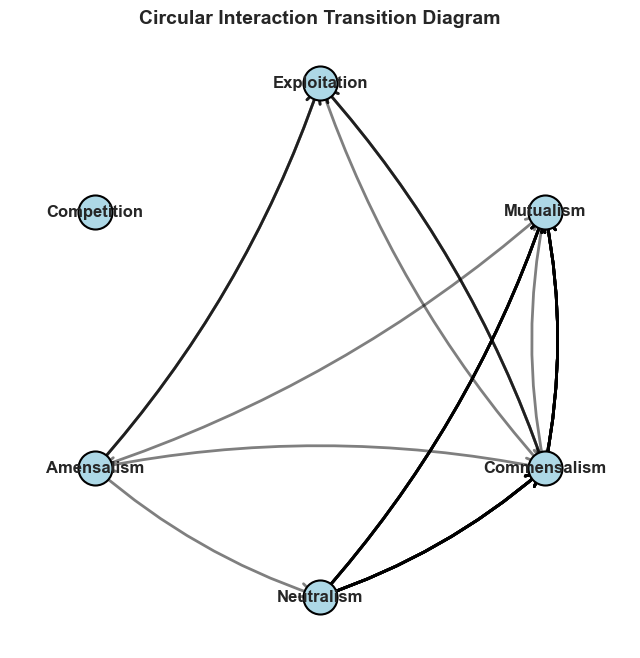

In [324]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch

# Define fixed positions for interaction types
interaction_positions = {
    "exploitation": (0, 1),        # Top
    "mutualism": (0.87, 0.5),      # Right-upper
    "commensalism": (0.87, -0.5),  # Right-lower
    "neutralism": (0, -1),         # Bottom
    "amensalism": (-0.87, -0.5),   # Left-lower
    "competition": (-0.87, 0.5)    # Left-upper
}


# Create figure
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-1.2, 1.2)
ax.set_ylim(-1.2, 1.2)
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

# Draw interaction type positions as labeled points
for interaction, pos in interaction_positions.items():
    ax.scatter(*pos, s=600, color="lightblue", edgecolor="black", zorder=2)
    ax.text(*pos, interaction.capitalize(), fontsize=12, ha="center", va="center", fontweight="bold")

# Function to draw a curved arrow between points
def draw_curved_arrow(start, end, color="black"):
    arrow = FancyArrowPatch(start, end, connectionstyle="arc3,rad=0.1",
                            arrowstyle="->", mutation_scale=25, color=color, alpha=0.5, lw=2)
    ax.add_patch(arrow)

# Draw transitions based on sequences
for seq in rpairdict.values():
    for i in range(len(seq) - 1):
        start_pos = interaction_positions[seq[i]]
        end_pos = interaction_positions[seq[i + 1]]
        draw_curved_arrow(start_pos, end_pos)

plt.title("Circular Interaction Transition Diagram", fontsize=14, fontweight="bold")
plt.show()


In [88]:
tab20

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

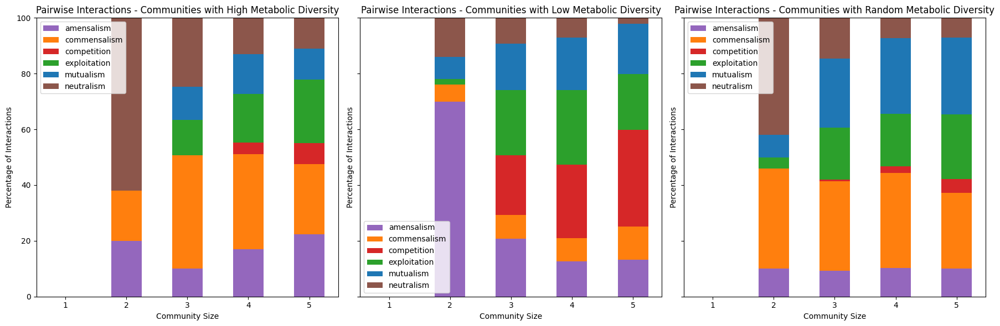

In [87]:
import matplotlib.pyplot as plt
import numpy as np, seaborn as sns

# Use a colorblind-friendly palette
palette = plt.get_cmap("tab10")

# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
colors = {interaction: palette(i) for i, interaction in enumerate(interaction_types)}
bar_width = 0.5

def plot_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    interaction_types = set()

    # Extract all interaction types dynamically
    for category in categories:
        for size, interactions in interaction_dict[category].items():
            interaction_types.update(interactions.keys())

    interaction_types = sorted(interaction_types)  # Sort for consistent order
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    for idx, category in enumerate(categories):
        ax = axes[idx]
        sizes = sorted(interaction_dict[category].keys())
        data = {itype: np.array([interaction_dict[category].get(size, {}).get(itype, 0) for size in sizes]) 
                for itype in interaction_types}

        # Compute total interactions per community size
        total_counts = np.sum([data[itype] for itype in interaction_types], axis=0)
        total_counts[total_counts == 0] = 1  # Avoid division by zero

        # Convert raw counts to percentages
        for itype in interaction_types:
            data[itype] = (data[itype] / total_counts) * 100

        bottom = np.zeros(len(sizes))  # Initialize stacking baseline

        for itype in interaction_types:
            ax.bar(sizes, data[itype], label=itype, bottom=bottom, color=colors[itype], width=bar_width)
            bottom += data[itype]  # Update bottom for stacking

        ax.set_title(f"Pairwise Interactions - Communities with {category.capitalize()} Metabolic Diversity")
        ax.set_xlabel("Community Size")
        ax.set_ylabel("Percentage of Interactions")
        ax.set_ylim(0, 100)  # Ensure it is always from 0 to 100
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_stacked_bars(rinteraction_dict)


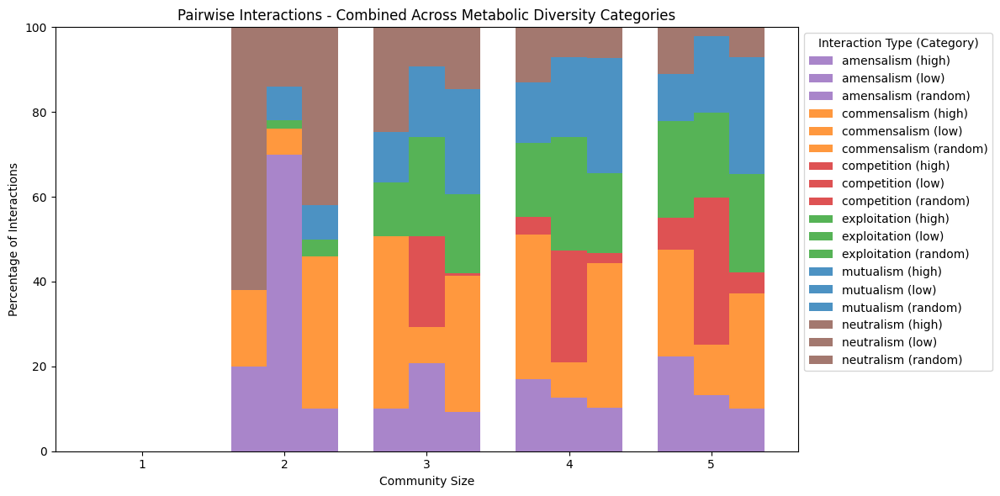

In [89]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Use a colorblind-friendly palette
palette = plt.get_cmap("tab10")

# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
colors = {interaction: palette(i) for i, interaction in enumerate(interaction_types)}
bar_width = 0.25  # Narrower bars to accommodate all categories

def plot_combined_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    interaction_types = set()

    # Extract all interaction types dynamically
    for category in categories:
        for size, interactions in interaction_dict[category].items():
            interaction_types.update(interactions.keys())

    interaction_types = sorted(interaction_types)  # Sort for consistent order
    sizes = sorted(set(size for category in categories for size in interaction_dict[category].keys()))  # Get all unique sizes

    fig, ax = plt.subplots(figsize=(12, 6))

    # Initialize dictionary to store stacked data
    data = {category: {itype: np.array([interaction_dict[category].get(size, {}).get(itype, 0) for size in sizes]) 
                       for itype in interaction_types} for category in categories}

    # Compute total interactions per community size per category
    total_counts = {category: np.sum([data[category][itype] for itype in interaction_types], axis=0) for category in categories}

    for category in categories:
        total_counts[category][total_counts[category] == 0] = 1  # Avoid division by zero

        # Convert raw counts to percentages
        for itype in interaction_types:
            data[category][itype] = (data[category][itype] / total_counts[category]) * 100

    # Define x positions for grouped bars
    x_positions = {category: np.array(sizes) + (i - 1) * bar_width for i, category in enumerate(categories)}

    # Initialize bottom stacking baselines for each category
    bottom = {category: np.zeros(len(sizes)) for category in categories}

    for itype in interaction_types:
        for category in categories:
            ax.bar(x_positions[category], data[category][itype], label=f"{itype} ({category})", 
                   bottom=bottom[category], color=colors[itype], width=bar_width, alpha=0.8)
            bottom[category] += data[category][itype]  # Update bottom for stacking

    ax.set_title("Pairwise Interactions - Combined Across Metabolic Diversity Categories")
    ax.set_xlabel("Community Size")
    ax.set_ylabel("Percentage of Interactions")
    ax.set_xticks(sizes)
    ax.set_xticklabels(sizes)
    ax.set_ylim(0, 100)  # Ensure it is always from 0 to 100
    ax.legend(loc="upper left", bbox_to_anchor=(1, 1), title="Interaction Type (Category)")

    plt.tight_layout()
    plt.show()

plot_combined_stacked_bars(rinteraction_dict)


In [137]:
cbline

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

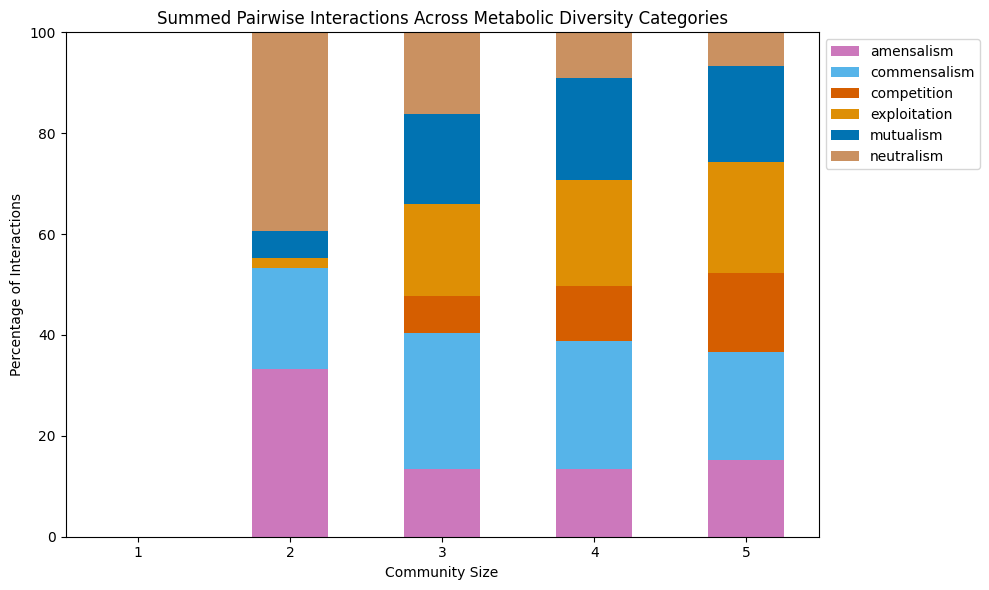

In [139]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Use a colorblind-friendly palette
#palette = plt.get_cmap("tab10")
colors = {"mutualism": cbline[0],
    "commensalism": cbline[-1],
    "exploitation": cbline[1],
    "competition": cbline[3],
    "amensalism": cbline[4],
    "neutralism": cbline[5]
}
# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
#colors = {interaction: palette(i) for i, interaction in enumerate(interaction_types)}
bar_width = 0.5  # Standard width for single bars

def plot_summed_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    interaction_types = set()

    # Extract all interaction types dynamically
    for category in categories:
        for size, interactions in interaction_dict[category].items():
            interaction_types.update(interactions.keys())

    interaction_types = sorted(interaction_types)  # Sort for consistent order
    sizes = sorted(set(size for category in categories for size in interaction_dict[category].keys()))  # Get all unique sizes

    fig, ax = plt.subplots(figsize=(10, 6))

    # Initialize summed data storage
    summed_data = {itype: np.zeros(len(sizes)) for itype in interaction_types}

    # Sum counts across all categories
    for idx, size in enumerate(sizes):
        for category in categories:
            for itype in interaction_types:
                summed_data[itype][idx] += interaction_dict[category].get(size, {}).get(itype, 0)

    # Compute total interactions per community size
    total_counts = np.sum([summed_data[itype] for itype in interaction_types], axis=0)
    total_counts[total_counts == 0] = 1  # Avoid division by zero

    # Convert raw counts to percentages
    for itype in interaction_types:
        summed_data[itype] = (summed_data[itype] / total_counts) * 100

    # Initialize stacking baseline
    bottom = np.zeros(len(sizes))

    # Plot stacked bars
    for itype in interaction_types:
        ax.bar(sizes, summed_data[itype], label=itype, bottom=bottom, color=colors[itype], width=bar_width)
        bottom += summed_data[itype]  # Update stacking baseline

    ax.set_title("Summed Pairwise Interactions Across Metabolic Diversity Categories")
    ax.set_xlabel("Community Size")
    ax.set_ylabel("Percentage of Interactions")
    ax.set_ylim(0, 100)  # Ensure it is always from 0 to 100
    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    plt.tight_layout()
    plt.show()

plot_summed_stacked_bars(rinteraction_dict)


#### invasion analysis

In [94]:
# Convert to a DataFrame
invdict = {}

cate = ['high', 'low', 'random']

for type in cate:
    rows = []
    for seq_idx, invasions in rinvasion_dict[type].items():
        for invasion_idx, details in invasions.items():
            row = {
                'seq_index': seq_idx,
                'seq': rseq_dict[seq_idx],
                'invasion_idx': invasion_idx,
                'invader': details.get('invader'),
                'resident': details.get('resident'),
                'invasibility': details.get('invasibility'),
                'invasion_effect': details.get('invasion_effect')
            }
            rows.append(row)
    df = pd.DataFrame(rows)
    invdict[type] = {}
    
    for i in range(1, 6):
        invdict[type][i] = df[df['invasion_idx']==i]['invasion_effect'].value_counts()

#invdict

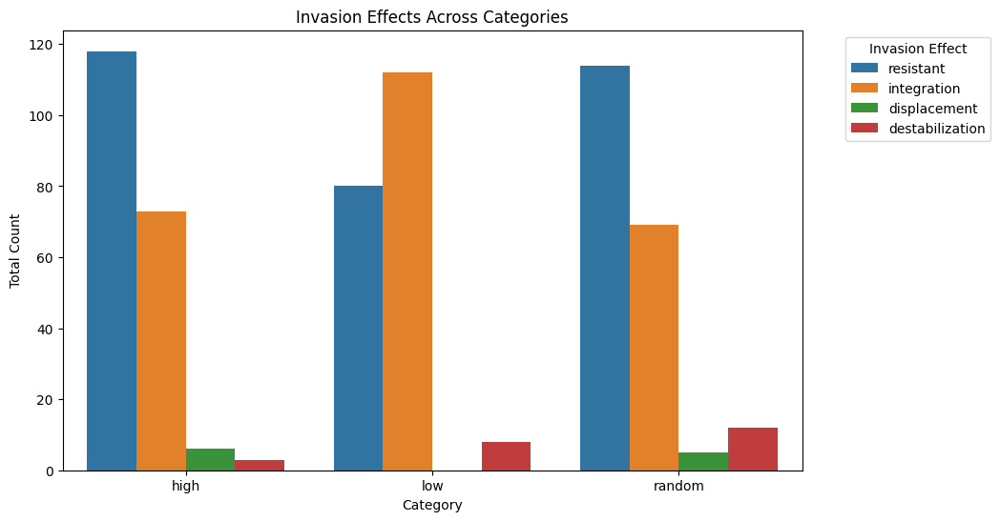

In [95]:
sumcounts = {}
inveffect = ['resistant', 'integration', 'displacement', 'destabilization']
for type in cate:
    sumcounts[type] = {}
    for eff in inveffect:
        sumcounts[type][eff] = 0
        for i in range(1, 6):
            if eff in invdict[type][i].index:
                sumcounts[type][eff] += invdict[type][i][eff]

# Convert to DataFrame
df = pd.DataFrame(sumcounts).T.reset_index().melt(id_vars='index', var_name='invasion_effect', value_name='count')

# Rename columns for clarity
df.rename(columns={'index': 'category'}, inplace=True)

# Plot grouped bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="category", y="count", hue="invasion_effect", data=df, palette="tab10")

# Titles and labels
plt.title("Invasion Effects Across Categories")
plt.xlabel("Category")
plt.ylabel("Total Count")
plt.legend(title="Invasion Effect", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

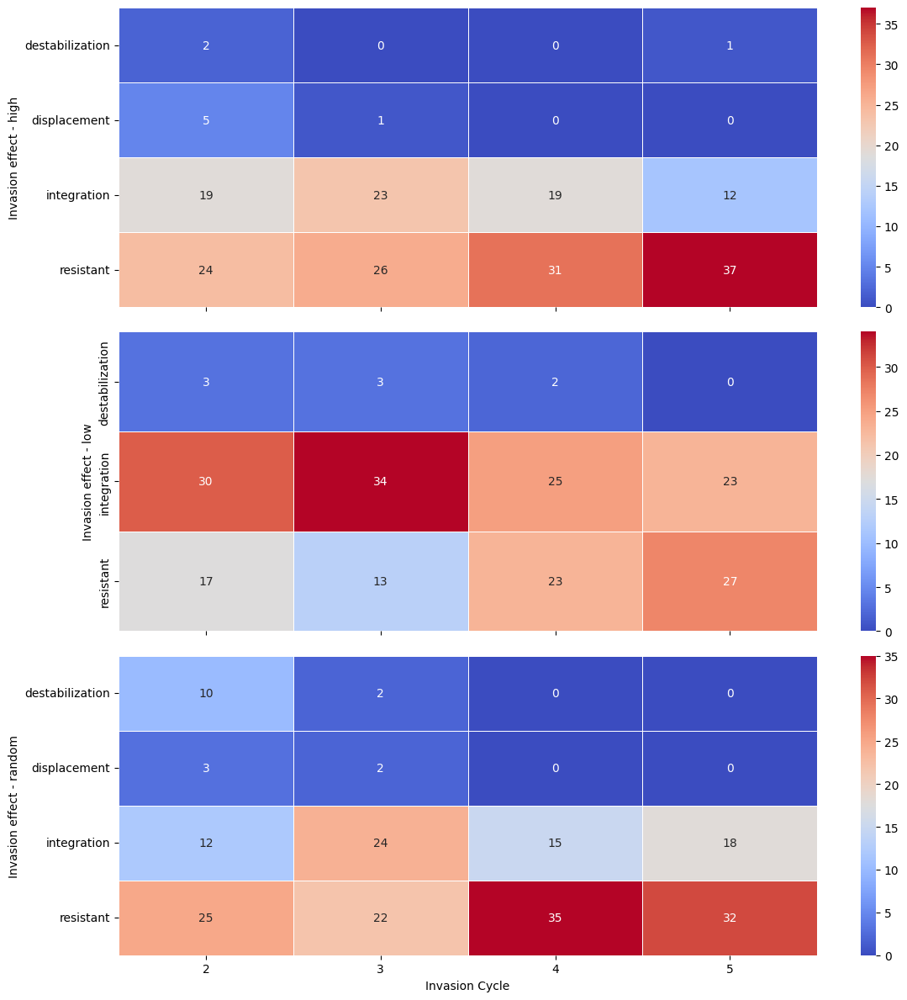

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming your dictionary is named `data_dict`
categories = ["high", "low", "random"]  # Adjust based on your actual categories
fig, axes = plt.subplots(nrows=3, figsize=(12, 12), sharex=True)  # Create 3 vertically stacked subplots

for i, category in enumerate(categories):
    # Convert dictionary to DataFrame
    category_df = pd.concat(invdict[category]).reset_index()
    category_df = category_df.pivot(index="invasion_effect", columns="level_0", values="count").fillna(0)
    
    # Plot heatmap
    sns.heatmap(category_df, cmap="coolwarm", annot=True, linewidths=0.5, ax=axes[i])
    
    # Titles
    #axes[i].set_title(f"Invasion Effects - {category.capitalize()} Interaction Level")
    axes[i].set_xlabel(None)
    axes[i].set_ylabel(f"Invasion effect - {category}")

# Set common x-axis label
axes[-1].set_xlabel("Invasion Cycle")

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [103]:
invdict

{'high': {1: Series([], Name: count, dtype: int64),
  2: invasion_effect
  resistant          24
  integration        19
  displacement        5
  destabilization     2
  Name: count, dtype: int64,
  3: invasion_effect
  resistant       26
  integration     23
  displacement     1
  Name: count, dtype: int64,
  4: invasion_effect
  resistant      31
  integration    19
  Name: count, dtype: int64,
  5: invasion_effect
  resistant          37
  integration        12
  destabilization     1
  Name: count, dtype: int64},
 'low': {1: Series([], Name: count, dtype: int64),
  2: invasion_effect
  integration        30
  resistant          17
  destabilization     3
  Name: count, dtype: int64,
  3: invasion_effect
  integration        34
  resistant          13
  destabilization     3
  Name: count, dtype: int64,
  4: invasion_effect
  integration        25
  resistant          23
  destabilization     2
  Name: count, dtype: int64,
  5: invasion_effect
  resistant      27
  integration    2

In [127]:
cbline = sns.color_palette('colorblind')

In [129]:
cbline[2]

(0.00784313725490196, 0.6196078431372549, 0.45098039215686275)

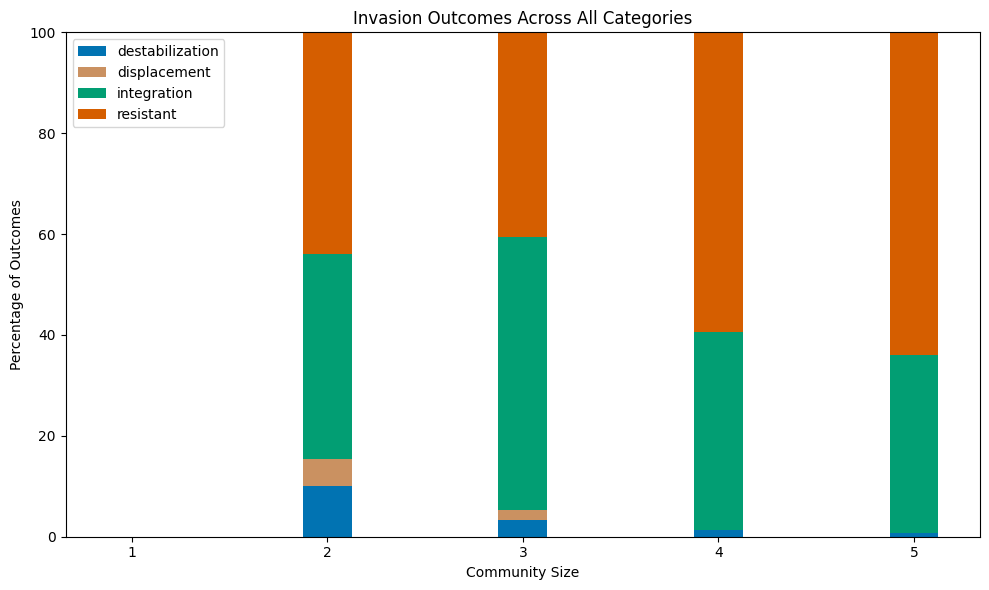

In [135]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Use a colorblind-friendly palette
colors = {"integration": cbline[2],   "resistant": cblind[2],
              "displacement": cbline[5],
                "destabilization": cbline[0]}
           
           #plt.get_cmap("dark2")


# Define invasion outcomes
invasion_outcomes = ["destabilization", "displacement", "resistant", "integration"]

# Assign colors to invasion outcomes
#colors = {outcome: palette(i) for i, outcome in enumerate(invasion_outcomes)}
bar_width = 0.25  # Standard bar width

def plot_stacked_bars_invasion(invdict):
    categories = ['high', 'low', 'random']
    invasion_outcomes = set()
    all_sizes = set()

    # Extract all unique invasion outcomes and community sizes
    for category in categories:
        for size, outcomes in invdict[category].items():
            invasion_outcomes.update(outcomes.keys())
            all_sizes.add(size)

    invasion_outcomes = sorted(invasion_outcomes)  # Sort for consistent order
    all_sizes = sorted(all_sizes)  # Sort community sizes

    # Sum invasion outcomes across categories for each community size
    combined_data = {outcome: np.zeros(len(all_sizes)) for outcome in invasion_outcomes}

    for category in categories:
        for size_idx, size in enumerate(all_sizes):
            for outcome in invasion_outcomes:
                combined_data[outcome][size_idx] += invdict[category].get(size, {}).get(outcome, 0)

    # Compute total invasion outcome counts per community size
    total_counts = np.sum([combined_data[outcome] for outcome in invasion_outcomes], axis=0)
    total_counts[total_counts == 0] = 1  # Avoid division by zero

    # Convert raw counts to percentages
    for outcome in invasion_outcomes:
        combined_data[outcome] = (combined_data[outcome] / total_counts) * 100

    # Plot stacked bar chart
    fig, ax = plt.subplots(figsize=(10, 6))
    bottom = np.zeros(len(all_sizes))  # Initialize stacking baseline

    for outcome in invasion_outcomes:
        ax.bar(all_sizes, combined_data[outcome], label=outcome, bottom=bottom, color=colors[outcome], width=bar_width)
        bottom += combined_data[outcome]  # Update bottom for stacking

    ax.set_title("Invasion Outcomes Across All Categories")
    ax.set_xlabel("Community Size")
    ax.set_ylabel("Percentage of Outcomes")
    ax.set_ylim(0, 100)  # Ensure it is always from 0 to 100
    ax.legend()

    plt.tight_layout()
    plt.show()

# Call function with your invasion dictionary
plot_stacked_bars_invasion(invdict)

In [134]:
cblind

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

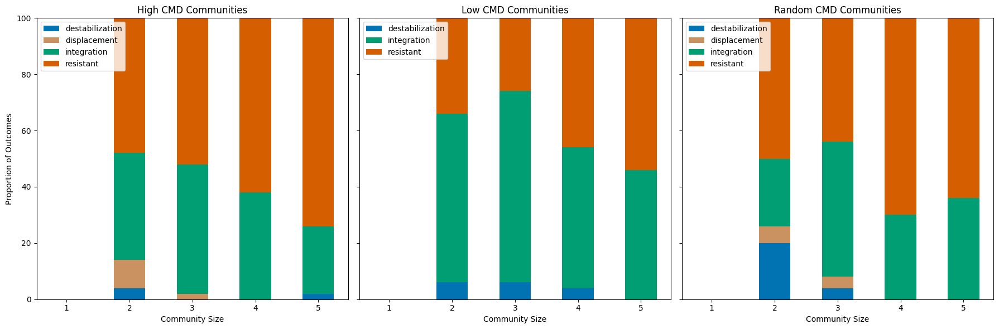

In [136]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Use a colorblind-friendly palette
#palette = plt.get_cmap("tab10")
#palette = plt.get_cmap("Dark1")

# Define invasion outcomes
invasion_outcomes = ["destabilization", "displacement", "resistant", "integration"]

# Assign colors to invasion outcomes
#colors = {outcome: palette(i) for i, outcome in enumerate(invasion_outcomes)}
bar_width = 0.5  # Standard bar width

def plot_stacked_bars_invasion(invdict):
    categories = ['high', 'low', 'random']
    
    # Create subplots: 1 row, 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    for i, category in enumerate(categories):
        invasion_outcomes = set()
        all_sizes = set()

        # Extract all unique invasion outcomes and community sizes for this category
        for size, outcomes in invdict[category].items():
            invasion_outcomes.update(outcomes.keys())
            all_sizes.add(size)

        invasion_outcomes = sorted(invasion_outcomes)  # Sort for consistent order
        all_sizes = sorted(all_sizes)  # Sort community sizes

        # Initialize data storage
        category_data = {outcome: np.zeros(len(all_sizes)) for outcome in invasion_outcomes}

        # Populate data for this category
        for size_idx, size in enumerate(all_sizes):
            for outcome in invasion_outcomes:
                category_data[outcome][size_idx] = invdict[category].get(size, {}).get(outcome, 0)

        # Compute total invasion outcome counts per community size
        total_counts = np.sum([category_data[outcome] for outcome in invasion_outcomes], axis=0)
        total_counts[total_counts == 0] = 1  # Avoid division by zero

        # Convert raw counts to percentages
        for outcome in invasion_outcomes:
            category_data[outcome] = (category_data[outcome] / total_counts) * 100

        # Plot stacked bar chart for this category
        bottom = np.zeros(len(all_sizes))  # Initialize stacking baseline
        for outcome in invasion_outcomes:
            axes[i].bar(all_sizes, category_data[outcome], label=outcome, bottom=bottom, color=colors[outcome], width=bar_width)
            bottom += category_data[outcome]  # Update bottom for stacking

        axes[i].set_title(f"{category.capitalize()} CMD Communities")  # Set subplot title
        axes[i].set_xlabel("Community Size")
        if i == 0:
            axes[i].set_ylabel("Proportion of Outcomes")  # Label y-axis only for first plot
        axes[i].set_ylim(0, 100)  # Ensure consistent y-axis scaling
        axes[i].legend()

    plt.tight_layout()
    plt.show()

# Call function with your invasion dictionary
plot_stacked_bars_invasion(invdict)


In [ ]:
# Convert to a DataFrame
rows = []
for seq_idx, invasions in invasion_dict['low'].items():
    for invasion_idx, details in invasions.items():
        row = {
            'seq_index': seq_idx,
            'invasion_idx': invasion_idx,
            'invader': details.get('invader'),
            'resident': details.get('resident'),
            'invasibility': details.get('invasibility'),
            'invasion_effect': details.get('invasion_effect')
        }
        rows.append(row)

df = pd.DataFrame(rows)

# Display the DataFrame
df.head()

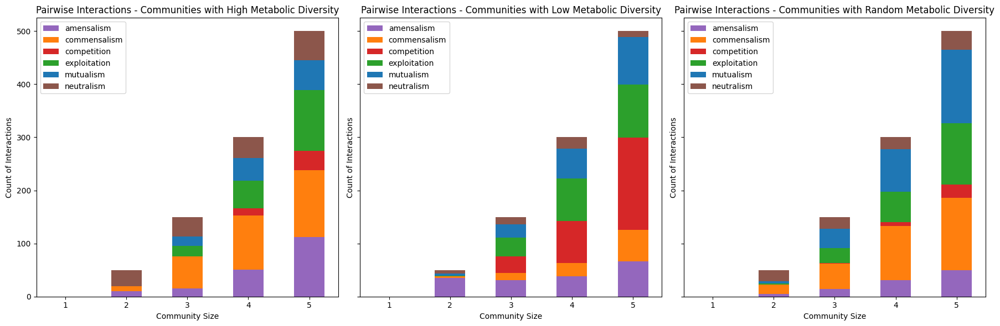

### dump - ignore

In [248]:
categories = {}

for df in [rhseq, rlseq, rseq]:
    seqlist = []
    for index, row in df.iterrows():
        slist = row['seq'] 
        if isinstance(slist, str):  # Convert string representation of a list to an actual list
            slist = ast.literal_eval(slist)
            seqlist.append(slist)
        #print(slist)
        if df is rhseq:
            categories['high'] = seqlist
        elif df is rlseq:
            categories['low'] = seqlist
        else:
            categories['random'] = seqlist

In [245]:
node_dict = {}
for index, row in rhseq.iterrows():
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    for node in slist:
        if node not in node_dict:
            node_dict[node] = 1
        else:
            node_dict[node] += 1
#node_dict                    

node_dict1 = {}
for index, row in rlseq.iterrows():
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    for node in slist:
        if node not in node_dict1:
            node_dict1[node] = 1
        else:
            node_dict1[node] += 1

node_dict2 = {}
for index, row in rseq.iterrows():
    slist = row['seq'] 
    if isinstance(slist, str):  # Convert string representation of a list to an actual list
        slist = ast.literal_eval(slist)
    for node in slist:
        if node not in node_dict2:
            node_dict2[node] = 1
        else:
            node_dict2[node] += 1           

print(len(node_dict), len(node_dict1), len(node_dict2))

24 25 100


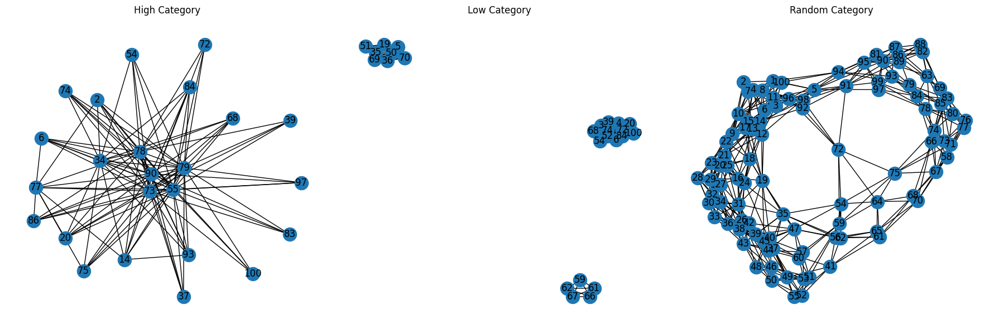

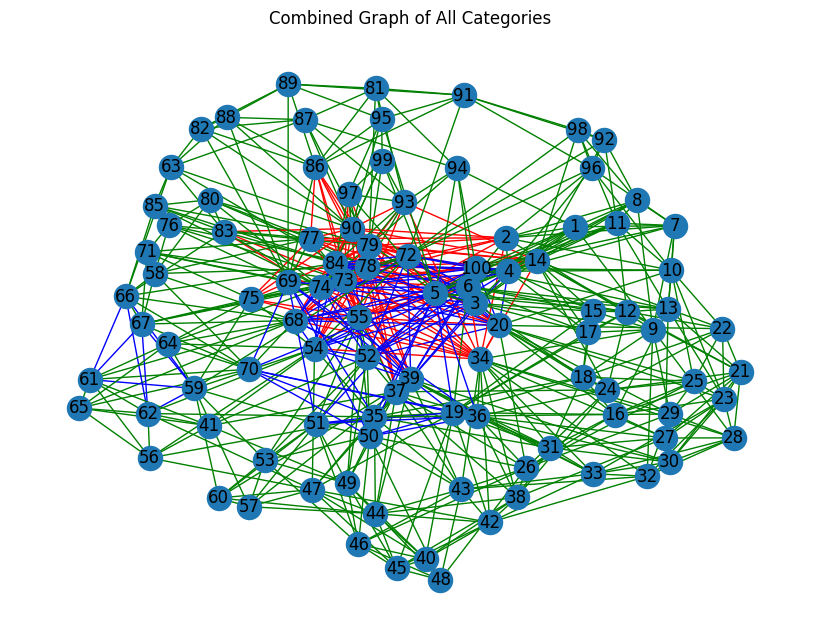

In [249]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Function to create and plot networks for each category
def plot_networks(categories):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    all_graph = nx.Graph()  # Combined graph for later

    #colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta']
    colors = {'high': 'red', 'low': 'blue', 'random': 'green'}

    for idx, (category, sequences) in enumerate(categories.items()):
        G = nx.Graph()
        ax = axes[idx]

        for i, seq in enumerate(sequences):
            #color = colors[i % len(colors)]  # Assign color to sequence
            edges = [(seq[j], seq[k]) for j in range(len(seq)) for k in range(j + 1, len(seq))]
            G.add_edges_from(edges, color='black')  # Add to category graph
            all_graph.add_edges_from(edges, color=colors[category])  # Add to combined graph

        # Get edge colors
        edge_colors = [G[u][v]['color'] for u, v in G.edges]

        # Plot the network
        pos = nx.spring_layout(G)  # Fixed layout for consistency
        nx.draw(G, pos, ax=ax, node_size=300, with_labels=True, edge_color=edge_colors)
        ax.set_title(f"{category.capitalize()} Category")

    plt.tight_layout()
    plt.show()

    # Plot the combined graph
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(all_graph, seed=42)
    edge_colors = [all_graph[u][v]['color'] for u, v in all_graph.edges]
    nx.draw(all_graph, pos, node_size=300, with_labels=True, edge_color=edge_colors)
    plt.title("Combined Graph of All Categories")
    plt.show()

# Plot the networks
plot_networks(categories)


#### low new 6 sequences - non redundant

In [ ]:
seqlist = [[39, 52, 54, 72, 100], [3, 4, 6, 20, 84], [5, 19, 36, 50, 69], [9, 18, 25, 32, 88], [91, 92, 93, 94, 95], [12, 75, 80, 81, 82]]
seqbiodf = pd.DataFrame()
count = 1
for seq in seqlist:
    seqbiodf = invasion_run(seq)
    seqbiodf.to_csv(f'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/low/invasion_seq_{count}.csv', index=False)
    count += 1

    

In [403]:
seqlist = [[39, 52, 54, 72, 100], [3, 4, 6, 20, 84], [5, 19, 36, 50, 69], [9, 18, 25, 32, 88], [91, 92, 93, 94, 95], [12, 75, 80, 81, 82]]

#lowseq
folpath = 'C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/inv_seq/low/'
seqlistdict_melted = {}
for i in range(1, 7):
    biodf = pd.read_csv(f'{folpath}invasion_seq_{i}.csv')
    melti = pd.melt(biodf, id_vars=['cycle', 'invseq'], var_name='model', value_name='biomass')
    melti['ovcycle'] = melti['cycle'] + (melti['invseq']-1)*100
    seqlistdict_melted[i] = melti

networks_dict_new = {}
networks_dict_new['low'] = {}

count = 1
for seq in seqlist:
    print('index:', count)
    mlist = []
    for s in seq:
        mlist.append(f'model{s}')
    print('Processing low sequence:', mlist)
    networks_dict_new['low'][count] = build_invasion_network(seqlistdict_melted[count], monoculture_melt, mlist)    
    count += 1

index: 1
Processing low sequence: ['model39', 'model52', 'model54', 'model72', 'model100']
invseq: 1
model: model39
effect_on_invader: high growth
invseq: 2
model: model39
model: model52
effect_on_invader: minimal growth
effect_on_resident: neutral
effect_on_resident_members: {'model39': 'neutral'}
Invasibility: low
Interaction Type: augmentation
interaction between model39 and model52 : amensalism
invseq: 3
model: model39
model: model52
model: model54
effect_on_invader: high growth
effect_on_resident: neutral
effect_on_resident_members: {'model39': 'neutral', 'model52': 'neutral'}
Invasibility: high
Interaction Type: augmentation
interaction between model39 and model52 : exploitation
interaction between model39 and model54 : exploitation
interaction between model52 and model54 : competition
invseq: 4
model: model39
model: model52
model: model54
model: model72
effect_on_invader: minimal growth
effect_on_resident: positive
effect_on_resident_members: {'model39': 'neutral', 'model52': 'n

In [404]:
from collections import Counter

# final interactions - five membered community
interaction_dict_new = {}
interaction_dict_new['low'] = {}

invasion_dict_new = {}
invasion_dict_new['low'] = {}

for i in range(1,6):
    # Store interaction counts for all sequences
    interaction_summary = Counter()
    interaction_dict_new['low'][i] = {}

    for networks in networks_dict_new['low'].values():

        # Extract the last invasion cycle (cycle i)
        G = networks[i]

        # Count interactions in cycle 5
        cycle_counts = Counter()

        for _, _, data in G.edges(data=True):
            interaction = data.get("interaction")  # Default to neutralism if missing
            cycle_counts[interaction] += 1

        # Update overall summary
        interaction_summary.update(cycle_counts)


    for interaction, count in interaction_summary.items():
        interaction_dict_new['low'][i][interaction] = count

    # invasion effects
    for i in range(1, 7):
        invasion_dict_new['low'][i] = {}
        for invseq in range(1, 6):
            G = networks_dict_new['low'][i][invseq]
            inv_effect = G.graph.get('effect_on_invader')
            if invseq > 1:
                res_effect = G.graph.get('effect_on_resident')
            else:
                res_effect = None
            invasibility = G.graph.get('invasibility')
            invasion_effect = G.graph.get('invasion_effect')
            
            invasion_dict_new['low'][i][invseq] = {'invader': inv_effect, 'resident': res_effect, 'invasibility': invasibility, 'invasion_effect': invasion_effect}
    

In [407]:
interaction_dict_new['low']
invasion_dict_new['low']

{1: {1: {'invader': 'high growth',
   'resident': None,
   'invasibility': None,
   'invasion_effect': None},
  2: {'invader': 'minimal growth',
   'resident': 'neutral',
   'invasibility': 'low',
   'invasion_effect': 'augmentation'},
  3: {'invader': 'high growth',
   'resident': 'neutral',
   'invasibility': 'high',
   'invasion_effect': 'augmentation'},
  4: {'invader': 'minimal growth',
   'resident': 'positive',
   'invasibility': 'low',
   'invasion_effect': 'exploitation'},
  5: {'invader': 'minimal growth',
   'resident': 'positive',
   'invasibility': 'low',
   'invasion_effect': 'exploitation'}},
 2: {1: {'invader': 'high growth',
   'resident': None,
   'invasibility': None,
   'invasion_effect': None},
  2: {'invader': 'minimal growth',
   'resident': 'neutral',
   'invasibility': 'low',
   'invasion_effect': 'augmentation'},
  3: {'invader': 'high growth',
   'resident': 'neutral',
   'invasibility': 'high',
   'invasion_effect': 'augmentation'},
  4: {'invader': 'high gr

#### old 50 seq analyses

In [398]:
from tqdm import tqdm  # Import tqdm for progress bar

for index, row in tqdm(lseq.reset_index(drop=True).head(50).iterrows(), total=50, desc="Processing Sequences"):
    if index > 2:
        #print(index)
        seq = [row['s1'], row['s2'], row['s3'], row['s4'], row['s5']]
        #print(seq)
        #biodf = invasion_run(seq)
        #lseqdict[index+1] = biodf
        #biodf.to_csv(f'C:/Users/sabh/Desktop/jd_thesis/cometspy/incbiomass/seq_inv/lowseq/lseq{index+1}.csv')
        #print ("*************************************")

Processing Sequences:   6%|▌         | 3/50 [00:00<00:00, 423.67it/s]

3
[3, 20, 72, 84, 100]


# plots

## eda

In [25]:
tab20 = sns.color_palette("tab20", 20)
tab20

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [4]:
monoculture = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/monoculture_biomass.csv', index_col=0)

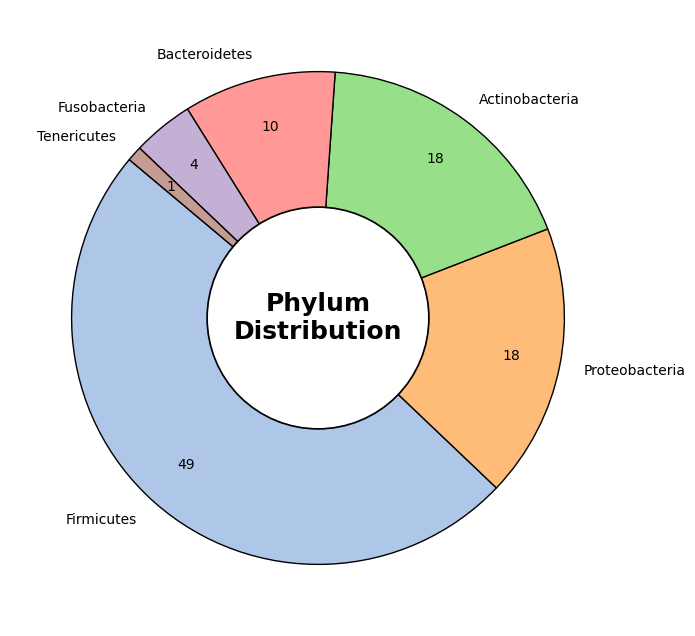

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Count occurrences of each phylum
phylum_counts = pd.Series(phylum_dict.values()).value_counts()
labels = phylum_counts.index
sizes = phylum_counts.values

phylum_colors = {
    "Proteobacteria": tab20[3],  # Red
    "Firmicutes": tab20[1],      # Orange
    "Actinobacteria": tab20[5],  # Green
    "Bacteroidetes": tab20[7],   # Dark Blue
    "Fusobacteria": tab20[9],
    "Tenericutes": tab20[11] }

# Custom function to show only counts (not percentages)
def count_labels(pct, all_vals):
    absolute = int(round(pct/100. * sum(all_vals)))  # Convert percentage to actual count
    return f"{absolute}" if absolute > 0 else ""  # Show count, hide zero values

colors = [phylum_colors.get(phylum, "#A8DADC") for phylum in labels]

# Create a donut chart
fig, ax = plt.subplots(figsize=(8, 8))
#colors = sns.color_palette("tab10", len(labels))
wedges, texts, autotexts = ax.pie(
    sizes, labels=labels, autopct=lambda pct: count_labels(pct, sizes), 
    startangle=140, colors=colors, wedgeprops={'edgecolor': 'black'}, pctdistance=0.8
)

# Draw a white circle in the middle to create the donut effect
centre_circle = plt.Circle((0, 0), 0.45, fc='white', edgecolor='black', linewidth=1.25)
fig.gca().add_artist(centre_circle)

# Add title inside the hole
ax.text(0, 0, "Phylum\nDistribution", fontsize=18, fontweight='bold',
        ha='center', va='center')

# Improve aesthetics
plt.setp(autotexts, size=10, weight="normal")
plt.show()

## monoculture

In [5]:
# monoculture growth rates by phylum
def monoculture_melt_plot(biodf, phylum_dict, method):
    '''
    method: 'phylum_wise' or 'model_wise'
    '''

    # Reshape the DataFrame
    long_df = biodf.melt(id_vars=["cycle"], var_name="model", value_name="biomass")
    long_df = long_df[long_df['cycle'] <= 50]

    # Extract the numerical part from the model name (e.g., 'model1' -> 1)
    long_df["model_id"] = long_df["model"].str.extract(r"(\d+)").astype(int)

    # Map the family based on the numerical ID
    long_df["phylum"] = long_df["model_id"].map(phylum_dict)
    
    # Plot
    if method == 'phylum_wise':
        plt.figure(figsize=(10, 6))
        sns.lineplot(
            data=long_df,
            x="cycle",
            y="biomass",
            hue="phylum",
            palette="tab10"  # You can adjust the palette
        )

        # Customize the plot
        plt.title(f"Biomass Over Cycles (Phylum)", fontsize=16)
        plt.xlabel("Cycle", fontsize=14)
        plt.ylabel("Biomass", fontsize=14)
        plt.legend(title="Phylum", fontsize=12)
        plt.grid(True)
        plt.show()
    
    elif method == 'model_wise':
        # Set up the subplots for 100 subplots (10 rows x 10 columns)
        fig, axes = plt.subplots(10, 10, figsize=(20, 20))  # 10 rows x 10 columns
        axes = axes.flatten()  # Flatten the axes array for easy iteration

        # Get the model columns (model1, model2, ..., model100)
        model_columns = [f'model{i}' for i in range(1, 101)]

        # Loop through each model column and create a subplot
        for i, model in enumerate(model_columns):
            ax = axes[i]
            
            # Plot biomass for the current model
            sns.lineplot(
                data=long_df,
                x='cycle',  # x-axis is cycle
                y=model,    # y-axis is the biomass for the current model
                ax=ax,
                color="b",  # You can adjust the color as needed
            )
            
            # Customize the subplot
            ax.set_title(f"{model}", fontsize=10)  # Set title with model name
            ax.set_xlabel("Cycle", fontsize=8)  # x-axis label
            ax.set_ylabel("Biomass", fontsize=8)  # y-axis label
            ax.grid(False)

        # Adjust layout to avoid overlap
        plt.tight_layout()

        # Add a total title for the entire figure
        plt.suptitle('Biomass Over Cycles for 100 Models', fontsize=16, y=1.02)

        # Show the plot
        plt.show()

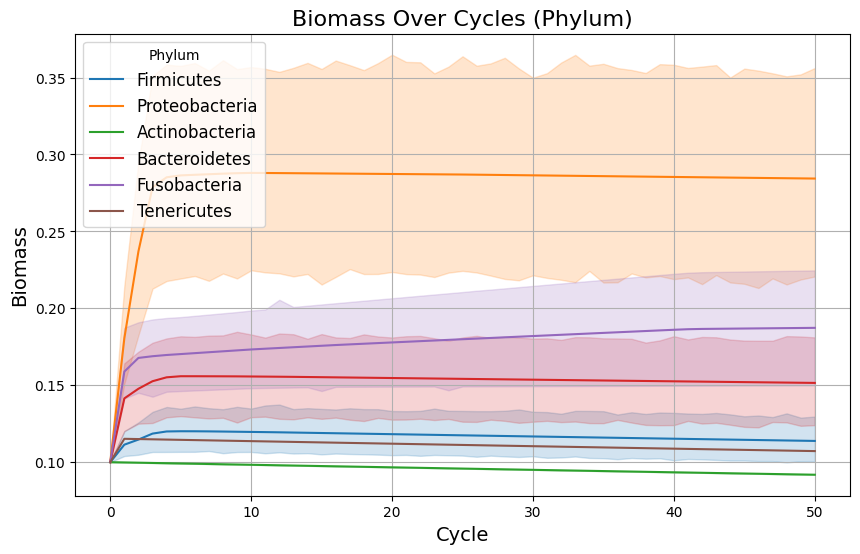

In [11]:
monoculture_melt_plot(monoculture, phylum_dict, 'phylum_wise')

## jaccard distance

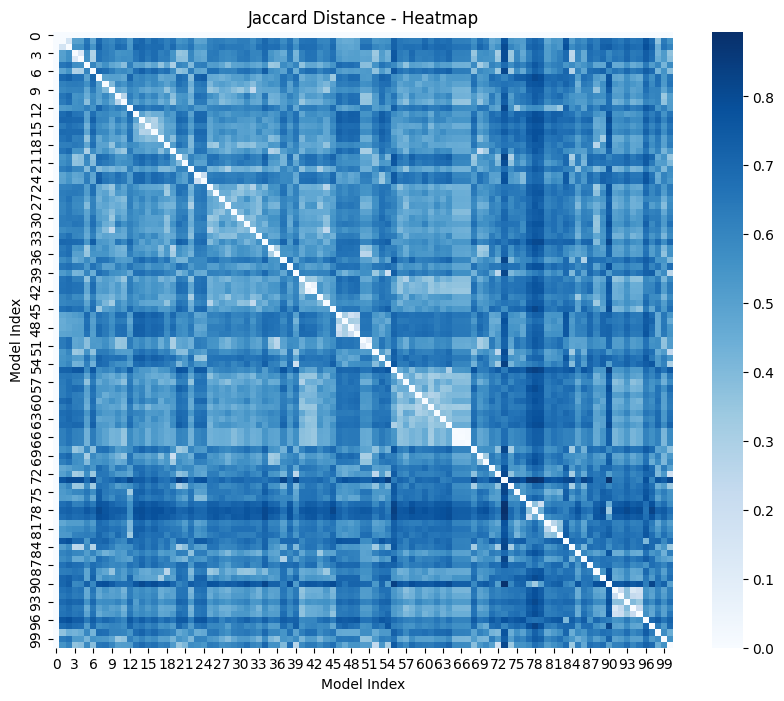

In [55]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(jaccard_matrix, cmap='Blues')
plt.title('Jaccard Distance - Heatmap')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()

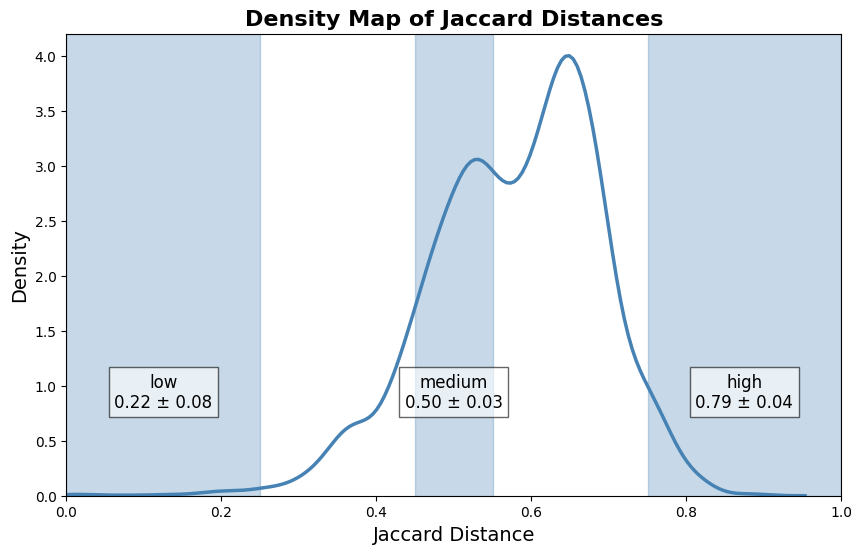

In [58]:
def compute_mean_sd(df):
    mean_val = df['jaccard_distance'].mean()
    std_val = df['jaccard_distance'].std()
    return mean_val, std_val

low = compute_mean_sd(ldpairs)
high = compute_mean_sd(hdpairs)
medium = compute_mean_sd(mdpairs)

# Create the density plot (KDE)
plt.figure(figsize=(10, 6))
sns.kdeplot(pairs_df['jaccard_distance'], color='#4682B4', linewidth=2.5)

# Define marker ranges
#marker_ranges = [(0, 0.25), (0.45, 0.55), (0.75, 1)]

marker_ranges = [
    (0, 0.25, low, 'low'),
    (0.45, 0.55, medium, 'medium'),
    (0.75, 1, high, 'high')
]

# Add vertical shaded regions & text annotations inside bars
for start, end, (mean_val, std_val), label in marker_ranges:
    plt.axvspan(start, end, color='#4682B4', alpha=0.3)
    #plt.text((start + end) / 2, 0.8, color='black', fontsize=12, fontweight='bold', ha='center', bbox=dict(facecolor='white', alpha=0.6))
    plt.text(
        (start + end) / 2, 0.8, f"{label}\n{mean_val:.2f} ± {std_val:.2f}",
        color='black', fontsize=12, fontweight='normal', ha='center',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='black')
    )

# Add vertical shaded regions for markers
#for start, end in marker_ranges:
#    plt.axvspan(start, end, color='#4682B4', alpha=0.3, label=f"Range: {start}-{end}")

plt.xlim(0, 1)

# Titles and labels
plt.xlabel("Jaccard Distance", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Density Map of Jaccard Distances", fontsize=16, fontweight='bold')

# Avoid duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
#if len(handles) > 0:
    #plt.legend(handles[:1], labels[:1], loc="upper right")

plt.show()

In [61]:
phylum_counts = ldpairs[['phylum1', 'phylum2']].apply(pd.Series.value_counts).fillna(0)
print('LOW')
print(phylum_counts)
phylum_counts = hdpairs[['phylum1', 'phylum2']].apply(pd.Series.value_counts).fillna(0)
print('HIGH')
print(phylum_counts)
phylum_counts = mdpairs[['phylum1', 'phylum2']].apply(pd.Series.value_counts).fillna(0)
print('MEDIUM')
print(phylum_counts)

LOW
                phylum1  phylum2
Firmicutes           21       21
Proteobacteria       14       14
Actinobacteria        8        8
Fusobacteria          4        4
Bacteroidetes         3        3
HIGH
                phylum1  phylum2
Actinobacteria       13      4.0
Bacteroidetes         6     23.0
Firmicutes           17      9.0
Fusobacteria          1      0.0
Proteobacteria        5     10.0
Tenericutes           8      4.0
MEDIUM
                phylum1  phylum2
Firmicutes           25       28
Actinobacteria       13       11
Proteobacteria        9        7
Bacteroidetes         2        2
Fusobacteria          1        2


## pairwise

In [93]:
tab10 = sns.color_palette("tab10")
tab10

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [48]:
analysespairdf

,model1,model2,phylum1,phylum2,jaccard_distance,category,interaction0-50,interaction100-150,interaction200-250,interaction300-350,interaction400-450,alpha400-450,alpha1,alpha2,community_level_interaction
0,65,66,Firmicutes,Firmicutes,0.003704,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.000000,neutral
1,66,67,Firmicutes,Firmicutes,0.014032,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.000000,neutral
2,65,67,Firmicutes,Firmicutes,0.016248,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.000000,neutral
3,41,42,Firmicutes,Firmicutes,0.053191,low,amensalism,amensalism,amensalism,amensalism,amensalism,"(-0.3398692382680315, 0.0)",-0.339869,0.000000,antagonistic interaction
4,50,51,Actinobacteria,Actinobacteria,0.094426,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.000000,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,55,78,Firmicutes,Bacteroidetes,0.841485,high,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, -0.026515456100404445)",0.000000,-0.026515,neutral
146,73,79,Tenericutes,Bacteroidetes,0.876106,high,neutralism,neutralism,neutralism,neutralism,neutralism,"(-0.024701364758651936, -0.02282676590653521)",-0.024701,-0.022827,neutral
147,73,77,Tenericutes,Bacteroidetes,0.877872,high,neutralism,neutralism,neutralism,neutralism,neutralism,"(-0.0480774487319245, -0.014539205596877448)",-0.048077,-0.014539,neutral
148,73,90,Tenericutes,Proteobacteria,0.886492,high,neutralism,neutralism,neutralism,neutralism,neutralism,"(-0.0011914223682359345, 0.02176670229307557)",-0.001191,0.021767,neutral


In [49]:
analysespairdf['community_level_interaction'].value_counts()

community_level_interaction
neutral                     76
antagonistic interaction    53
synergistic interaction     21
Name: count, dtype: int64

In [51]:
53/150

0.35333333333333333

In [34]:

# Count occurrences of each phylum
phylum_counts = pd.Series(phylum_dict.values()).value_counts()
labels = phylum_counts.index
sizes = phylum_counts.values

phylum_colors = {
    "Proteobacteria": tab20[3],  # Red
    "Firmicutes": tab20[1],      # Orange
    "Actinobacteria": tab20[5],  # Green
    "Bacteroidetes": tab20[7],   # Dark Blue
    "Fusobacteria": tab20[9],
    "Tenericutes": tab20[11] }

# Custom function to show only counts (not percentages)
def count_labels(pct, all_vals):
    absolute = int(round(pct/100. * sum(all_vals)))  # Convert percentage to actual count
    return f"{absolute}" if absolute > 0 else ""  # Show count, hide zero values

colors = [phylum_colors.get(phylum, "#A8DADC") for phylum in labels]

# Create a donut chart
fig, ax = plt.subplots(figsize=(8, 8))
#colors = sns.color_palette("tab10", len(labels))
wedges, texts, autotexts = ax.pie(
    sizes, labels=labels, autopct=lambda pct: count_labels(pct, sizes), 
    startangle=140, colors=colors, wedgeprops={'edgecolor': 'black'}, pctdistance=0.8
)

# Draw a white circle in the middle to create the donut effect
centre_circle = plt.Circle((0, 0), 0.45, fc='white', edgecolor='black', linewidth=1.25)
fig.gca().add_artist(centre_circle)

# Add title inside the hole
ax.text(0, 0, "Phylum\nDistribution", fontsize=18, fontweight='bold',
        ha='center', va='center')

# Improve aesthetics
plt.setp(autotexts, size=10, weight="normal")
plt.show()

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [95]:
tab20 = sns.color_palette("tab20")
tab20

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [98]:
def categorize_interaction(interaction):
    if interaction == 'neutralism':
        return 'neutral'
    elif interaction in ['mutualism', 'exploitation', 'commensalism']:
        return 'synergistic interaction'
    elif interaction in ['competition', 'amensalism']:
        return 'antagonistic interaction'
    else:
        return 'unknown'  # For any unexpected values

# Apply function to create new column
analysespairdf['community_level_interaction'] = analysespairdf['interaction400-450'].apply(categorize_interaction)
analysespairdf.head()

,model1,model2,phylum1,phylum2,jaccard_distance,category,interaction0-50,interaction100-150,interaction200-250,interaction300-350,interaction400-450,alpha400-450,alpha1,alpha2,community_level_interaction
0,65,66,Firmicutes,Firmicutes,0.003704,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0,neutral
1,66,67,Firmicutes,Firmicutes,0.014032,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0,neutral
2,65,67,Firmicutes,Firmicutes,0.016248,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0,neutral
3,41,42,Firmicutes,Firmicutes,0.053191,low,amensalism,amensalism,amensalism,amensalism,amensalism,"(-0.3398692382680315, 0.0)",-0.339869,0.0,antagonistic interaction
4,50,51,Actinobacteria,Actinobacteria,0.094426,low,neutralism,neutralism,neutralism,neutralism,neutralism,"(0.0, 0.0)",0.000000,0.0,neutral


In [6]:
print(interaction_types)
values

['exploitation', 'mutualism', 'commensalism', 'neutralism', 'amensalism', 'competition']


{'high': [1, 1, 9, 26, 13, 0],
 'medium': [1, 0, 3, 28, 13, 5],
 'low': [1, 1, 4, 22, 9, 13]}

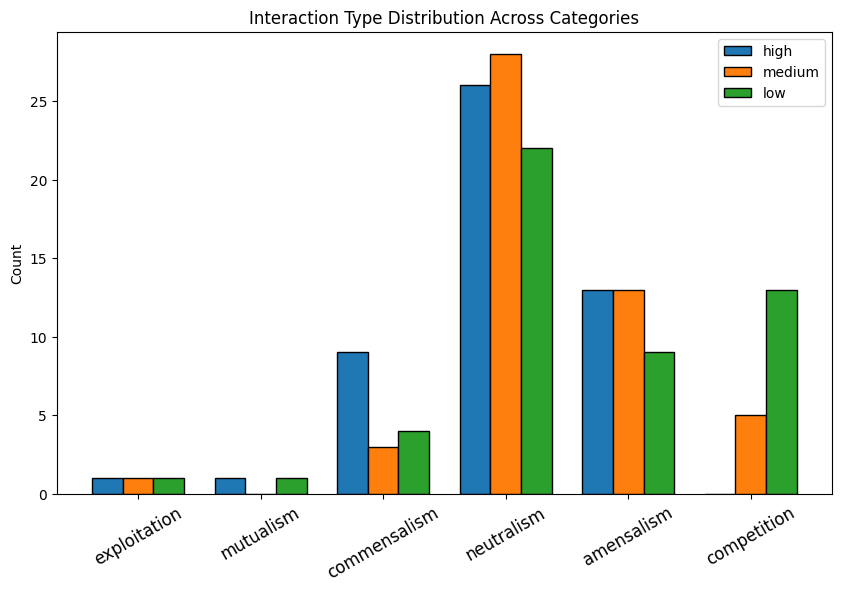

In [4]:
import matplotlib.pyplot as plt
import numpy as np

#analysespairdf = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise_interactions.csv')

# Count occurrences of each interaction type per category (only from interaction400-450)
interaction_counts = analysespairdf.groupby(["category", "interaction400-450"]).size().unstack(fill_value=0)

# Convert to dictionary format for plotting
interaction_counts = interaction_counts.to_dict(orient="index")

# Data preparation
interaction_types = ["exploitation", "mutualism", "commensalism", "neutralism", "amensalism", "competition"]
categories = ["high", "medium", "low"]
tab10_colors = plt.get_cmap("tab10").colors  # Extracts 10 colors
tab20_colors = plt.get_cmap("tab20").colors  # Extracts 20 colors

# Assign colors to categories (ensuring distinct colors)
colors = {
    "high": tab10_colors[0],    # Red
    "medium": tab10_colors[1],  # Orange
    "low": tab10_colors[2]      # Green
}

# Extract values for each category
values = {cat: [interaction_counts[cat].get(it, 0) for it in interaction_types] for cat in categories}

x = np.arange(len(interaction_types))  # Bar positions
width = 0.25  # Bar width

# Create bar plot
fig, ax = plt.subplots(figsize=(10, 6))
for i, cat in enumerate(categories):
    ax.bar(x + i * width, values[cat], width=width, label=cat, color=colors[cat], edgecolor="black")

# Labels and formatting
ax.set_xticks(x + width)
ax.set_xticklabels(interaction_types, fontsize=12, rotation=30)
ax.set_ylabel("Count")
ax.set_title("Interaction Type Distribution Across Categories")
ax.legend()

plt.show()


In [38]:
cblind = sns.color_palette('colorblind6')
cblind

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

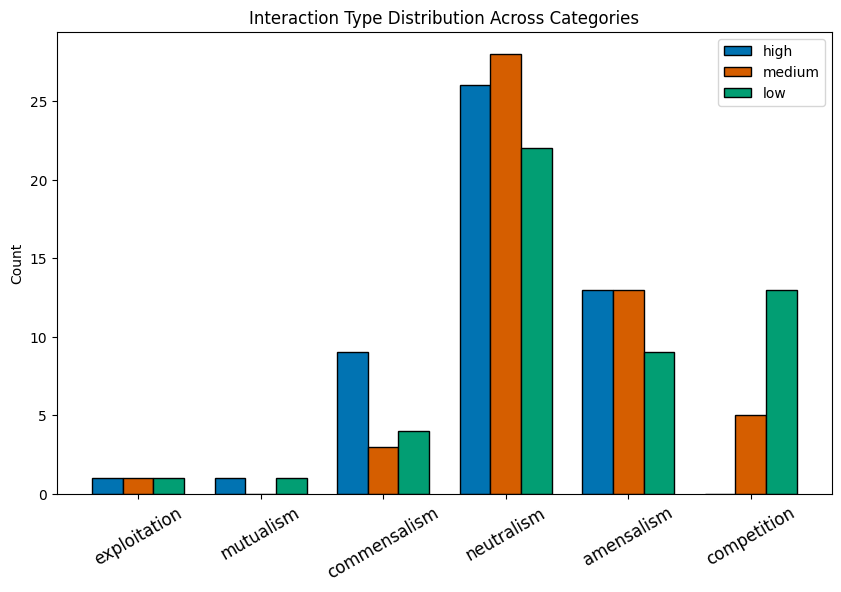

In [70]:
# Count occurrences of each interaction type per category (only from interaction400-450)
interaction_counts = analysespairdf.groupby(["category", "interaction400-450"]).size().unstack(fill_value=0)

# Convert to dictionary format for plotting
interaction_counts = interaction_counts.to_dict(orient="index")

# Data preparation
interaction_types = ["exploitation", "mutualism", "commensalism", "neutralism", "amensalism", "competition"]
categories = ["high", "medium", "low"]
tab10_colors = plt.get_cmap("tab10").colors  # Extracts 10 colors
tab20_colors = plt.get_cmap("tab20").colors  # Extracts 20 colors

# Assign colors to categories (ensuring distinct colors)
colors = {
    "high": cblind[0],    # Red
    "medium": cblind[2], #tab10_colors[1],  # Orange
    "low": cblind[1] #tab10_colors[2]      # Green
}

# Extract values for each category
values = {cat: [interaction_counts[cat].get(it, 0) for it in interaction_types] for cat in categories}

x = np.arange(len(interaction_types))  # Bar positions
width = 0.25  # Bar width

# Create bar plot
fig, ax = plt.subplots(figsize=(10, 6))
for i, cat in enumerate(categories):
    ax.bar(x + i * width, values[cat], width=width, label=cat, color=colors[cat], edgecolor="black")

# Labels and formatting
ax.set_xticks(x + width)
ax.set_xticklabels(interaction_types, fontsize=12, rotation=30)
ax.set_ylabel("Count")
ax.set_title("Interaction Type Distribution Across Categories")
ax.legend()

plt.show()


In [30]:
#analysespairdf.to_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_interactions_ann.csv', index=False)
analysespairdf = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairs50/pairwise_interactions_ann.csv')

In [76]:
interaction_counts

{'high': {'amensalism': 13,
  'commensalism': 9,
  'competition': 0,
  'exploitation': 1,
  'mutualism': 1,
  'neutralism': 26},
 'low': {'amensalism': 9,
  'commensalism': 4,
  'competition': 13,
  'exploitation': 1,
  'mutualism': 1,
  'neutralism': 22},
 'medium': {'amensalism': 13,
  'commensalism': 3,
  'competition': 5,
  'exploitation': 1,
  'mutualism': 0,
  'neutralism': 28}}

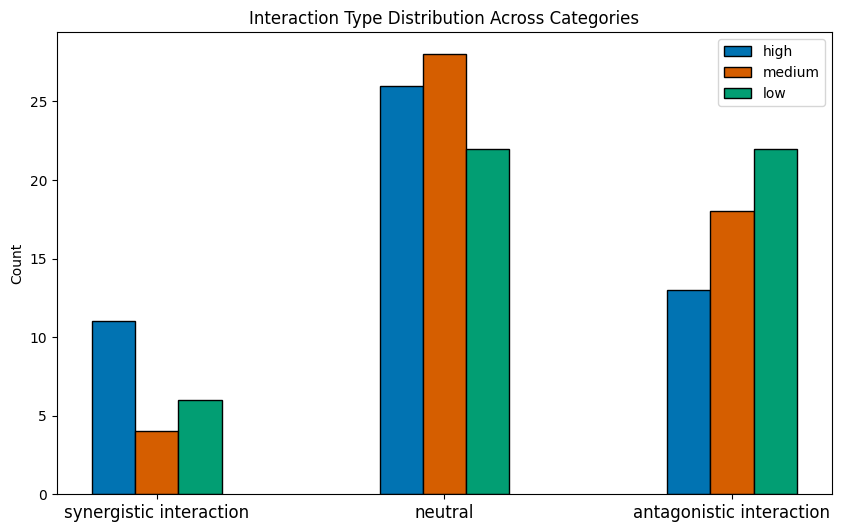

In [44]:
import matplotlib.pyplot as plt
import numpy as np

#analysespairdf = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise_interactions.csv')

# Count occurrences of each interaction type per category (only from interaction400-450)
interaction_counts = analysespairdf.groupby(["category", "community_level_interaction"]).size().unstack(fill_value=0)

# Convert to dictionary format for plotting
interaction_counts = interaction_counts.to_dict(orient="index")

# Data preparation
#interaction_types = ["exploitation", "mutualism", "commensalism", "neutralism", "amensalism", "competition"]
interaction_types = ['synergistic interaction', 'neutral', 'antagonistic interaction']

categories = ["high", "medium", "low"]
tab10_colors = plt.get_cmap("tab10").colors  # Extracts 10 colors
tab20_colors = plt.get_cmap("tab20").colors  # Extracts 20 colors

# Assign colors to categories (ensuring distinct colors)
'''colors = {
    "high": tab10_colors[0],    # Red
    "medium": tab10_colors[1],  # Orange
    "low": tab10_colors[2]      # Green
}'''

# Extract values for each category
values = {cat: [interaction_counts[cat].get(it, 0) for it in interaction_types] for cat in categories}

x = np.arange(len(interaction_types))  # Bar positions
width = 0.15  # Bar width

# Create bar plot
fig, ax = plt.subplots(figsize=(10, 6))
for i, cat in enumerate(categories):
    ax.bar(x + i * width, values[cat], width=width, label=cat, color=colors[cat], edgecolor="black")

# Labels and formatting
ax.set_xticks(x + width)
ax.set_xticklabels(interaction_types, fontsize=12, rotation=0)
ax.set_ylabel("Count")
ax.set_title("Interaction Type Distribution Across Categories")
ax.legend()

plt.show()


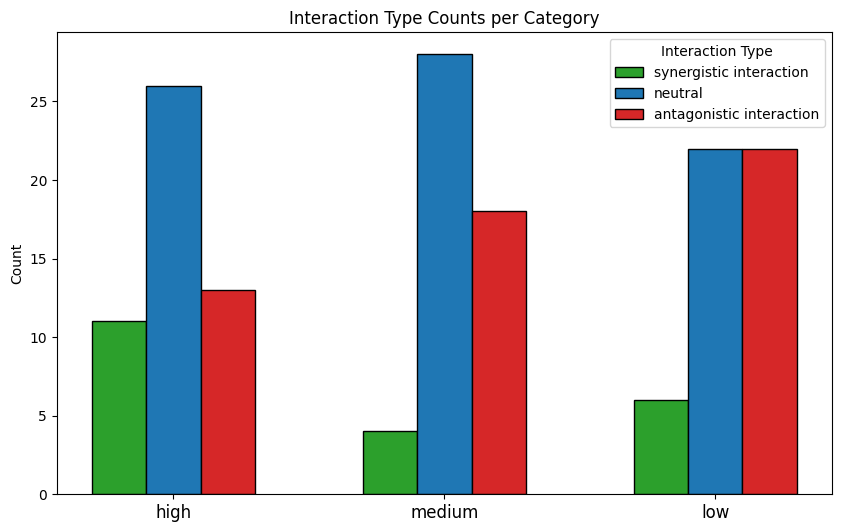

In [69]:
# Define interaction types and categories
interaction_types = ['synergistic interaction', 'neutral', 'antagonistic interaction']
categories = ["high", "medium", "low"]

# Count occurrences of each interaction type within each category
interaction_counts = analysespairdf.groupby(["category", "community_level_interaction"]).size().unstack(fill_value=0)

# Extract counts for each category, ensuring missing interaction types are handled
values = {cat: [interaction_counts.loc[cat, it] if it in interaction_counts.columns else 0 for it in interaction_types] 
          for cat in categories if cat in interaction_counts.index}

# Bar positions and width
x = np.arange(len(categories))
width = 0.2 

# Define colors for each interaction type
tab10_colors = plt.get_cmap("tab10").colors
colors = {
    "synergistic interaction": tab10_colors[2],  # Green
    "neutral": tab10_colors[0],                  # Blue
    "antagonistic interaction": tab10_colors[3]  # Red
}

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

for i, interaction in enumerate(interaction_types):
    interaction_values = [values[cat][i] for cat in categories]
    ax.bar(x + i * width, interaction_values, width=width, label=interaction, color=colors[interaction], edgecolor="black")

# Formatting
ax.set_xticks(x + width)
ax.set_xticklabels(categories, fontsize=12)
ax.set_ylabel("Count")
ax.set_title("Interaction Type Counts per Category")
ax.legend(title="Interaction Type")

# Show the plot
plt.show()

In [ ]:
df = analysespairdf.copy()

plt.figure(figsize=(12, 8))  # Set figure size

custom_palette = {
    "high": tab10[0],  # Red
    "medium": tab10[1],  # Blue
    "low": tab10[2]
}

sns.scatterplot(
    x=df['alpha1'], 
    y=df['alpha2'], 
    hue=df['category'],  # Color by interaction type
    style=df['community_level_interaction'],  # Shape by category
    palette=custom_palette,  # Color palette
    markers=True, #['o', 's', 'D', '^', 'v', '*'],  # Define marker shapes (modify as needed)
    edgecolor='black',  # Add edge color for clarity
    s=120  # Adjust marker size
)
'''
sns.relplot(
    data=df,
    x="alpha1",
    y="alpha2",
    hue="category",  # Color by category
    style="community_level_interaction",  # Shape by interaction type
    palette="tab10",  # Distinct colors
    kind="scatter",
    markers=True,
    edgecolor="black",
    s=120,  # Larger markers for better visibility
    alpha=0.7,  # Transparency for overlap clarity
    height=8, 
    aspect=1.2
)'''


#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.xlabel('Alpha1')
plt.ylabel('Alpha2')

legend = plt.legend(loc='upper right')  # Move legend outside
legend.get_texts()[0].set_text("Category")  # Rename first subtitle
legend.get_texts()[len(df['category'].unique()) + 1].set_text("Community Level Interaction")  # Rename second subtitle

#plt.legend(title='Category')
plt.title('Community Level Interaction vs Category')
plt.show()

{'high': (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 'medium': (0.8352941176470589, 0.3686274509803922, 0.0),
 'low': (0.00784313725490196, 0.6196078431372549, 0.45098039215686275)}

In [56]:
tab10

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [55]:
tab20 = sns.color_palette('tab20')
tab20

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

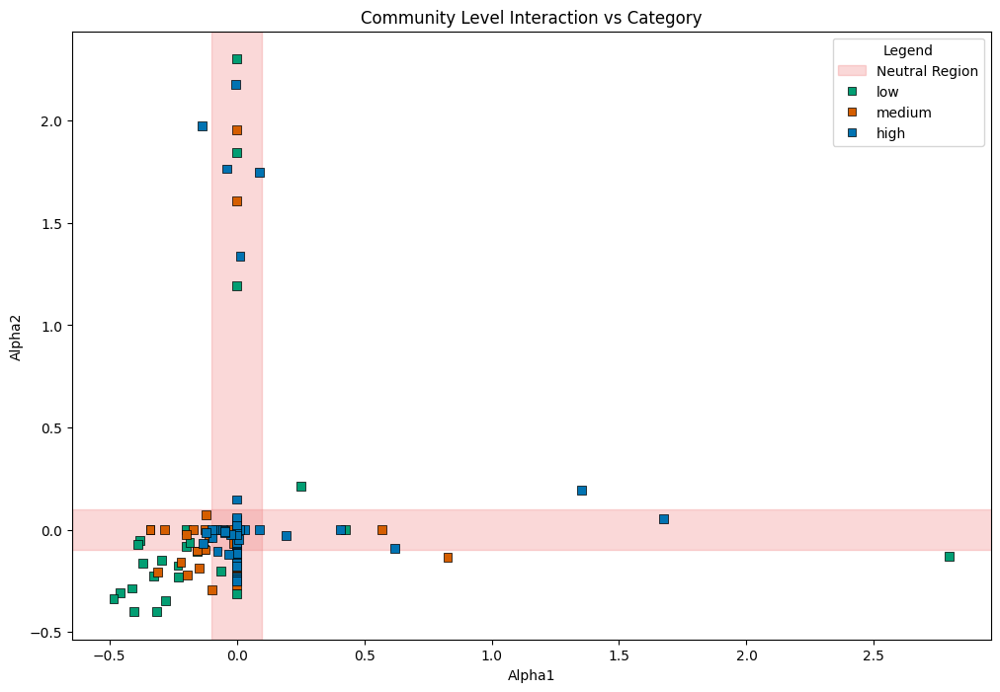

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

df = analysespairdf.copy()

plt.figure(figsize=(12, 8))  # Set figure size

# Background region coloring
plt.axvspan(-0.1, 0.1, ymin=0, ymax=1, color="lightcoral", alpha=0.3, label="Neutral Region")  
plt.axhspan(-0.1, 0.1, xmin=0, xmax=1, color="lightcoral", alpha=0.3)  
'''
plt.axvspan(-1, -0.1, ymin=0.1, ymax=1, color="lightcoral", alpha=0.2, label="Antagonistic")  
plt.axvspan(0.1, 1, ymin=0.1, ymax=1, color="lightblue", alpha=0.2, label="Synergistic")  
plt.axvspan(-1, -0.1, ymin=0, ymax=0.1, color="lightblue", alpha=0.2)  
plt.axvspan(0.1, 1, ymin=0, ymax=0.1, color="lightcoral", alpha=0.2)  
'''

# Scatter plot
sns.scatterplot(
    x=df['alpha1'], 
    y=df['alpha2'], 
    hue=df['category'],  # Color by category
    palette=colors,  
    edgecolor='black',  
    s=40,
    marker='s'
)

# Labels and title
plt.xlabel('Alpha1')
plt.ylabel('Alpha2')
plt.title('Community Level Interaction vs Category')

# Legend adjustments
legend = plt.legend(loc='upper right', title="Legend")

# Dynamically rename legend subtitles if legend exists
legend_texts = [t.get_text() for t in legend.get_texts()]
if "category" in legend_texts:
    legend.get_texts()[legend_texts.index("category")].set_text("Category")

plt.show()

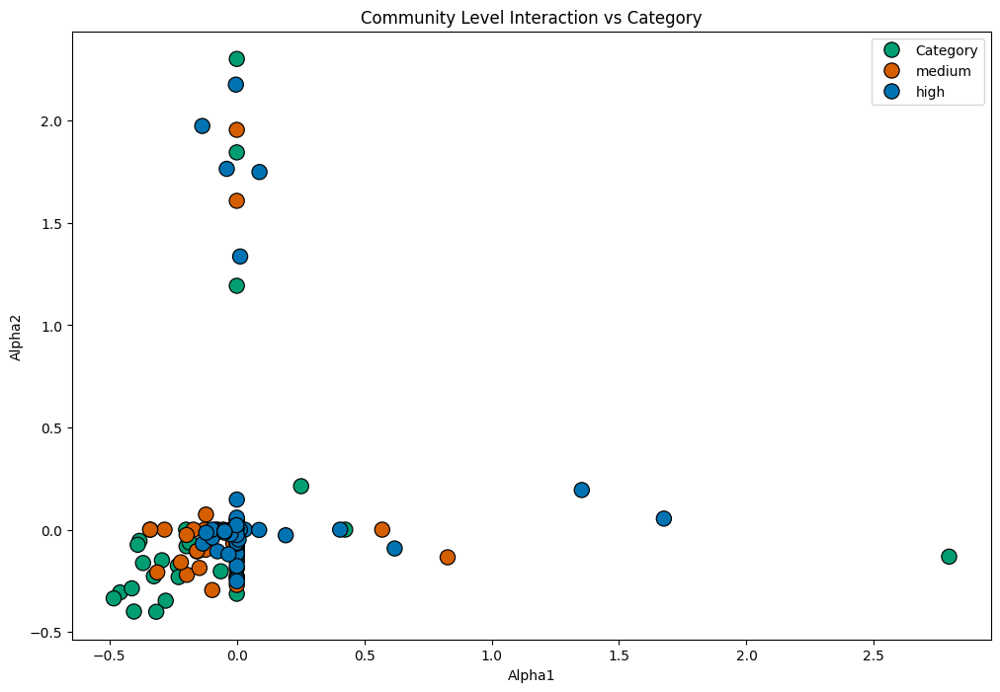

In [67]:
df = analysespairdf.copy()

plt.figure(figsize=(12, 8))  # Set figure size

custom_palette = {
    "synergistic interaction": tab20[-1],  
    "neutral": tab10[5],
    "antagonistic interaction": tab10[3]
}

sns.scatterplot(
    x=df['alpha1'], 
    y=df['alpha2'], 
    #hue=df['community_level_interaction'],  # Color by interaction type
    #style=df['category'],  # Shape by category
    hue = df['category'],
    palette=colors, #custom_palette,  # Color palette
    markers=True, #['o', 's', 'D', '^', 'v', '*'],  # Define marker shapes (modify as needed)
    edgecolor='black',  # Add edge color for clarity
    s=120  # Adjust marker size
)


#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.xlabel('Alpha1')
plt.ylabel('Alpha2')

legend = plt.legend(loc='upper right')  # Move legend outside
legend.get_texts()[0].set_text("Category")  # Rename first subtitle
#legend.get_texts()[len(df['category'].unique()) + 1].set_text("Community Level Interaction")  # Rename second subtitle

#plt.legend(title='Category')
plt.title('Community Level Interaction vs Category')
plt.show()


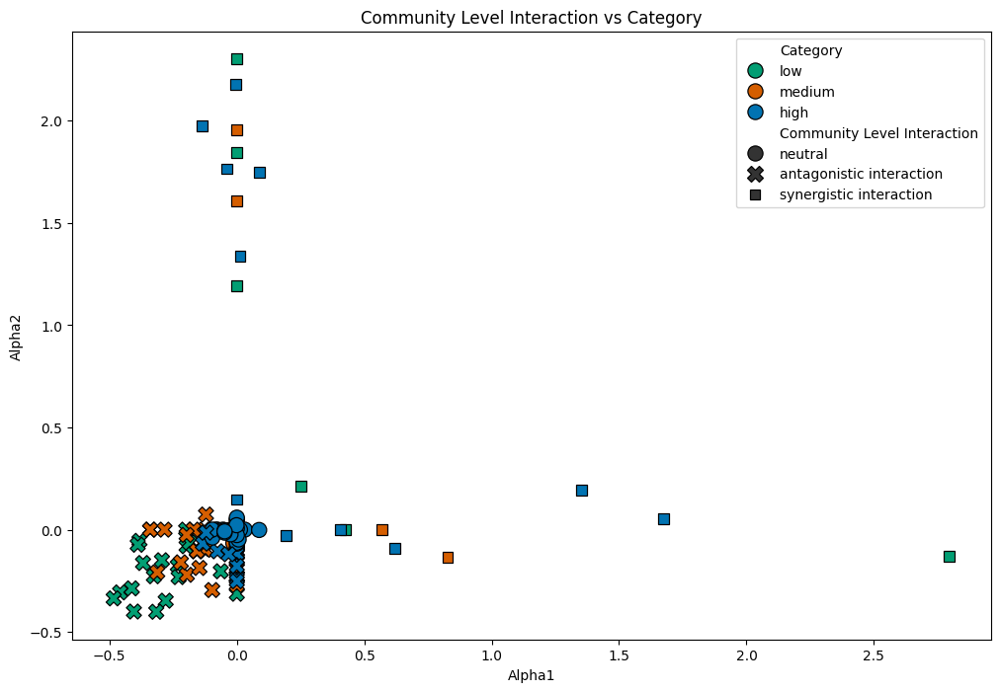

In [46]:
df = analysespairdf.copy()

plt.figure(figsize=(12, 8))  # Set figure size

'''custom_palette = {
    "high": tab10[0],  # Red
    "medium": tab10[1],  # Blue
    "low": tab10[2]
}'''

sns.scatterplot(
    x=df['alpha1'], 
    y=df['alpha2'], 
    hue=df['category'],  # Color by interaction type
    style=df['community_level_interaction'],  # Shape by category
    palette=colors,  # Color palette
    markers=True, #['o', 's', 'D', '^', 'v', '*'],  # Define marker shapes (modify as needed)
    edgecolor='black',  # Add edge color for clarity
    s=120  # Adjust marker size
)
'''
sns.relplot(
    data=df,
    x="alpha1",
    y="alpha2",
    hue="category",  # Color by category
    style="community_level_interaction",  # Shape by interaction type
    palette="tab10",  # Distinct colors
    kind="scatter",
    markers=True,
    edgecolor="black",
    s=120,  # Larger markers for better visibility
    alpha=0.7,  # Transparency for overlap clarity
    height=8, 
    aspect=1.2
)'''


#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.xlabel('Alpha1')
plt.ylabel('Alpha2')

legend = plt.legend(loc='upper right')  # Move legend outside
legend.get_texts()[0].set_text("Category")  # Rename first subtitle
legend.get_texts()[len(df['category'].unique()) + 1].set_text("Community Level Interaction")  # Rename second subtitle

#plt.legend(title='Category')
plt.title('Community Level Interaction vs Category')
plt.show()


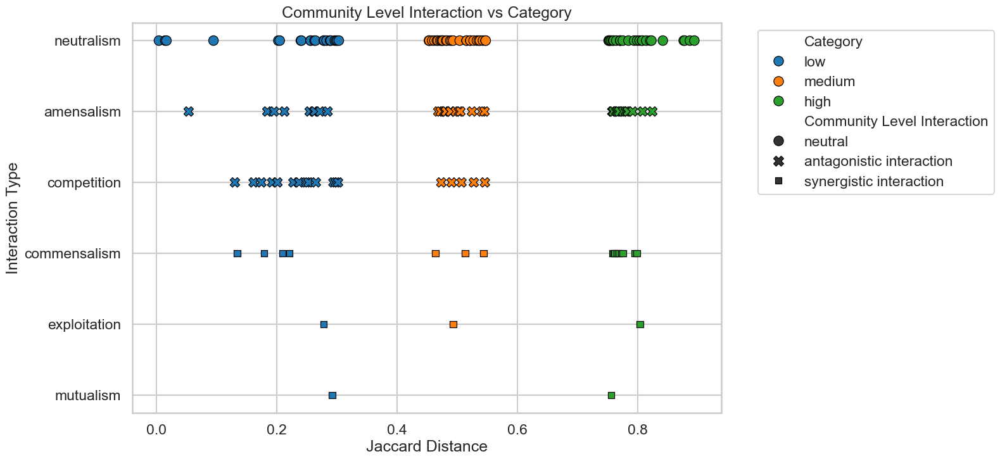

In [132]:
df = analysespairdf.copy()
df['alpha_combined'] = (df['alpha1'] + df['alpha2']) / 2

plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(
    x=df['jaccard_distance'], 
    y=df['interaction400-450'], 
    hue=df['category'],  # Color by interaction type
    style=df['community_level_interaction'],  # Shape by category
    palette='tab10',  # Color palette
    markers=True, #['o', 's', 'D', '^', 'v', '*'],  # Define marker shapes (modify as needed)
    edgecolor='black',  # Add edge color for clarity
    s=120  # Adjust marker size
)

#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.xlabel('Jaccard Distance')
plt.ylabel('Interaction Type')

legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside
legend.get_texts()[0].set_text("Category")  # Rename first subtitle
legend.get_texts()[len(df['category'].unique()) + 1].set_text("Community Level Interaction")  # Rename second subtitle

#plt.legend(title='Category')
plt.title('Community Level Interaction vs Category')
plt.show()

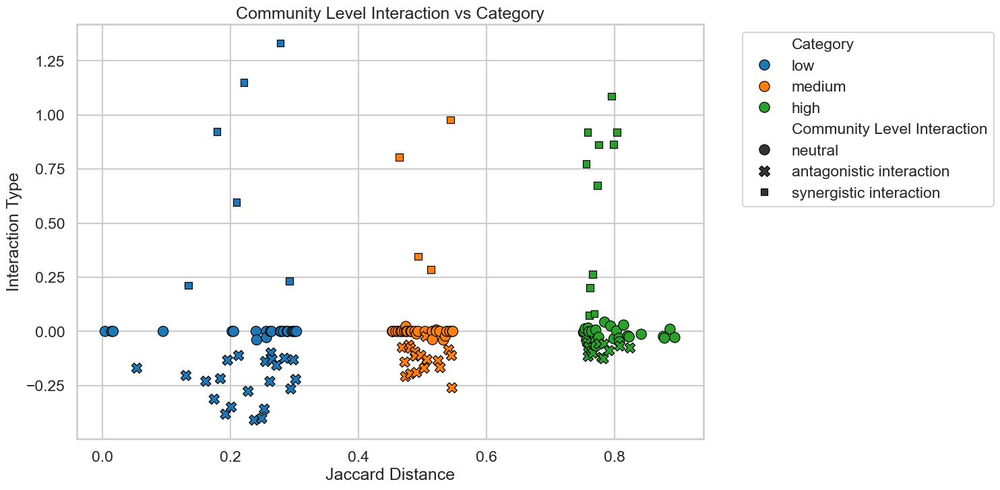

In [133]:
df = analysespairdf.copy()
df['alpha_combined'] = (df['alpha1'] + df['alpha2']) / 2

plt.figure(figsize=(12, 8))  # Set figure size

sns.scatterplot(
    x=df['jaccard_distance'], 
    y=df['alpha_combined'], 
    hue=df['category'],  # Color by interaction type
    style=df['community_level_interaction'],  # Shape by category
    palette='tab10',  # Color palette
    markers=True, #['o', 's', 'D', '^', 'v', '*'],  # Define marker shapes (modify as needed)
    edgecolor='black',  # Add edge color for clarity
    s=120  # Adjust marker size
)

#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.xlabel('Jaccard Distance')
plt.ylabel('Interaction Type')

legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside
legend.get_texts()[0].set_text("Category")  # Rename first subtitle
legend.get_texts()[len(df['category'].unique()) + 1].set_text("Community Level Interaction")  # Rename second subtitle

#plt.legend(title='Category')
plt.title('Community Level Interaction vs Category')
plt.show()

C:\Users\sabh\AppData\Local\Temp\ipykernel_23740\4141206876.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax.scatter(


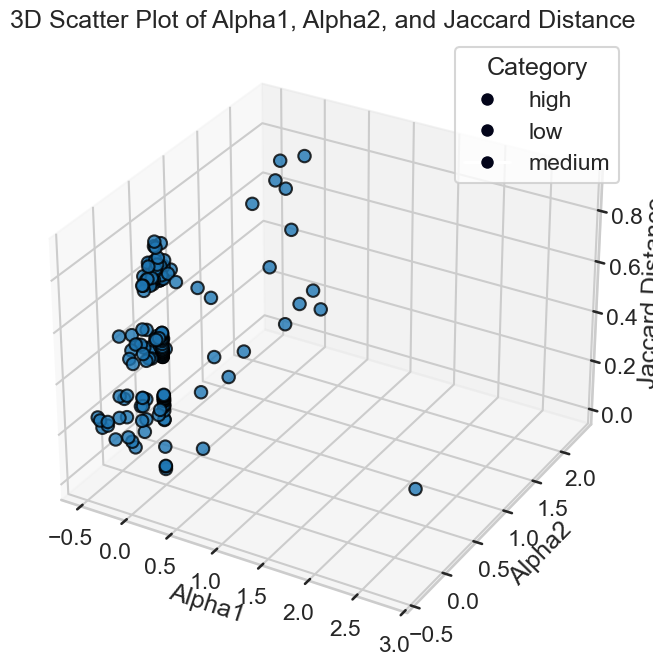

In [139]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Set figure size
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(
    df['alpha1'], 
    df['alpha2'], 
    df['jaccard_distance'], 
    #c=df['community_level_interaction'].astype('community_level_interaction').cat.codes,  # Color by category
    cmap='viridis',  # Color map
    s=80,  # Marker size
    alpha=0.8,  # Transparency
    edgecolor='k'
)

# Labels
ax.set_xlabel('Alpha1')
ax.set_ylabel('Alpha2')
ax.set_zlabel('Jaccard Distance')
ax.set_title('3D Scatter Plot of Alpha1, Alpha2, and Jaccard Distance')

# Legend (manually create color mapping for categories)
categories = df['category'].astype('category').cat.categories
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=cat, markersize=10, markerfacecolor=sc.cmap(sc.norm(i))) 
                 for i, cat in enumerate(categories)]
ax.legend(handles=legend_labels, title='Category', loc='upper right')

# Show plot
plt.show()


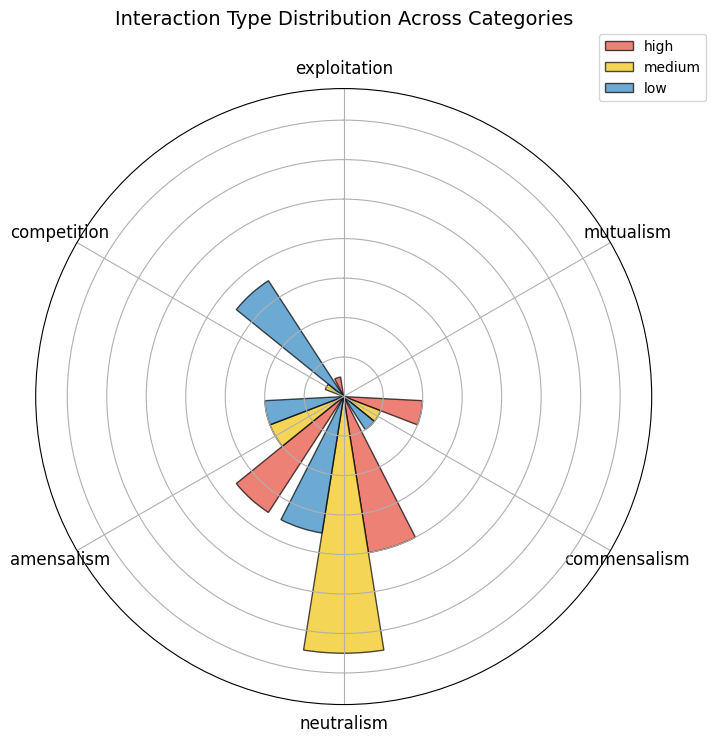

In [361]:
import numpy as np
import matplotlib.pyplot as plt

# Define interaction types in the required order
interaction_types = [
    "exploitation", "mutualism", "commensalism",
    "neutralism", "amensalism", "competition"
]

# Define categories and their colors
categories = ["high", "medium", "low"]
colors = {"high": "#E74C3C", "medium": "#F1C40F", "low": "#2E86C1"}  # Red, Yellow, Blue

# Convert to radians for circular plotting
angles = np.linspace(0, 2 * np.pi, len(interaction_types), endpoint=False)

# Create figure and polar axis
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={"projection": "polar"})

ax.set_theta_zero_location("N")  # Set 0 degrees to North
ax.set_theta_direction(-1)  # Reverse direction of degrees

# Bar width and spacing between bars
bar_width = np.pi / 10  # Reduced width for spacing
offsets = [-bar_width, 0, bar_width]  # Offsets for category bars

for i, category in enumerate(categories):
    values = [interaction_counts[category].get(it, 0) for it in interaction_types]  # Ensure all interaction types exist
    
    # Shift bars slightly for each category
    bars = ax.bar(angles + offsets[i], values, width=bar_width, color=colors[category], alpha=0.7, label=category, edgecolor="black")

# Customize the plot
ax.set_xticks(angles)  # Position labels at angles
ax.set_xticklabels(interaction_types, fontsize=12, fontweight="normal")  # Interaction type labels
ax.set_yticklabels([])  # Hide radial labels
# Extract max value correctly
max_value = max([max(counts.values()) for counts in interaction_counts.values()])
ax.set_ylim(0, max_value * 1.2)
#ax.set_ylim(0, max(max(interaction_counts.values())) * 1.2)  # Scale y-axis

# Add legend
ax.legend(loc="upper right", bbox_to_anchor=(1.1, 1.1))

# Title
plt.title("Interaction Type Distribution Across Categories", fontsize=14, fontweight="normal", y=1.09)

# Show plot
plt.show()

In [ ]:
import seaborn as sns

hdlongdf = pd.melt(hdpairwise, id_vars=['cycle'], var_name='model', value_name='biomass')
hdlongdf["pair"] = hdlongdf["model"].str.extract(r"(\d+_\d+)_")[0]  # Extract the pair (e.g., 78_98)
hdlongdf["model_id"] = hdlongdf["model"].str.extract(r"model_(\d+)")[0]  # Extract the model ID (e.g., 78)
hdlongdf.head()

# Get the unique pairs
unique_pairs = hdlongdf["pair"].unique()

# Set up the subplots for 25 subplots (5 rows x 5 columns)
fig, axes = plt.subplots(5, 5, figsize=(22, 22))  # 5 rows x 5 columns
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Iterate through each pair and create a subplot
for i, pair in enumerate(unique_pairs):
    ax = axes[i]
    
    # Filter pairwise data for the current pair
    pairwise_data = hdlongdf[hdlongdf["pair"] == pair]
    
    # Get the two model IDs in the pair
    species_in_pair = pair.split("_")
    m1 = species_in_pair[0]
    m2 = species_in_pair[1]
    
    # Filter monoculture data for both models in the pair
    monoculture_m1 = monoculture[["cycle", f"model{m1}"]]
    monoculture_m2 = monoculture[["cycle", f"model{m2}"]]  # Corrected column for model m2
    
    # Plot biomass for each model_id in the pairwise data
    sns.lineplot(
        data=pairwise_data,
        x="cycle",
        y="biomass",
        hue="model_id",
        palette="Dark2",
        ax=ax,
        legend=True,
    )
    
    # Plot monoculture biomass values for m1 (green dashed line)
    sns.lineplot(
        data=monoculture_m1,
        x="cycle",
        y=f"model{m1}",
        color="green",
        linestyle="--",
        linewidth=2,  # Increase line width for visibility
        label=f"Monoculture {m1}",
        ax=ax
    )
    
    # Plot monoculture biomass values for m2 (red dashed line)
    sns.lineplot(
        data=monoculture_m2,
        x="cycle",
        y=f"model{m2}",  # Corrected to use model m2
        color="red",
        linestyle="--",
        linewidth=2,  # Increase line width for visibility
        label=f"Monoculture {m2}",
        ax=ax
    )

    # Get interaction type for the pair
    introw = hdpairs[(hdpairs['model1'] == int(m1)) & (hdpairs['model2'] == int(m2))]
    interaction = introw['interact_50'].values[0]
    
    # Customize the subplot title and labels
    ax.set_title(f"Pair: {pair} | Interaction: {interaction}", fontsize=12)
    ax.set_xlabel("Cycle", fontsize=10)
    ax.set_ylabel("Biomass", fontsize=10)
    ax.grid(True)

    # Manually set the legend labels for pairwise models and monocultures
    handles, labels = ax.get_legend_handles_labels()
    # Customize legend labels to represent pairwise models and monocultures
    custom_labels = [f"Pairwise {m1}", f"Pairwise {m2}", f"Monoculture {m1}", f"Monoculture {m2}"]
    ax.legend(handles, custom_labels, fontsize=10)  

    # Set the same y-axis scale for all subplots (from 0 to 0.55)
    ax.set_ylim(0, 0.55)

# Adjust layout to avoid overlap
plt.tight_layout()

# Add a total title for the entire figure
plt.suptitle('Biomass Over Cycles by Pair - HD', fontsize=16, y=1.01)

# Show the plot
plt.show()

In [405]:
def plot_biomass_over_cycles(pairwise_df, monoculture_df, interaction_df, interaction_col, title):
    """
    Generates subplots for biomass over cycles for each species pair, including monoculture comparisons.

    Parameters:
    - pairwise_df: DataFrame containing pairwise biomass data (hdpairwise).
    - monoculture_df: DataFrame containing monoculture biomass data (monoculture).
    - interaction_df: DataFrame with interaction type information (hdpairs).
    - interaction_col: Column name in interaction_df that contains interaction types.
    - title: Main title for the entire figure.
    """
    # Reshape pairwise data to long format
    long_df = pd.melt(pairwise_df, id_vars=['cycle'], var_name='model', value_name='biomass')
    long_df["pair"] = long_df["model"].str.extract(r"(\d+_\d+)_")[0]  # Extract the species pair (e.g., 78_98)
    long_df["model_id"] = long_df["model"].str.extract(r"model_(\d+)")[0]  # Extract individual model ID
    
    # Get unique pairs
    unique_pairs = long_df["pair"].unique()
    
    # Set up subplots (max 5x5 grid)
    num_plots = len(unique_pairs)
    rows, cols = (5, 5) if num_plots > 25 else (int(np.ceil(num_plots / 5)), min(5, num_plots))
    fig, axes = plt.subplots(rows, cols, figsize=(22, 22))
    axes = axes.flatten() if num_plots > 1 else [axes]

    # Loop through each species pair and create subplots
    for i, pair in enumerate(unique_pairs):
        ax = axes[i]
        
        # Filter data for the current pair
        pairwise_data = long_df[long_df["pair"] == pair]
        
        # Extract species IDs
        species_in_pair = pair.split("_")
        m1, m2 = species_in_pair[0], species_in_pair[1]

        # Extract monoculture data
        monoculture_m1 = monoculture_df[["cycle", f"model{m1}"]]
        monoculture_m2 = monoculture_df[["cycle", f"model{m2}"]]

        # Plot pairwise biomass
        sns.lineplot(data=pairwise_data, x="cycle", y="biomass", hue="model_id",
                     palette="Dark2", ax=ax, legend=True)

        # Plot monoculture biomass (dashed lines)
        sns.lineplot(data=monoculture_m1, x="cycle", y=f"model{m1}",
                     color="green", linestyle="--", linewidth=2, label=f"Monoculture {m1}", ax=ax)
        sns.lineplot(data=monoculture_m2, x="cycle", y=f"model{m2}",
                     color="red", linestyle="--", linewidth=2, label=f"Monoculture {m2}", ax=ax)

        # Get interaction type
        interaction_row = interaction_df[(interaction_df['model1'] == int(m1)) & (interaction_df['model2'] == int(m2))]
        interaction = interaction_row[interaction_col].values[0] if not interaction_row.empty else "Unknown"

        # Customize subplot
        ax.set_title(f"Pair: {pair} | Interaction: {interaction}", fontsize=12)
        ax.set_xlabel("Cycle", fontsize=10)
        ax.set_ylabel("Biomass", fontsize=10)
        ax.grid(True)

        py1 = phylum_dict[int(m1)]
        py2 = phylum_dict[int(m2)]

        # Customize legend
        handles, labels = ax.get_legend_handles_labels()
        custom_labels = [f"Pairwise {m1} ({py1})", f"Pairwise {m2} ({py2})", f"Monoculture {m1}", f"Monoculture {m2}"]
        ax.legend(handles, custom_labels, fontsize=10)  

        # Set y-axis limits
        ax.set_ylim(0, 0.55)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(title, fontsize=19, y=1.02)
    plt.show()


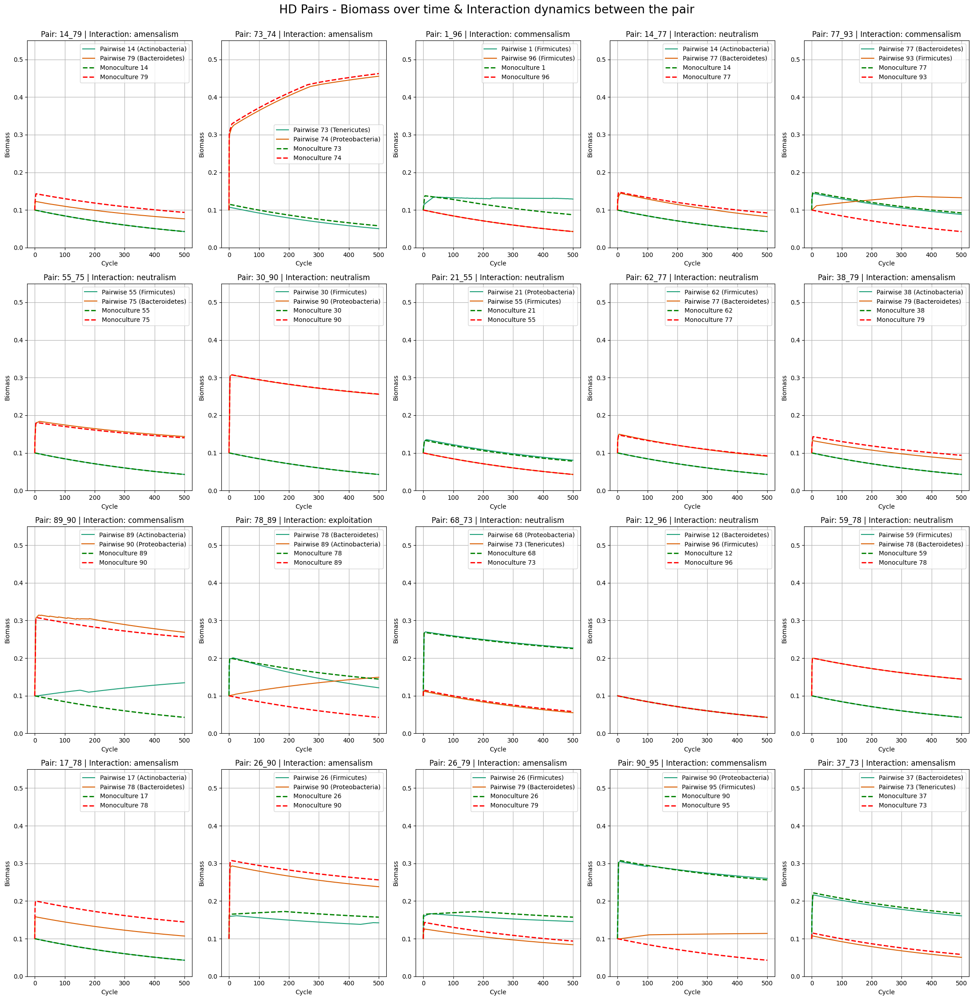

In [406]:
plot_biomass_over_cycles(hdpairwise, monoculture, analysespairdf, "interaction400-450", title ="HD Pairs - Biomass over time & Interaction dynamics between the pair")

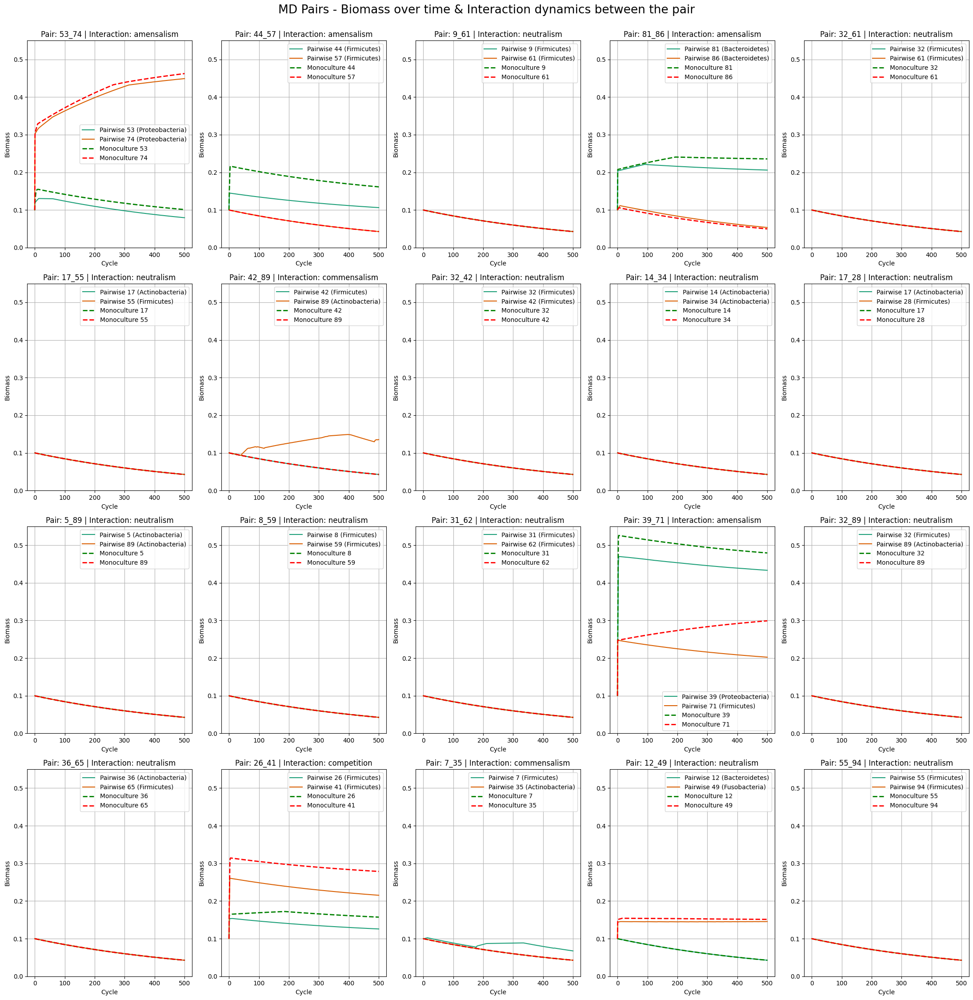

In [407]:
plot_biomass_over_cycles(mdpairwise, monoculture, analysespairdf, "interaction400-450", title ="MD Pairs - Biomass over time & Interaction dynamics between the pair")

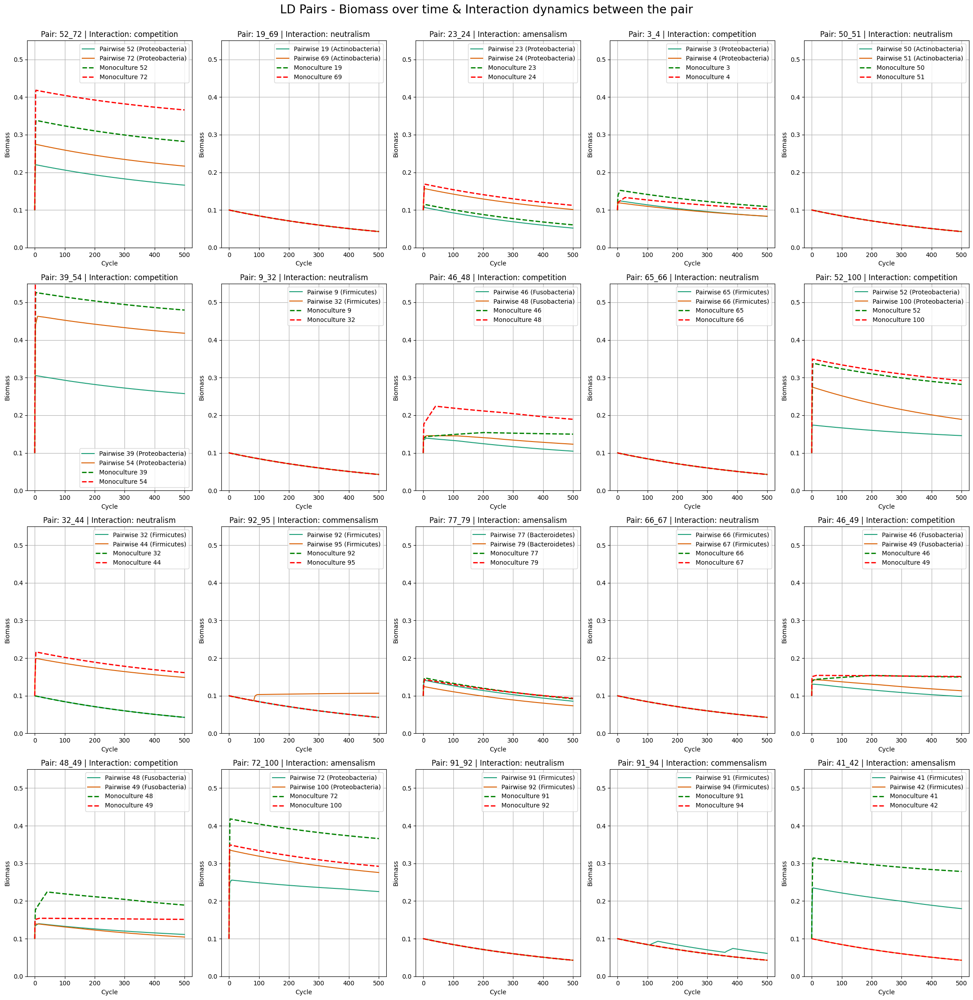

In [408]:
plot_biomass_over_cycles(ldpairwise, monoculture, analysespairdf, "interaction400-450", title ="LD Pairs - Biomass over time & Interaction dynamics between the pair")

In [30]:
analysespairdf = pd.read_csv('C:/Users/sabh/Desktop/jd_thesis/cometspy/final_results/pairwise_interactions.csv')

def compute_phylo_interaction_counts(df, phyla_col1, phyla_col2, interaction_col):
    """
    Computes the count of each interaction type for every unique phyla pair.
    
    Parameters:
    - df: DataFrame containing the data.
    - phyla_col1: Column name representing the first phylum.
    - phyla_col2: Column name representing the second phylum.
    - interaction_col: Column name representing interaction types.

    Returns:
    - A DataFrame showing the count of each interaction type for every phyla pair.
    """
    # Ensure phyla pairs are always in the same order
    df["phyla_pair"] = df.apply(lambda row: tuple(sorted([row[phyla_col1], row[phyla_col2]])), axis=1)
    
    # Group by phyla pair and interaction type
    interaction_counts = df.groupby(["phyla_pair", interaction_col]).size().unstack(fill_value=0)
    
    return interaction_counts

# Usage Example
phylo_interaction_counts = compute_phylo_interaction_counts(analysespairdf, "phylum1", "phylum2", "interaction400-450")

# Display the result
#phylo_interaction_counts


In [31]:
def plot_phylo_interaction_heatmap(df, phyla_col1, phyla_col2, interaction_col):
    """
    Plots a heatmap showing the count of each interaction type for every unique phyla pair.
    
    Parameters:
    - df: DataFrame containing the data.
    - phyla_col1: Column name representing the first phylum.
    - phyla_col2: Column name representing the second phylum.
    - interaction_col: Column name representing interaction types.
    """
    # Compute interaction counts
    interaction_counts = compute_phylo_interaction_counts(df, phyla_col1, phyla_col2, interaction_col)

    # Replace 0s with NaN to leave them blank
    interaction_counts = interaction_counts.replace(0, float("nan"))

    # Create the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(interaction_counts, annot=True, cmap="tab10", linewidths=0.5, cbar = False)

    # Labels and title
    plt.xlabel("Interaction Type", fontsize=12)
    plt.ylabel("Phyla Pair", fontsize=12)
    plt.title("Interaction Counts Across Phyla Pairs", fontsize=14)
    plt.xticks(rotation=45, ha="right")

    # Show the plot
    plt.show()

C:\Users\sabh\AppData\Local\Temp\ipykernel_13824\4086756200.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["phyla_pair"] = df.apply(lambda row: tuple(sorted([row[phyla_col1], row[phyla_col2]])), axis=1)


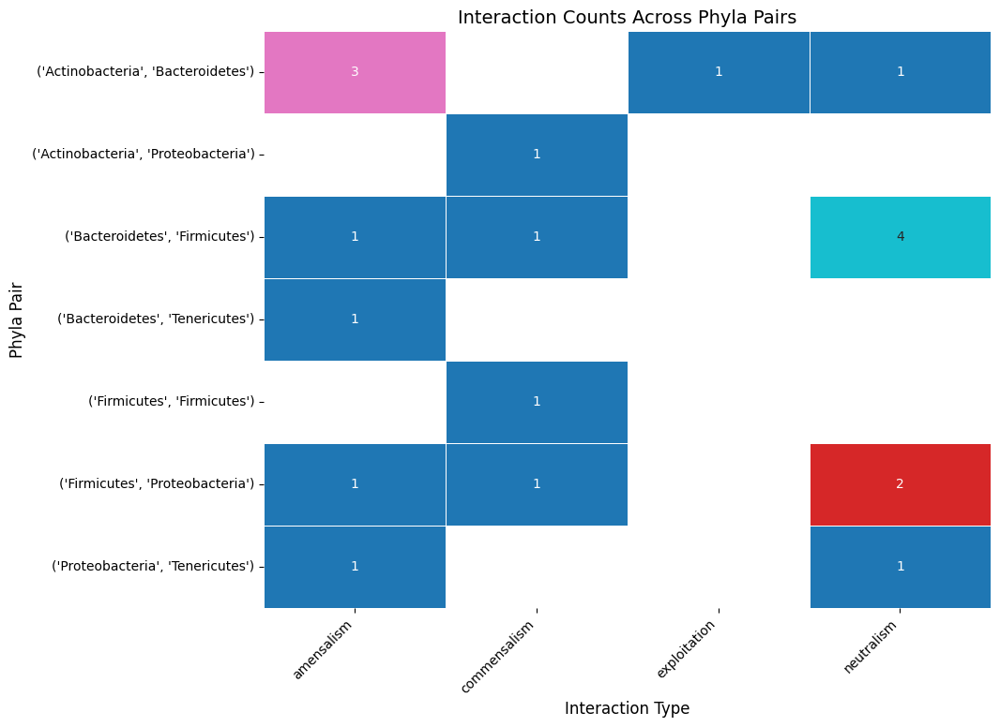

In [34]:
# subplots for all categories
df = analysespairdf[analysespairdf['category'] == 'high']
plot_phylo_interaction_heatmap(df, "phylum1", "phylum2", "interaction400-450")

C:\Users\sabh\AppData\Local\Temp\ipykernel_13824\4086756200.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["phyla_pair"] = df.apply(lambda row: tuple(sorted([row[phyla_col1], row[phyla_col2]])), axis=1)


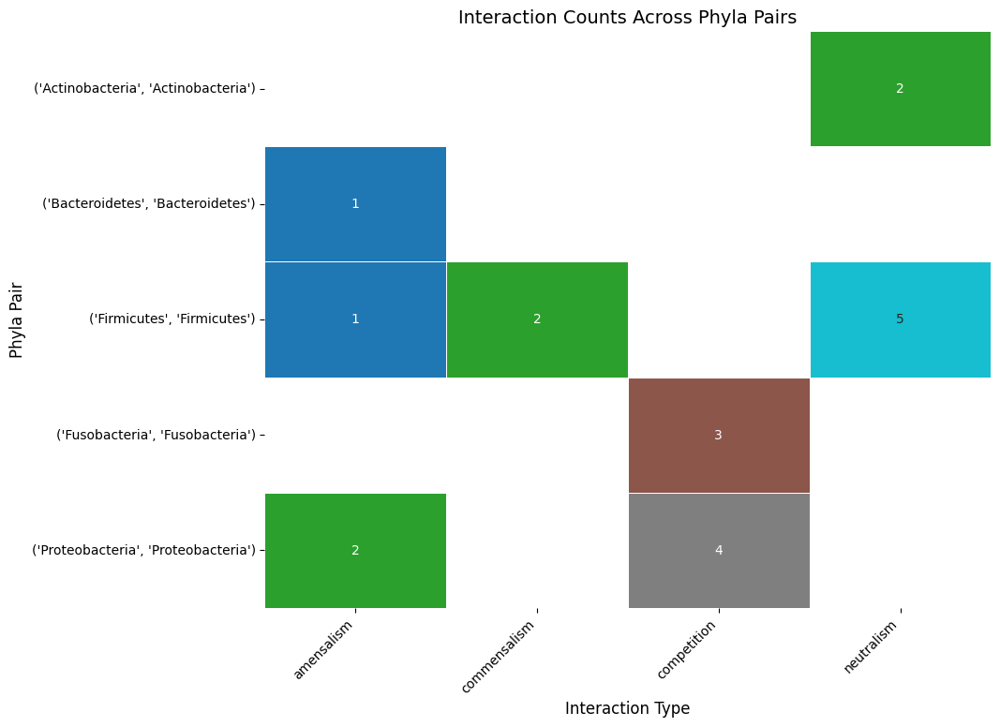

In [35]:
# subplots for all categories
df = analysespairdf[analysespairdf['category'] == 'low']
plot_phylo_interaction_heatmap(df, "phylum1", "phylum2", "interaction400-450")

C:\Users\sabh\AppData\Local\Temp\ipykernel_13824\4086756200.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["phyla_pair"] = df.apply(lambda row: tuple(sorted([row[phyla_col1], row[phyla_col2]])), axis=1)


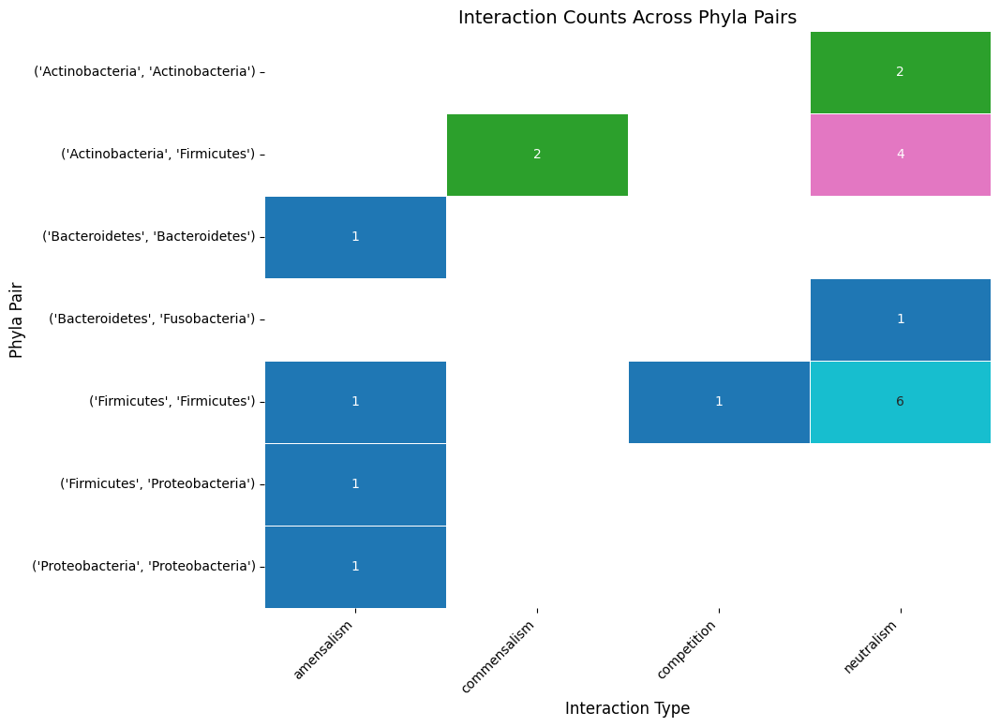

In [36]:
# md pairs
df = analysespairdf[analysespairdf['category'] == 'medium']
plot_phylo_interaction_heatmap(df, "phylum1", "phylum2", "interaction400-450")

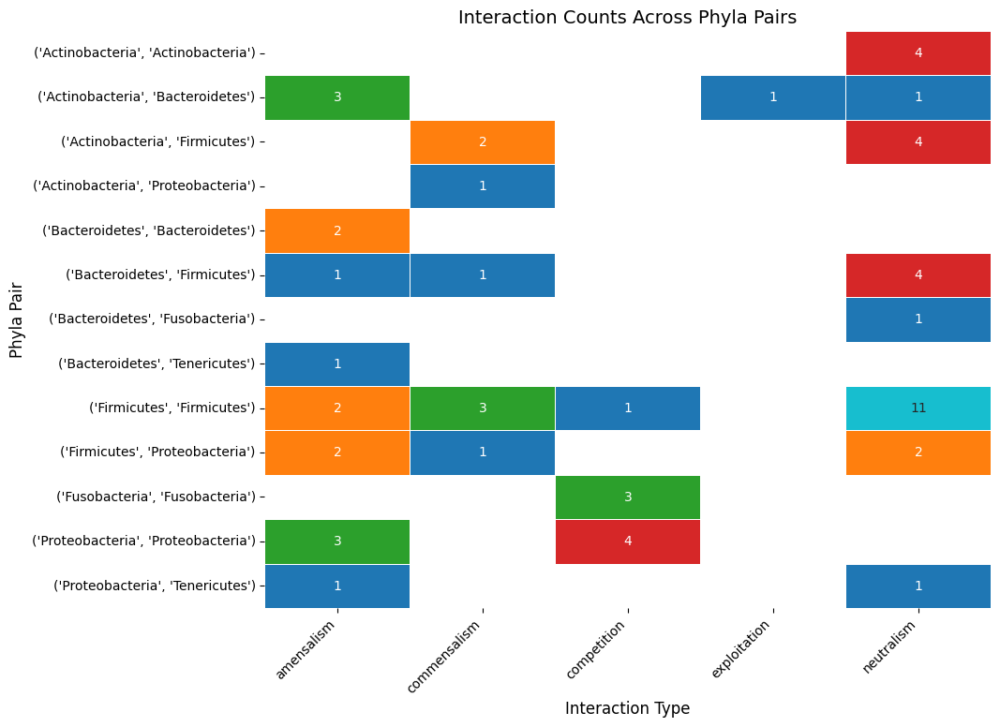

In [450]:
# complete compiled
plot_phylo_interaction_heatmap(analysespairdf, "phylum1", "phylum2", "interaction400-450")


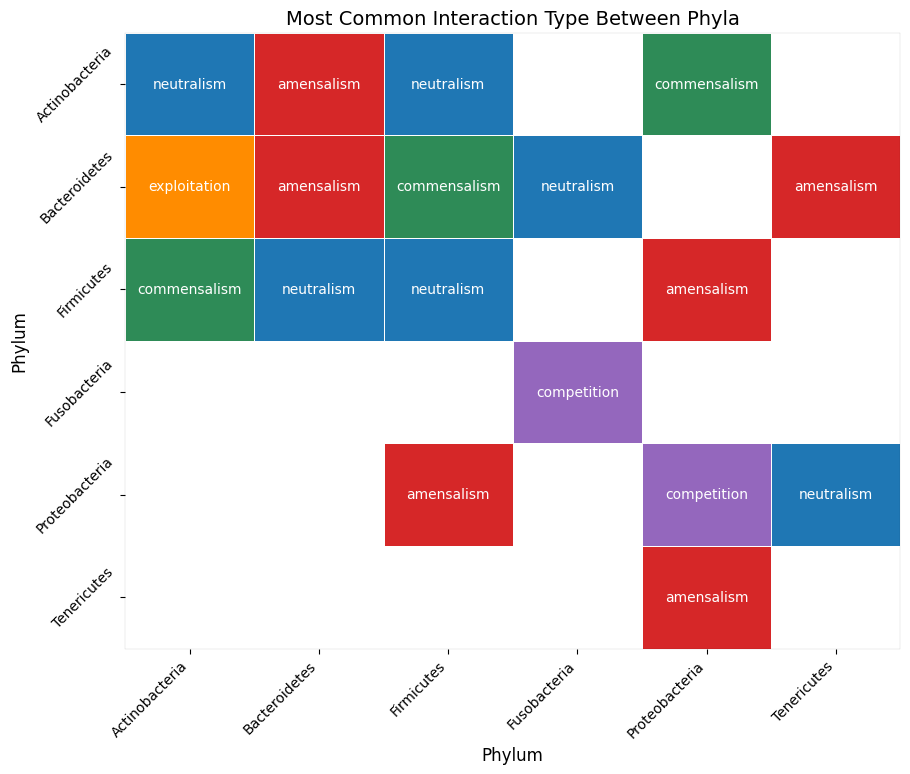

In [449]:
def plot_phylo_dominant_interaction(df, phyla_col1, phyla_col2, interaction_col):
    """
    Plots a heatmap where each phyla pair is color-coded based on the most frequent interaction type.
    """
    # Count occurrences of interaction types per phyla pair
    interaction_counts = df.groupby([phyla_col1, phyla_col2, interaction_col]).size().reset_index(name="count")
    
    # Find the most common interaction type for each phyla pair
    dominant_interaction = interaction_counts.loc[interaction_counts.groupby([phyla_col1, phyla_col2])["count"].idxmax()]
    
    # Pivot to create a matrix
    pivot_table = dominant_interaction.pivot(index=phyla_col1, columns=phyla_col2, values=interaction_col)
    
    # Define a custom color map for interaction types
    interaction_palette = {
        "mutualism": "#2E8B57",  # SeaGreen 🌱
        "commensalism": "#1F77B4",  # Deep Blue 🔵
        "neutralism": "#808080",  # Gray ⚪
        "amensalism": "#D62728",  # Red 🔴
        "competition": "#9467BD",  # Purple 🟣
        "exploitation": "#FF8C00",  # Dark Orange 🟠
    }

    # Convert interaction types to categorical values for plotting
    interaction_categories = {key: idx for idx, key in enumerate(interaction_palette.keys())}
    pivot_numeric = pivot_table.applymap(lambda x: interaction_categories.get(x, np.nan))

    # Create the heatmap
    fig, ax = plt.subplots(figsize=(10, 8))
    cmap = sns.color_palette([interaction_palette[k] for k in interaction_categories.keys()])

    sns.heatmap(
        pivot_numeric, annot=pivot_table, fmt="", cmap=cmap, linewidths=0.5, cbar=False, ax=ax
    )

    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(0.05)
        

    # Labels and title
    plt.xlabel("Phylum", fontsize=12)
    plt.ylabel("Phylum", fontsize=12)
    plt.title("Most Common Interaction Type Between Phyla", fontsize=14)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=45, ha="right")

    # Show the plot
    plt.show()

# Usage Example
plot_phylo_dominant_interaction(analysespairdf, "phylum1", "phylum2", "interaction400-450")


## sequential invasion

In [146]:
def get_summed_biomass(seqdict_melted, invasion_seq_id):

    #networks = networksdict[type][invasion_seq_id]
    df = seqdict_melted[invasion_seq_id]
    models = list(df[(df['cycle'] == 0) & (df['invseq'] == 1)]['model'])
    #print(models)

    sumdict = {}
    for invs in range(1, 6):
        sumdict[invs] = {}
        res = models[:invs-1]
        inv = models[invs-1]  
        #print('inv:', inv)
        #print('res:', res)

        invbio = list(df[(df['invseq'] == invs) & (df['model'] == inv)]['biomass'])
        sumdict[invs]['invader'] = invbio

        resbio = np.zeros(len(invbio))
        for resident in res:
            reslist = list(df[(df['invseq'] == invs) & (df['model'] == resident)]['biomass'])
            resbio = np.add(resbio, reslist)
        sumdict[invs]['resident'] = resbio
    
    plotdata = []
    #plotdf = pd.DataFrame(columns=['cycle', 'resident', 'invader'])
    for invs in range(1, 6):
        invbio = sumdict[invs]['invader'][:100]
        resbio = sumdict[invs]['resident'][:100]

        for i in range(len(invbio)):
            plotdata.append({'cycle': i+((invs-1)*100), 'resident': resbio[i], 'invader': invbio[i]})
    
    plotdf = pd.DataFrame(plotdata)
    return plotdf
                    
                      
invasion_seq_id = 5  # Replace with the desired sequence ID
summed_biomass_df = get_summed_biomass(rhseqdict_melted, invasion_seq_id)


NameError: name 'rhseqdict_melted' is not defined

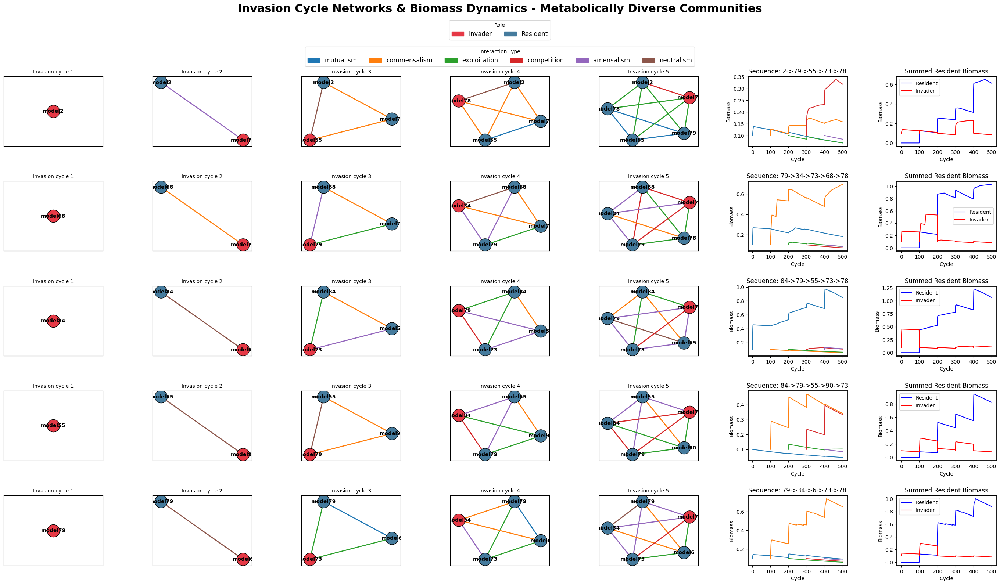

In [41]:
import random
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import matplotlib.patches as mpatches
import pandas as pd

def plot_invasion_cycle_analysis(networks_dict, seqdict_melted, type, title, num_rows=5):
    num_cols = 7  # 5 network plots + 2 biomass plots
    num_cycles = 5  # Number of invasion cycles shown per row
    
    # Randomly sample rows to get a good representation
    random_indices = random.sample(range(50), num_rows)

    # Define node colors based on role
    role_colors = {"invader": "#e63946", "resident": "#457b9d"}  # Red for invader, Blue for resident

    # Use a colorblind-friendly palette
    palette = plt.get_cmap("tab10")

    # Define interaction types and assign colors
    interaction_types = ["mutualism", "commensalism", "exploitation", "competition", "amensalism", "neutralism"]
    edge_colors = {interaction: palette(i)[:3] for i, interaction in enumerate(interaction_types)}

    # Create figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 18), gridspec_kw={'wspace': 0.5, 'hspace': 0.5})
    
    for row_idx, seq_id in enumerate(random_indices):
        network = networks_dict[type].get(seq_id, {})
        
        for invseq in range(1, num_cycles + 1):  
            ax = axes[row_idx, invseq - 1]  # Select correct subplot
            
            if invseq not in network:
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_frame_on(False)  # Hide empty plots
                continue

            G = network[invseq]  # Get network for current invasion cycle
            
            # Generate positions for nodes
            pos = nx.spring_layout(G, seed=42)  

            # Node colors
            node_colors = [role_colors.get(G.nodes[n].get("role", "resident"), "gray") for n in G.nodes()]
            
            # Draw nodes
            nx.draw_networkx_nodes(G, pos, node_color=node_colors, ax=ax, node_size=600, edgecolors="black")
            
            # Draw edges with colors based on interaction type
            for u, v, data in G.edges(data=True):
                interaction = data.get("interaction")  # Default to neutralism
                color = edge_colors.get(interaction, "gray")
                nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], edge_color=[color], ax=ax, width=2)

            # Draw node labels (only model ID)
            nx.draw_networkx_labels(G, pos, labels={n: n for n in G.nodes()}, ax=ax, font_size=10, font_weight="bold", font_color="black")

            # Title for each subplot
            ax.set_title(f"Invasion cycle {invseq}", fontsize=10)
            ax.set_xticks([])  
            ax.set_yticks([])

        # Biomass Plot (Column 6)
        biomass_ax = axes[row_idx, 5]  
        temp_df = seqdict_melted[seq_id]
        sns.lineplot(x='ovcycle', y='biomass', hue='model', data=temp_df, ax=biomass_ax, legend=False)
        
        # Extract sequence order
        model_list = list(set(temp_df['model'].values))
        model_ids = ([int(i[5:]) for i in model_list])
        sequence = "->".join(map(str, model_ids))

        biomass_ax.set_title(f"Sequence: {sequence}") # if needed add invasion sequence id
        biomass_ax.set_xlabel("Cycle")
        biomass_ax.set_ylabel("Biomass")

        # Summed Biomass Plot (Column 7) - Placeholder for now
        summed_ax = axes[row_idx, 6]

        # Get summed biomass data
        summed_biomass_df = get_summed_biomass(seqdict_melted, seq_id)

        sns.lineplot(x='cycle', y='resident', data=summed_biomass_df, ax=summed_ax, color="blue", label="Resident")
        sns.lineplot(x='cycle', y='invader', data=summed_biomass_df, ax=summed_ax, color="red", label="Invader")
        
        summed_ax.set_title("Summed Resident Biomass")
        summed_ax.set_xlabel("Cycle")
        summed_ax.set_ylabel("Biomass")
        #summed_ax.set_xticks([])
        #summed_ax.set_yticks([])

        # Add visual separation for the last 2 columns
        for ax in [biomass_ax, summed_ax]:
            for spine in ax.spines.values():
                spine.set_linewidth(2)
                spine.set_edgecolor("black")

    # --------------------
    # Add Separate Legends (Both Horizontal)
    # --------------------

    # 1️⃣ Role Legend (Invader/Resident)
    invader_patch = mpatches.Patch(color=role_colors["invader"], label="Invader")
    resident_patch = mpatches.Patch(color=role_colors["resident"], label="Resident")

    fig.legend(handles=[invader_patch, resident_patch], 
               loc="center", 
               bbox_to_anchor=(0.5, 0.89), 
               fontsize=12, 
               ncol=2, 
               frameon=True, 
               title="Role")

    # 2️⃣ Interaction Type Legend
    edge_patches = [mpatches.Patch(color=color, label=interaction) for interaction, color in edge_colors.items()]

    fig.legend(handles=edge_patches, 
               loc="center", 
               bbox_to_anchor=(0.5, 0.85),  
               fontsize=12, 
               ncol=6,  
               frameon=True, 
               title="Interaction Type")

    # Adjust layout (More space for legends)
    #plt.subplots_adjust(left=0.05, right=0.9, top=0.78, bottom=0.1, wspace=1, hspace=0.2)
    plt.subplots_adjust(top=0.82, bottom=0.08, left=0.05, right=0.95, wspace=0.08, hspace=0.02)
    #plt.tight_layout(rect=[0, 0, 1, 0.97])
    fig.suptitle(f"Invasion Cycle Networks & Biomass Dynamics - {title}", fontsize=22, fontweight="bold", y=0.93)
    
    plt.show()

# Usage Example
plot_invasion_cycle_analysis(rnetworks_dict, rhseqdict_melted, 'high', "Metabolically Diverse Communities")

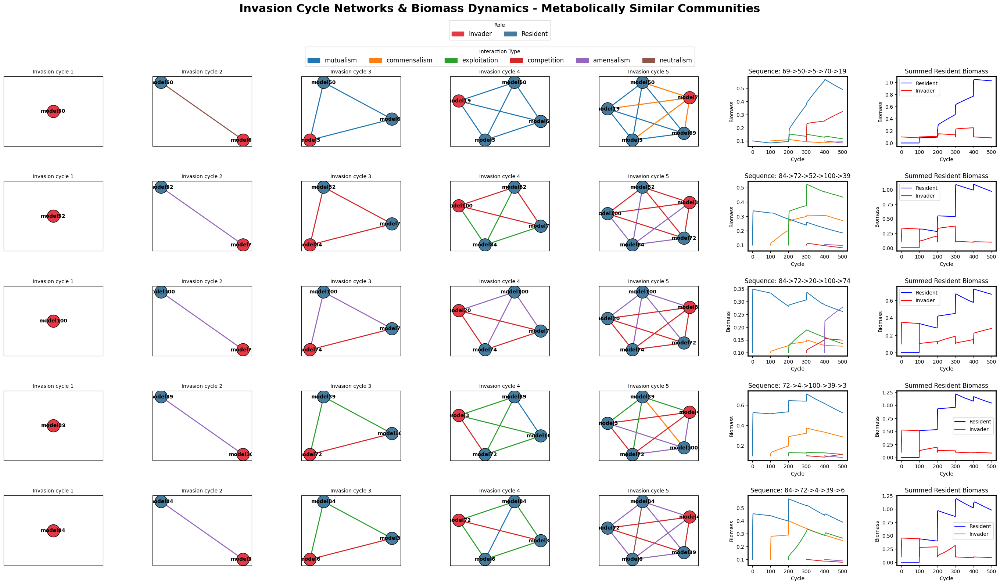

In [42]:
plot_invasion_cycle_analysis(rnetworks_dict, rlseqdict_melted, 'low', "Metabolically Similar Communities")

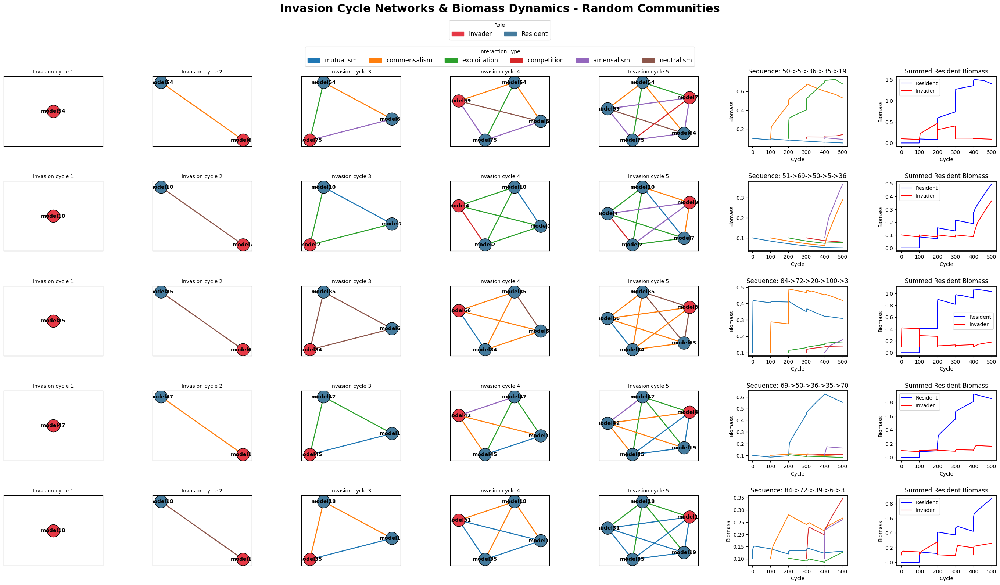

In [44]:
plot_invasion_cycle_analysis(rnetworks_dict, rlseqdict_melted, 'random', "Random Communities")

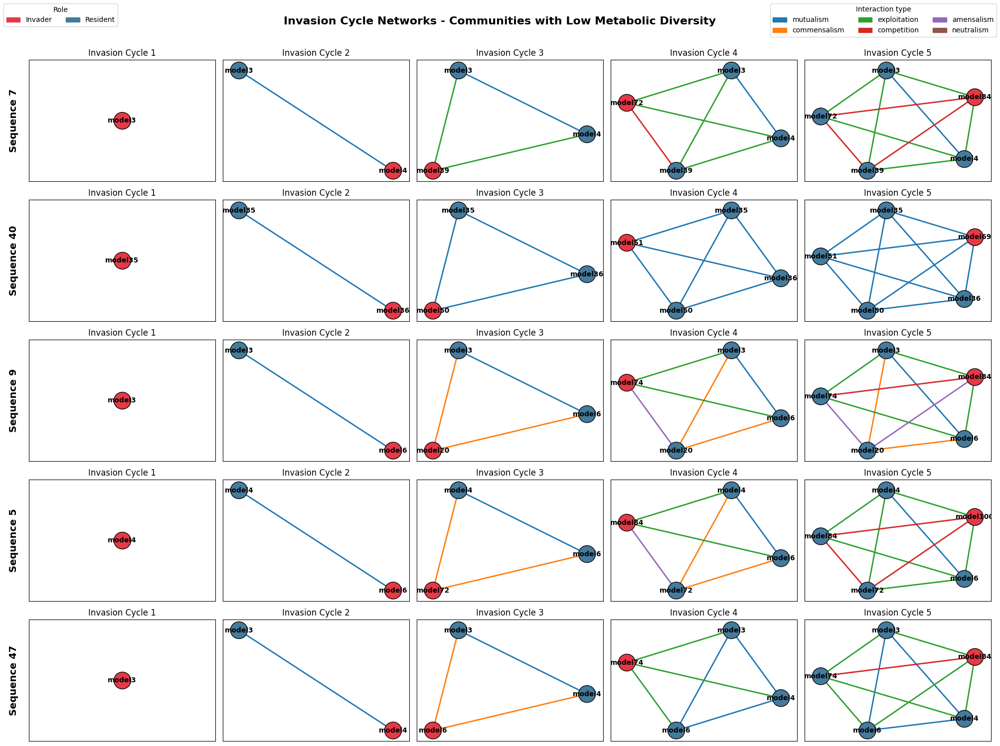

In [132]:
import random
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.patches as mpatches

# Define node colors based on role
role_colors = {"invader": "#e63946", "resident": "#457b9d"}  # Red for invader, Blue for resident

# Use a colorblind-friendly palette
palette = plt.get_cmap("tab10")

# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
edge_colors = {interaction: palette(i)[:3] for i, interaction in enumerate(interaction_types)}  # Extract RGB values

# select five random indices
random_indices = random.sample(range(50), 5)

# Create figure with 5x5 subplots
fig, axes = plt.subplots(5, 5, figsize=(20, 15))  
axes = axes.flatten()  # Flatten the 5x5 array into a 1D list

fig.suptitle("Invasion Cycle Networks - Communities with Low Metabolic Diversity", fontsize=16, fontweight="bold")  # Main title

plot_index = 0  # To track subplot position

#for row_idx, (index, row) in enumerate(lseq.iterrows()):
#    if (row_idx + 1) % 5 != 0:
#        continue  # Skip rows that don't match the condition

for row_idx in random_indices:
    network = networks_dict['low'].get(row_idx, {})  # Ensure network exists

    for invseq in range(1, 6):  
        if invseq not in network or plot_index >= len(axes):  
            continue  # Skip missing networks or avoid exceeding subplot grid

        G = network[invseq]  # Get network for current invasion cycle
        ax = axes[plot_index]  # Correct subplot indexing
        plot_index += 1  # Move to the next subplot

        # Generate positions for nodes
        pos = nx.spring_layout(G, seed=42)  

        # Node colors
        node_colors = [role_colors.get(G.nodes[n].get("role", "resident"), "gray") for n in G.nodes()]
        
        # Draw nodes
        nx.draw_networkx_nodes(G, pos, node_color=node_colors, ax=ax, node_size=600, edgecolors="black")
        
        # Draw edges with colors based on interaction type
        for u, v, data in G.edges(data=True):
            interaction = data.get("interaction", "neutralism")  # Default to neutralism
            color = edge_colors.get(interaction, "gray")
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], edge_color=[color], ax=ax, width=2)

        # Draw node labels (only model ID)
        nx.draw_networkx_labels(G, pos, labels={n: n for n in G.nodes()}, ax=ax, font_size=10, font_weight="bold", font_color="black")

        # Title for each subplot
        ax.set_title(f"Invasion Cycle {invseq}", fontsize=12)
        ax.set_xticks([])  # Remove x-axis ticks
        ax.set_yticks([])  # Remove y-axis ticks

        # Add y-axis label only for the first column
        if plot_index % 5 == 1:  
            ax.set_ylabel(f"Sequence {row_idx}", fontsize=14, fontweight="bold", rotation=90, labelpad=15)


# --------------------
# Add Legend
# --------------------
# Node legend (invader/resident)
invader_patch = mpatches.Patch(color=role_colors["invader"], label="Invader")
resident_patch = mpatches.Patch(color=role_colors["resident"], label="Resident")

legend1 = fig.legend(handles=[invader_patch, resident_patch], loc="upper left", fontsize=10, ncol=2, frameon=True, title="Role")

# Edge legend (interaction types)
edge_patches = [mpatches.Patch(color=color, label=interaction) for interaction, color in edge_colors.items()]

# Place legend above subplots
legend2 = fig.legend(handles=edge_patches, loc="upper right", fontsize=10, ncol=3, frameon=True, title="Interaction type")

# Show the full plot
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to fit the legend
plt.show()

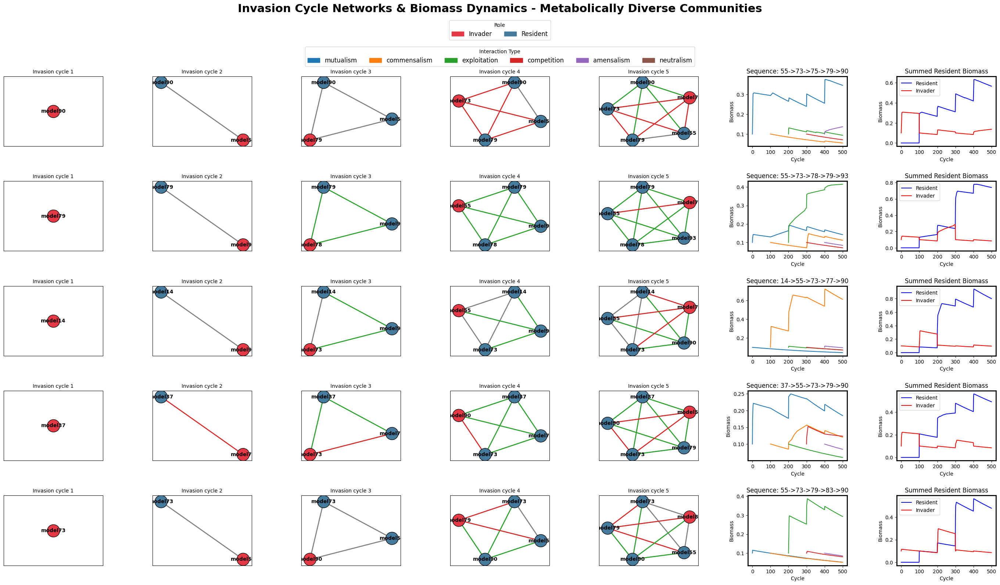

In [128]:
def plot_invasion_cycle_analysis(networks_dict, seqdict_melted, type, title, num_rows=5):
    num_cols = 7  # 5 network plots + 2 biomass plots
    num_cycles = 5  # Number of invasion cycles shown per row
    
    random_indices = random.sample(range(50), num_rows)

    role_colors = {"invader": "#e63946", "resident": "#457b9d"}
    palette = plt.get_cmap("tab10")

    interaction_types = ["mutualism", "commensalism", "exploitation", "competition", "amensalism", "neutralism"]
    edge_colors = {interaction: palette(i)[:3] for i, interaction in enumerate(interaction_types)}

    interaction_classifications = {
        "mutualism": "synergistic", "commensalism": "synergistic", "exploitation": "synergistic",
        "neutralism": "neutral", "competition": "antagonistic", "amensalism": "antagonistic"
    }

    category_colors = {"synergistic": "#2ca02c", "neutral": "#7f7f7f", "antagonistic": "#d62728"}

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 18), gridspec_kw={'wspace': 0.5, 'hspace': 0.5})
    
    for row_idx, seq_id in enumerate(random_indices):
        network = networks_dict[type].get(seq_id, {})

        for invseq in range(1, num_cycles + 1):  
            ax = axes[row_idx, invseq - 1]  
            
            if invseq not in network:
                ax.set_xticks([]); ax.set_yticks([]); ax.set_frame_on(False)
                continue

            G = network[invseq]  
            pos = nx.spring_layout(G, seed=42)  # Move pos definition here

            node_colors = [role_colors.get(G.nodes[n].get("role", "resident"), "gray") for n in G.nodes()]
            nx.draw_networkx_nodes(G, pos, node_color=node_colors, ax=ax, node_size=600, edgecolors="black")

            # Draw edges with classification-based coloring
            for u, v, data in G.edges(data=True):
                interaction = data.get("interaction", "neutralism")
                category = interaction_classifications.get(interaction, "neutral")
                color = category_colors[category]
                nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], edge_color=[color], ax=ax, width=2)

            nx.draw_networkx_labels(G, pos, labels={n: n for n in G.nodes()}, ax=ax, font_size=10, font_weight="bold")
            ax.set_title(f"Invasion cycle {invseq}", fontsize=10)
            ax.set_xticks([]); ax.set_yticks([])

        # Biomass Plot (Column 6)
        biomass_ax = axes[row_idx, 5]
        if seq_id in seqdict_melted:
            temp_df = seqdict_melted[seq_id]
            sns.lineplot(x='ovcycle', y='biomass', hue='model', data=temp_df, ax=biomass_ax, legend=False)
            model_list = list(set(temp_df['model'].values))
            sequence = "->".join(map(str, sorted([int(i[5:]) for i in model_list])))
            biomass_ax.set_title(f"Sequence: {sequence}")
        biomass_ax.set_xlabel("Cycle")
        biomass_ax.set_ylabel("Biomass")

        # Summed Biomass Plot (Column 7)
        summed_ax = axes[row_idx, 6]
        summed_biomass_df = get_summed_biomass(seqdict_melted, seq_id)  # Ensure function exists
        if not summed_biomass_df.empty:
            sns.lineplot(x='cycle', y='resident', data=summed_biomass_df, ax=summed_ax, color="blue", label="Resident")
            sns.lineplot(x='cycle', y='invader', data=summed_biomass_df, ax=summed_ax, color="red", label="Invader")
        summed_ax.set_title("Summed Resident Biomass")
        summed_ax.set_xlabel("Cycle")
        summed_ax.set_ylabel("Biomass")

        for ax in [biomass_ax, summed_ax]:
            for spine in ax.spines.values():
                spine.set_linewidth(2); spine.set_edgecolor("black")

    # Legends
    invader_patch = mpatches.Patch(color=role_colors["invader"], label="Invader")
    resident_patch = mpatches.Patch(color=role_colors["resident"], label="Resident")
    fig.legend(handles=[invader_patch, resident_patch], loc="center", bbox_to_anchor=(0.5, 0.89), fontsize=12, ncol=2, title="Role")

    edge_patches = [mpatches.Patch(color=color, label=interaction) for interaction, color in edge_colors.items()]
    fig.legend(handles=edge_patches, loc="center", bbox_to_anchor=(0.5, 0.85), fontsize=12, ncol=6, title="Interaction Type")

    plt.subplots_adjust(top=0.82, bottom=0.08, left=0.05, right=0.95, wspace=0.08, hspace=0.02)
    fig.suptitle(f"Invasion Cycle Networks & Biomass Dynamics - {title}", fontsize=22, fontweight="bold", y=0.93)
    plt.show()

# Usage Example
plot_invasion_cycle_analysis(rnetworks_dict, rhseqdict_melted, 'high', "Metabolically Diverse Communities")


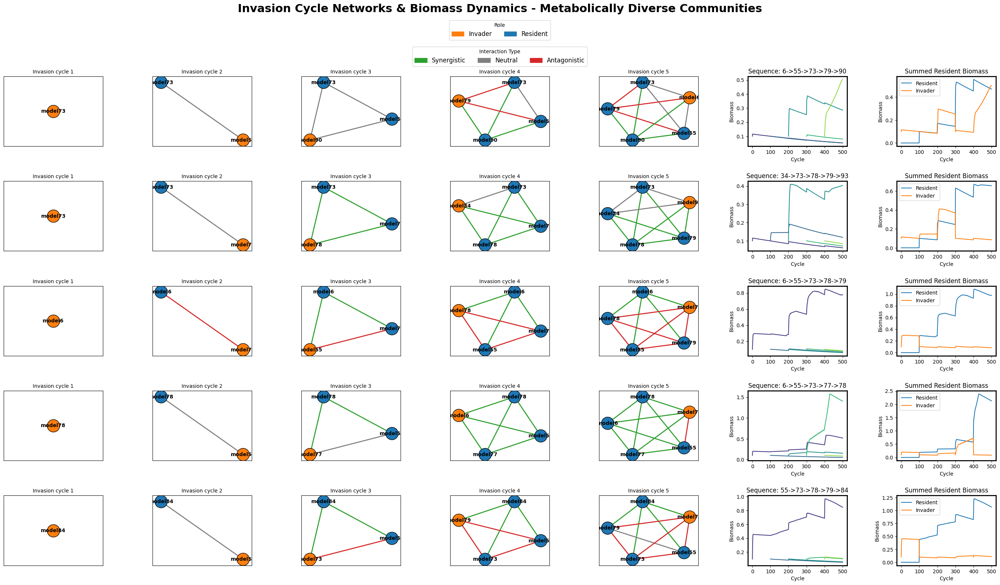

In [130]:
def plot_invasion_cycle_analysis(networks_dict, seqdict_melted, type, title, num_rows=5):
    num_cols = 7  # 5 network plots + 2 biomass plots
    num_cycles = 5  # Number of invasion cycles shown per row
    
    random_indices = random.sample(range(50), num_rows)

    # New colors for Invader and Resident
    role_colors = {"invader": "#ff7f0e", "resident": "#1f77b4"}  # Orange and Blue

    # Interaction category colors
    category_colors = {"synergistic": "#2ca02c", "neutral": "#7f7f7f", "antagonistic": "#d62728"}

    # Map interactions to their categories
    interaction_classifications = {
        "mutualism": "synergistic", "commensalism": "synergistic", "exploitation": "synergistic",
        "neutralism": "neutral", "competition": "antagonistic", "amensalism": "antagonistic"
    }

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 18), gridspec_kw={'wspace': 0.5, 'hspace': 0.5})
    
    for row_idx, seq_id in enumerate(random_indices):
        network = networks_dict[type].get(seq_id, {})

        for invseq in range(1, num_cycles + 1):  
            ax = axes[row_idx, invseq - 1]  
            
            if invseq not in network:
                ax.set_xticks([]); ax.set_yticks([]); ax.set_frame_on(False)
                continue

            G = network[invseq]  
            pos = nx.spring_layout(G, seed=42)  # Move pos definition here

            node_colors = [role_colors.get(G.nodes[n].get("role", "resident"), "gray") for n in G.nodes()]
            nx.draw_networkx_nodes(G, pos, node_color=node_colors, ax=ax, node_size=600, edgecolors="black")

            # Draw edges with classification-based coloring
            for u, v, data in G.edges(data=True):
                interaction = data.get("interaction", "neutralism")
                category = interaction_classifications.get(interaction, "neutral")
                color = category_colors[category]
                nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], edge_color=[color], ax=ax, width=2)

            nx.draw_networkx_labels(G, pos, labels={n: n for n in G.nodes()}, ax=ax, font_size=10, font_weight="bold")
            ax.set_title(f"Invasion cycle {invseq}", fontsize=10)
            ax.set_xticks([]); ax.set_yticks([])

        # Biomass Plot (Column 6)
        biomass_ax = axes[row_idx, 5]
        if seq_id in seqdict_melted:
            temp_df = seqdict_melted[seq_id]
            sns.lineplot(x='ovcycle', y='biomass', hue='model', data=temp_df, ax=biomass_ax, legend=False, palette='viridis')
            model_list = list(set(temp_df['model'].values))
            sequence = "->".join(map(str, sorted([int(i[5:]) for i in model_list])))
            biomass_ax.set_title(f"Sequence: {sequence}")
        biomass_ax.set_xlabel("Cycle")
        biomass_ax.set_ylabel("Biomass")

        # Summed Biomass Plot (Column 7)
        summed_ax = axes[row_idx, 6]
        summed_biomass_df = get_summed_biomass(seqdict_melted, seq_id)  # Ensure function exists
        if not summed_biomass_df.empty:
            sns.lineplot(x='cycle', y='resident', data=summed_biomass_df, ax=summed_ax, color=role_colors["resident"], label="Resident")
            sns.lineplot(x='cycle', y='invader', data=summed_biomass_df, ax=summed_ax, color=role_colors["invader"], label="Invader")
        summed_ax.set_title("Summed Resident Biomass")
        summed_ax.set_xlabel("Cycle")
        summed_ax.set_ylabel("Biomass")

        for ax in [biomass_ax, summed_ax]:
            for spine in ax.spines.values():
                spine.set_linewidth(2); spine.set_edgecolor("black")

    # Legends
    invader_patch = mpatches.Patch(color=role_colors["invader"], label="Invader")
    resident_patch = mpatches.Patch(color=role_colors["resident"], label="Resident")
    fig.legend(handles=[invader_patch, resident_patch], loc="center", bbox_to_anchor=(0.5, 0.89), fontsize=12, ncol=2, title="Role")

    # Interaction legend (only 3 categories)
    category_patches = [mpatches.Patch(color=color, label=category.capitalize()) for category, color in category_colors.items()]
    fig.legend(handles=category_patches, loc="center", bbox_to_anchor=(0.5, 0.85), fontsize=12, ncol=3, title="Interaction Type")

    plt.subplots_adjust(top=0.82, bottom=0.08, left=0.05, right=0.95, wspace=0.08, hspace=0.02)
    fig.suptitle(f"Invasion Cycle Networks & Biomass Dynamics - {title}", fontsize=22, fontweight="bold", y=0.93)
    plt.show()

# Usage Example
plot_invasion_cycle_analysis(rnetworks_dict, rhseqdict_melted, 'high', "Metabolically Diverse Communities")


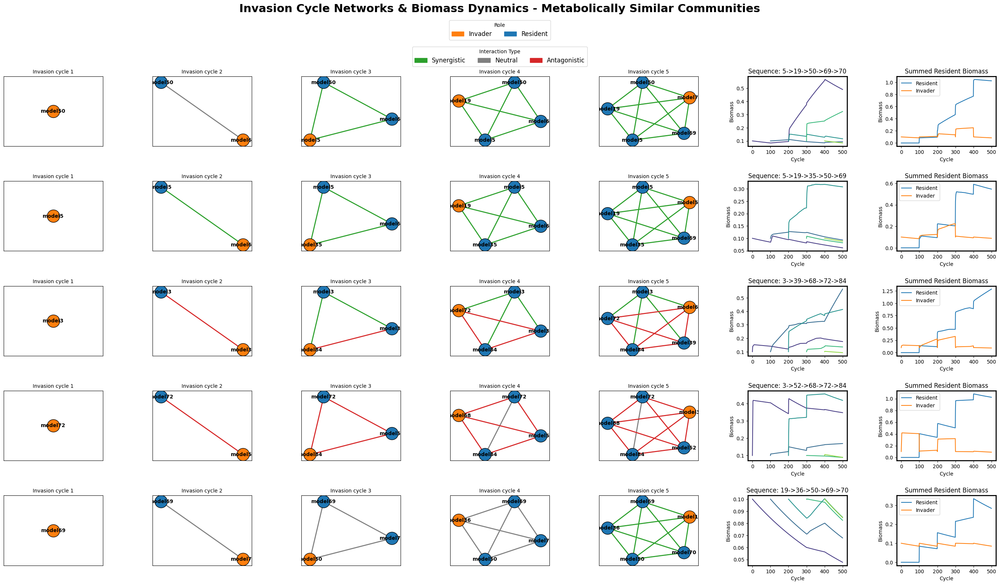

In [132]:
plot_invasion_cycle_analysis(rnetworks_dict, rlseqdict_melted, 'low', "Metabolically Similar Communities")

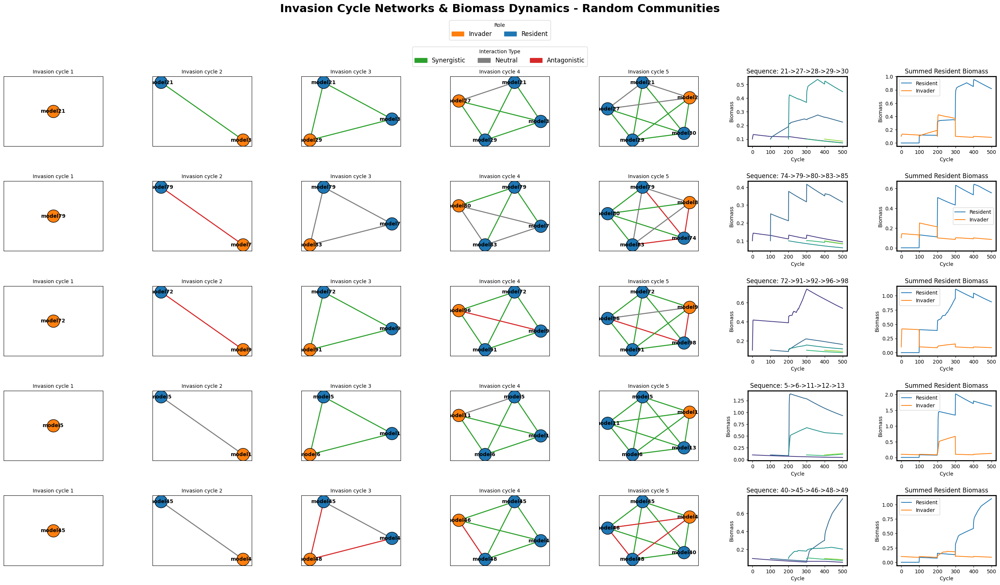

In [133]:
plot_invasion_cycle_analysis(rnetworks_dict, rseqdict_melted, 'random', "Random Communities")

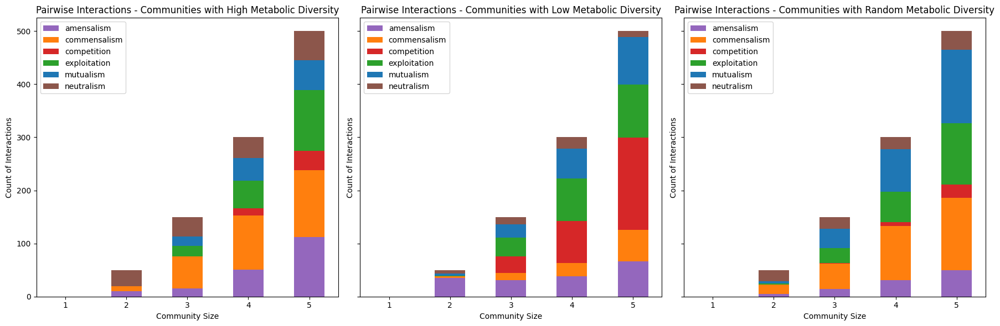

In [540]:
import matplotlib.pyplot as plt
import numpy as np

# Use a colorblind-friendly palette
palette = plt.get_cmap("tab10")

# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
colors = {interaction: palette(i) for i, interaction in enumerate(interaction_types)}
bar_width = 0.5

def plot_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    interaction_types = set()

    # Extract all interaction types dynamically
    for category in categories:
        for size, interactions in interaction_dict[category].items():
            interaction_types.update(interactions.keys())

    interaction_types = sorted(interaction_types)  # Sort for consistent order
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    for idx, category in enumerate(categories):
        ax = axes[idx]
        sizes = sorted(interaction_dict[category].keys())
        data = {itype: [interaction_dict[category].get(size, {}).get(itype, 0) for size in sizes] 
                for itype in interaction_types}

        bottom = np.zeros(len(sizes))  # To stack bars

        for itype in interaction_types:
            ax.bar(sizes, data[itype], label=itype, bottom=bottom, color=colors[itype], width=bar_width)  # Fixed here
            bottom += np.array(data[itype])  # Update bottom for stacking

        ax.set_title(f"Pairwise Interactions - Communities with {category.capitalize()} Metabolic Diversity")
        ax.set_xlabel("Community Size")
        ax.set_ylabel("Count of Interactions")
        ax.legend()

    plt.tight_layout()
    plt.show()

# Plot the stacked bars
plot_stacked_bars(rinteraction_dict)

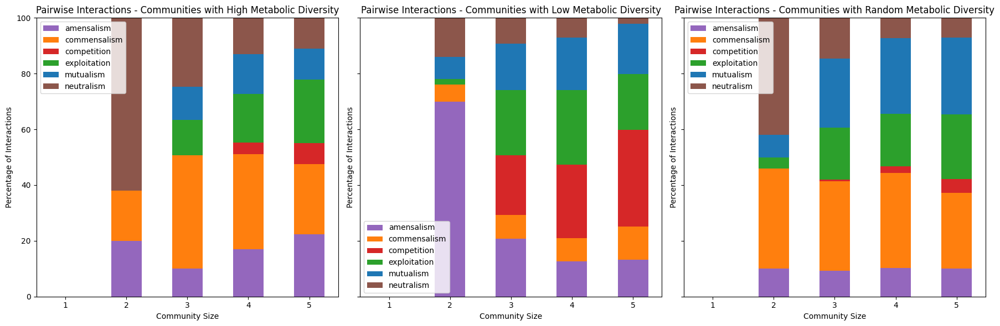

In [539]:
import matplotlib.pyplot as plt
import numpy as np

# Use a colorblind-friendly palette
palette = plt.get_cmap("tab10")

# Define interaction types
interaction_types = [
    "mutualism",
    "commensalism",
    "exploitation",
    "competition",
    "amensalism",
    "neutralism"
]

# Assign colors to interaction types
colors = {interaction: palette(i) for i, interaction in enumerate(interaction_types)}
bar_width = 0.5

def plot_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    interaction_types = set()

    # Extract all interaction types dynamically
    for category in categories:
        for size, interactions in interaction_dict[category].items():
            interaction_types.update(interactions.keys())

    interaction_types = sorted(interaction_types)  # Sort for consistent order
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    for idx, category in enumerate(categories):
        ax = axes[idx]
        sizes = sorted(interaction_dict[category].keys())
        data = {itype: np.array([interaction_dict[category].get(size, {}).get(itype, 0) for size in sizes]) 
                for itype in interaction_types}

        # Compute total interactions per community size
        total_counts = np.sum([data[itype] for itype in interaction_types], axis=0)
        total_counts[total_counts == 0] = 1  # Avoid division by zero

        # Convert raw counts to percentages
        for itype in interaction_types:
            data[itype] = (data[itype] / total_counts) * 100

        bottom = np.zeros(len(sizes))  # Initialize stacking baseline

        for itype in interaction_types:
            ax.bar(sizes, data[itype], label=itype, bottom=bottom, color=colors[itype], width=bar_width)
            bottom += data[itype]  # Update bottom for stacking

        ax.set_title(f"Pairwise Interactions - Communities with {category.capitalize()} Metabolic Diversity")
        ax.set_xlabel("Community Size")
        ax.set_ylabel("Percentage of Interactions")
        ax.set_ylim(0, 100)  # Ensure it is always from 0 to 100
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_stacked_bars(rinteraction_dict)

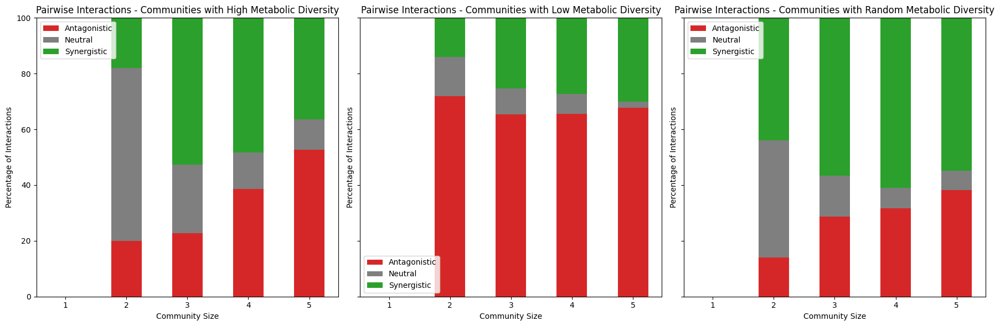

In [134]:
# Define colors for the three main categories
color_map = {
    "synergistic": "#2ca02c",  # Green
    "neutral": "#7f7f7f",      # Gray
    "antagonistic": "#d62728"  # Red
}

# Define interaction type bins
interaction_bins = {
    "synergistic": ["mutualism", "commensalism"],
    "neutral": ["neutralism"],
    "antagonistic": ["exploitation", "competition", "amensalism"]
}

bar_width = 0.5

def plot_stacked_bars(interaction_dict):
    categories = ['high', 'low', 'random']
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    for idx, category in enumerate(categories):
        ax = axes[idx]
        sizes = sorted(interaction_dict[category].keys())

        # Initialize bins
        data = {bin_name: np.zeros(len(sizes)) for bin_name in interaction_bins}

        # Aggregate counts into bins
        for i, size in enumerate(sizes):
            interactions = interaction_dict[category].get(size, {})

            for bin_name, types in interaction_bins.items():
                data[bin_name][i] = sum(interactions.get(itype, 0) for itype in types)

        # Compute total interactions per community size
        total_counts = np.sum([data[bin_name] for bin_name in interaction_bins], axis=0)
        total_counts[total_counts == 0] = 1  # Avoid division by zero

        # Convert raw counts to percentages
        for bin_name in interaction_bins:
            data[bin_name] = (data[bin_name] / total_counts) * 100

        bottom = np.zeros(len(sizes))  # Initialize stacking baseline

        for bin_name in ["antagonistic", "neutral", "synergistic"]:  # Ensure order
            ax.bar(sizes, data[bin_name], label=bin_name.capitalize(), bottom=bottom, 
                   color=color_map[bin_name], width=bar_width)
            bottom += data[bin_name]  # Update bottom for stacking

        ax.set_title(f"Pairwise Interactions - Communities with {category.capitalize()} Metabolic Diversity")
        ax.set_xlabel("Community Size")
        ax.set_ylabel("Percentage of Interactions")
        ax.set_ylim(0, 100)  # Ensure range is always from 0 to 100
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_stacked_bars(rinteraction_dict)
